In [495]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [496]:
df = pd.read_csv('txr_1.csv')

In [497]:
examsttns = df['EXAMSTTN'].value_counts()
for i,j in examsttns.items():
    print(f'{i} : {j}')

DDU : 9553
BLEY : 7087
NKJ : 6594
GD : 5472
BSL : 4854
GIMY : 4095
STA : 3772
RYD : 3711
ICDD : 3680
TICD : 3574
SMP : 3100
KRCA : 3041
BNDM : 2804
FL : 2593
NJPT : 2492
KJGY : 2446
HAPA : 2372
BKEY : 2343
ADTP : 2312
KTTY : 2287
NGCT : 2150
RDM : 2021
BKDC : 1971
BZA : 1875
GY : 1834
BPA : 1815
BRWD : 1813
PTRU : 1811
PRDP : 1677
BJE : 1651
PEH : 1573
DBEC : 1536
OBR : 1480
PKR : 1399
TNPM : 1376
EMTY : 1330
COA : 1272
MLDT : 1271
OEC : 1242
BIA : 1196
SSB : 1180
JSWT : 1169
NHYD : 1148
GMC : 1145
UDLU : 1138
DICD : 1136
NBQY : 1135
HPT : 1075
JTJ : 1070
SGWF : 1063
SMYD : 1062
GHZ : 1062
JUC : 1052
FPY : 1044
PLPC : 1036
UMB : 994
BTI : 991
MRJ : 959
JSWD : 952
BAD : 944
NPRY : 941
DPS : 911
NLPD : 876
NATD : 868
DKJ : 803
ED : 793
WDD : 782
DD : 727
MXA : 721
SNF : 702
ETYD : 654
KLMG : 640
CTKR : 612
TKD : 607
AJNI : 586
LDH : 577
MKPP : 566
REJN : 554
BTTR : 544
CCJS : 530
PGFS : 530
GDGH : 521
CT : 518
MVN : 515
ET : 499
ADRA : 494
IPN : 493
MLPM : 493
CP : 488
JMP : 483
UTCM : 4

## DDU Exam Station - EDA

In [498]:
ddu = df[df['EXAMSTTN'] == 'DDU'].copy()
ddu.count()

RDATE            9553
RAKETYPE         9553
EXAMSTTN         9553
ZONE             9553
ARVLTIME         9553
PLCTTIME         9553
RELSTIME         9553
DPRTTIME         9553
AR_TO_PL         9553
PL_TO_RL         9553
RL_TO_DP         9553
TOTAL_TIME       9553
R_DATEOFMONTH    9553
R_MONTH          9553
R_DAYOFWEEK      9553
R_WEEK           9553
ARVL_H           9553
PLCT_H           9553
RELS_H           9553
DPRT_H           9553
dtype: int64

In [499]:
ddu.nunique()

RDATE             365
RAKETYPE            5
EXAMSTTN            1
ZONE                1
ARVLTIME         9074
PLCTTIME         8984
RELSTIME         8777
DPRTTIME         7624
AR_TO_PL          632
PL_TO_RL          312
RL_TO_DP          886
TOTAL_TIME       1469
R_DATEOFMONTH     365
R_MONTH            12
R_DAYOFWEEK         7
R_WEEK             53
ARVL_H             24
PLCT_H             24
RELS_H             24
DPRT_H             24
dtype: int64

In [500]:
ddu.head()

,RDATE,RAKETYPE,EXAMSTTN,ZONE,ARVLTIME,PLCTTIME,RELSTIME,DPRTTIME,AR_TO_PL,PL_TO_RL,RL_TO_DP,TOTAL_TIME,R_DATEOFMONTH,R_MONTH,R_DAYOFWEEK,R_WEEK,ARVL_H,PLCT_H,RELS_H,DPRT_H
83,2024-04-01,BOXN,DDU,EC,2024-03-31 23:00:00,2024-04-01 06:05:00,2024-04-01 11:40:00,2024-04-01 17:45:00,425,335,365,1125,2024-04-01,2024-04,0,W-14-2024,23,6,11,17
84,2024-04-01,BOXNHL,DDU,EC,2024-03-31 21:30:00,2024-03-31 22:55:00,2024-04-01 03:10:00,2024-04-01 09:47:00,85,255,397,737,2024-04-01,2024-04,0,W-14-2024,21,22,3,9
85,2024-04-01,BOXNHL,DDU,EC,2024-03-31 16:29:00,2024-03-31 17:50:00,2024-03-31 22:00:00,2024-04-01 05:20:00,81,250,440,771,2024-04-01,2024-04,0,W-14-2024,16,17,22,5
86,2024-04-01,BOXN,DDU,EC,2024-04-01 04:00:00,2024-04-01 11:35:00,2024-04-01 11:35:00,2024-04-01 13:40:00,455,0,125,580,2024-04-01,2024-04,0,W-14-2024,4,11,11,13
87,2024-04-01,BOXNHL,DDU,EC,2024-04-01 02:35:00,2024-04-01 04:35:00,2024-04-01 11:30:00,2024-04-01 17:45:00,120,415,375,910,2024-04-01,2024-04,0,W-14-2024,2,4,11,17


In [501]:
print(ddu['RAKETYPE'].nunique())
ddu['RAKETYPE'].value_counts()

5


RAKETYPE
BOXN         5242
BOXNHL       4162
BOXNHL25T     143
SHRN            4
BOXNEL          2
Name: count, dtype: int64

In [502]:
print(ddu['ZONE'].nunique())
ddu['ZONE'].value_counts()

1


ZONE
EC    9553
Name: count, dtype: int64

#### New Features

In [503]:
df1 = ddu.copy()

In [504]:
df1 = df1.sort_values(by='ARVLTIME').reset_index(drop=True)

In [505]:
df1['ARVLTIME'] = pd.to_datetime(df1['ARVLTIME'], format='%Y-%m-%d %H:%M:%S')
df1['PLCTTIME'] = pd.to_datetime(df1['PLCTTIME'], format='%Y-%m-%d %H:%M:%S')
df1['RELSTIME'] = pd.to_datetime(df1['RELSTIME'], format='%Y-%m-%d %H:%M:%S')
df1['DPRTTIME'] = pd.to_datetime(df1['DPRTTIME'], format='%Y-%m-%d %H:%M:%S')

In [506]:
df1

,RDATE,RAKETYPE,EXAMSTTN,ZONE,ARVLTIME,PLCTTIME,RELSTIME,DPRTTIME,AR_TO_PL,PL_TO_RL,RL_TO_DP,TOTAL_TIME,R_DATEOFMONTH,R_MONTH,R_DAYOFWEEK,R_WEEK,ARVL_H,PLCT_H,RELS_H,DPRT_H
0,2024-04-01,BOXN,DDU,EC,2024-03-31 08:25:00,2024-03-31 17:46:00,2024-03-31 21:35:00,2024-04-01 03:20:00,561,229,345,1135,2024-04-01,2024-04,0,W-14-2024,8,17,21,3
1,2024-04-02,BOXNHL,DDU,EC,2024-03-31 09:10:00,2024-04-01 21:30:00,2024-04-02 02:25:00,2024-04-02 06:45:00,2180,295,260,2735,2024-04-02,2024-04,1,W-14-2024,9,21,2,6
2,2024-04-01,BOXN,DDU,EC,2024-03-31 14:40:00,2024-03-31 23:45:00,2024-04-01 05:40:00,2024-04-01 09:52:00,545,355,252,1152,2024-04-01,2024-04,0,W-14-2024,14,23,5,9
3,2024-04-01,BOXN,DDU,EC,2024-03-31 15:43:00,2024-03-31 19:16:00,2024-04-01 00:25:00,2024-04-01 05:20:00,213,309,295,817,2024-04-01,2024-04,0,W-14-2024,15,19,0,5
4,2024-04-01,BOXNHL,DDU,EC,2024-03-31 15:50:00,2024-03-31 16:50:00,2024-03-31 20:40:00,2024-04-01 03:20:00,60,230,400,690,2024-04-01,2024-04,0,W-14-2024,15,16,20,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9548,2025-03-31,BOXN,DDU,EC,2025-03-31 15:30:00,2025-03-31 15:30:00,2025-03-31 15:30:00,2025-03-31 17:15:00,0,0,105,105,2025-03-31,2025-03,0,W-14-2025,15,15,15,17
9549,2025-03-31,BOXNHL,DDU,EC,2025-03-31 17:10:00,2025-03-31 17:10:00,2025-03-31 17:10:00,2025-03-31 19:08:00,0,0,118,118,2025-03-31,2025-03,0,W-14-2025,17,17,17,19
9550,2025-03-31,BOXN,DDU,EC,2025-03-31 17:35:00,2025-03-31 17:35:00,2025-03-31 17:35:00,2025-03-31 19:20:00,0,0,105,105,2025-03-31,2025-03,0,W-14-2025,17,17,17,19
9551,2025-03-31,BOXNHL,DDU,EC,2025-03-31 19:20:00,2025-03-31 19:20:00,2025-03-31 19:20:00,2025-03-31 21:01:00,0,0,101,101,2025-03-31,2025-03,0,W-14-2025,19,19,19,21


In [507]:
# Count of rakes in shunting time (AR_TO_PL) when the current rake arrives
# Shunting time for a rake is from its ARVLTIME to its PLCTTIME

num_rakes_shunting = []
for i, current_rake in df1.iterrows():
    current_arrival_time = current_rake['ARVLTIME']
        
    # Count rakes that have arrived BEFORE or AT current_arrival_time
    # AND whose placement time is AFTER current_arrival_time
    # (meaning they are still in shunting phase)
    # Exclude the current rake itself from the count if its ARVLTIME == current_arrival_time
        
    # Filter for rakes whose shunting period overlaps with the current_arrival_time
    # A rake is in shunting if current_arrival_time is between its ARVLTIME and PLCTTIME
        
    # Filter rakes that started shunting before or at the current rake's arrival time
    potential_rakes = df1[(df1['ARVLTIME'] <= current_arrival_time) & (df1.index != i)]
        
    # From those, count how many are still in shunting phase (their PLCTTIME is in the future relative to current_arrival_time)
    count = potential_rakes[potential_rakes['PLCTTIME'] > current_arrival_time].shape[0]
    num_rakes_shunting.append(count)
df1['Num_Rakes_Shunting_At_ARVL'] = num_rakes_shunting

In [508]:
df1[['ARVLTIME', 'PLCTTIME', 'Num_Rakes_Shunting_At_ARVL']]

,ARVLTIME,PLCTTIME,Num_Rakes_Shunting_At_ARVL
0,2024-03-31 08:25:00,2024-03-31 17:46:00,0
1,2024-03-31 09:10:00,2024-04-01 21:30:00,1
2,2024-03-31 14:40:00,2024-03-31 23:45:00,2
3,2024-03-31 15:43:00,2024-03-31 19:16:00,3
4,2024-03-31 15:50:00,2024-03-31 16:50:00,4
...,...,...,...
9548,2025-03-31 15:30:00,2025-03-31 15:30:00,2
9549,2025-03-31 17:10:00,2025-03-31 17:10:00,0
9550,2025-03-31 17:35:00,2025-03-31 17:35:00,0
9551,2025-03-31 19:20:00,2025-03-31 19:20:00,0


In [509]:
# Count of rakes in examination time (PL_TO_RL) when the current rake arrives
# Examination time for a rake is from its PLCTTIME to its RELSTIME

num_rakes_exam = []
for i, current_rake in df1.iterrows():
    current_arrival_time = current_rake['ARVLTIME']
        
    # Count rakes that have been placed BEFORE or AT current_arrival_time
    # AND whose release time is AFTER current_arrival_time
    # (meaning they are still in examination phase)
            
    potential_rakes = df1[(df1['PLCTTIME'] <= current_arrival_time) & (df1.index != i)]
    count = potential_rakes[potential_rakes['RELSTIME'] > current_arrival_time].shape[0]
    num_rakes_exam.append(count)
df1['Num_Rakes_Exam_At_ARVL'] = num_rakes_exam

In [510]:
df1[['ARVLTIME', 'PLCTTIME', 'RELSTIME', 'Num_Rakes_Exam_At_ARVL']]

,ARVLTIME,PLCTTIME,RELSTIME,Num_Rakes_Exam_At_ARVL
0,2024-03-31 08:25:00,2024-03-31 17:46:00,2024-03-31 21:35:00,0
1,2024-03-31 09:10:00,2024-04-01 21:30:00,2024-04-02 02:25:00,0
2,2024-03-31 14:40:00,2024-03-31 23:45:00,2024-04-01 05:40:00,0
3,2024-03-31 15:43:00,2024-03-31 19:16:00,2024-04-01 00:25:00,0
4,2024-03-31 15:50:00,2024-03-31 16:50:00,2024-03-31 20:40:00,0
...,...,...,...,...
9548,2025-03-31 15:30:00,2025-03-31 15:30:00,2025-03-31 15:30:00,0
9549,2025-03-31 17:10:00,2025-03-31 17:10:00,2025-03-31 17:10:00,2
9550,2025-03-31 17:35:00,2025-03-31 17:35:00,2025-03-31 17:35:00,2
9551,2025-03-31 19:20:00,2025-03-31 19:20:00,2025-03-31 19:20:00,1


In [511]:
# Count of rakes in departure time (RL_TO_DP) when the current rake arrives
# Departure time for a rake is from its RELSTIME to its DPRTTIME

num_rakes_departure = []
for i, current_rake in df1.iterrows():
    current_arrival_time = current_rake['ARVLTIME']
        
    # Count rakes that have been released BEFORE or AT current_arrival_time
    # AND whose departure time is AFTER current_arrival_time
    # (meaning they are still in departure phase)
        
    potential_rakes = df1[(df1['RELSTIME'] <= current_arrival_time) & (df1.index != i)]
    count = potential_rakes[potential_rakes['DPRTTIME'] > current_arrival_time].shape[0]
    num_rakes_departure.append(count)
df1['Num_Rakes_Departure_At_ARVL'] = num_rakes_departure

In [512]:
df1[['ARVLTIME', 'RELSTIME', 'DPRTTIME', 'Num_Rakes_Departure_At_ARVL']]

,ARVLTIME,RELSTIME,DPRTTIME,Num_Rakes_Departure_At_ARVL
0,2024-03-31 08:25:00,2024-03-31 21:35:00,2024-04-01 03:20:00,0
1,2024-03-31 09:10:00,2024-04-02 02:25:00,2024-04-02 06:45:00,0
2,2024-03-31 14:40:00,2024-04-01 05:40:00,2024-04-01 09:52:00,0
3,2024-03-31 15:43:00,2024-04-01 00:25:00,2024-04-01 05:20:00,0
4,2024-03-31 15:50:00,2024-03-31 20:40:00,2024-04-01 03:20:00,0
...,...,...,...,...
9548,2025-03-31 15:30:00,2025-03-31 15:30:00,2025-03-31 17:15:00,2
9549,2025-03-31 17:10:00,2025-03-31 17:10:00,2025-03-31 19:08:00,2
9550,2025-03-31 17:35:00,2025-03-31 17:35:00,2025-03-31 19:20:00,2
9551,2025-03-31 19:20:00,2025-03-31 19:20:00,2025-03-31 21:01:00,1


In [ ]:
num_rakes_exam_at_placement = []
for i, current_rake in df1.iterrows():
    current_placement_time = current_rake['PLCTTIME']
        
    # Identifying other rakes that are in their examination phase at this 'current_placement_time'.
    # A rake 'other_rake' is in examination if:
    # 1. Its placement time (start of exam) is less than or equal to 'current_placement_time'.
    # 2. Its release time (end of exam) is greater than 'current_placement_time'.
    # 3. It is not the 'current_rake' itself (by index).
        
    potential_rakes = df1[(df1['PLCTTIME'] <= current_placement_time) & (df1.index != i)]
    count = potential_rakes[potential_rakes['RELSTIME'] > current_placement_time].shape[0]
    num_rakes_exam_at_placement.append(count)
        
df1['Num_Rakes_Exam_At_PLCT'] = num_rakes_exam_at_placement

In [514]:
df1[['ARVLTIME', 'PLCTTIME', 'RELSTIME', 'DPRTTIME', 'Num_Rakes_Exam_At_PLCT']]

,ARVLTIME,PLCTTIME,RELSTIME,DPRTTIME,Num_Rakes_Exam_At_PLCT
0,2024-03-31 08:25:00,2024-03-31 17:46:00,2024-03-31 21:35:00,2024-04-01 03:20:00,1
1,2024-03-31 09:10:00,2024-04-01 21:30:00,2024-04-02 02:25:00,2024-04-02 06:45:00,3
2,2024-03-31 14:40:00,2024-03-31 23:45:00,2024-04-01 05:40:00,2024-04-01 09:52:00,4
3,2024-03-31 15:43:00,2024-03-31 19:16:00,2024-04-01 00:25:00,2024-04-01 05:20:00,3
4,2024-03-31 15:50:00,2024-03-31 16:50:00,2024-03-31 20:40:00,2024-04-01 03:20:00,0
...,...,...,...,...,...
9548,2025-03-31 15:30:00,2025-03-31 15:30:00,2025-03-31 15:30:00,2025-03-31 17:15:00,0
9549,2025-03-31 17:10:00,2025-03-31 17:10:00,2025-03-31 17:10:00,2025-03-31 19:08:00,2
9550,2025-03-31 17:35:00,2025-03-31 17:35:00,2025-03-31 17:35:00,2025-03-31 19:20:00,2
9551,2025-03-31 19:20:00,2025-03-31 19:20:00,2025-03-31 19:20:00,2025-03-31 21:01:00,1


In [515]:
# Count of rakes in departure time (RL_TO_DP) when the current rake is in its examination time
# This means, for a current rake (i), count others that are in RL_TO_DP phase
# at the current rake's PLCTTIME (start of examination) or RELSTIME (end of examination, start of departure phase)
# The request states "at the point of time when the current rakes is in their examination time".
# Let's interpret this as the *start* of the current rake's examination, which is PLCTTIME, as it's a fixed point.

num_rakes_departure_at_placement = []
for i, current_rake in df1.iterrows():
    current_placement_time = current_rake['PLCTTIME']
        
    # Count rakes that have been released BEFORE or AT current_placement_time
    # AND whose departure time is AFTER current_placement_time
    # (meaning they are still in departure phase)
    # Exclude the current rake itself if its RELSTIME or DPRTTIME overlap (though unlikely here)
        
    potential_rakes = df1[(df1['RELSTIME'] <= current_placement_time) & (df1.index != i)]
    count = potential_rakes[potential_rakes['DPRTTIME'] > current_placement_time].shape[0]
    num_rakes_departure_at_placement.append(count)
df1['Num_Rakes_Departure_At_PLCT'] = num_rakes_departure_at_placement

In [516]:
df1[['ARVLTIME', 'PLCTTIME', 'RELSTIME', 'DPRTTIME', 'Num_Rakes_Departure_At_PLCT']]

,ARVLTIME,PLCTTIME,RELSTIME,DPRTTIME,Num_Rakes_Departure_At_PLCT
0,2024-03-31 08:25:00,2024-03-31 17:46:00,2024-03-31 21:35:00,2024-04-01 03:20:00,0
1,2024-03-31 09:10:00,2024-04-01 21:30:00,2024-04-02 02:25:00,2024-04-02 06:45:00,5
2,2024-03-31 14:40:00,2024-03-31 23:45:00,2024-04-01 05:40:00,2024-04-01 09:52:00,3
3,2024-03-31 15:43:00,2024-03-31 19:16:00,2024-04-01 00:25:00,2024-04-01 05:20:00,0
4,2024-03-31 15:50:00,2024-03-31 16:50:00,2024-03-31 20:40:00,2024-04-01 03:20:00,0
...,...,...,...,...,...
9548,2025-03-31 15:30:00,2025-03-31 15:30:00,2025-03-31 15:30:00,2025-03-31 17:15:00,2
9549,2025-03-31 17:10:00,2025-03-31 17:10:00,2025-03-31 17:10:00,2025-03-31 19:08:00,2
9550,2025-03-31 17:35:00,2025-03-31 17:35:00,2025-03-31 17:35:00,2025-03-31 19:20:00,2
9551,2025-03-31 19:20:00,2025-03-31 19:20:00,2025-03-31 19:20:00,2025-03-31 21:01:00,1


In [ ]:
num_rakes_departure_at_release = []
for i, current_rake in df1.iterrows():
    current_release_time = current_rake['RELSTIME']
        
    # Identifying other rakes that are in their departure phase at this 'current_release_time'.
    # A rake 'other_rake' is in departure if:
    # 1. Its release time (start of departure) is less than or equal to 'current_release_time'.
    # 2. Its departure time (end of departure) is greater than 'current_release_time'.
    # 3. It is not the 'current_rake' itself (by index).
        
    potential_rakes = df1[(df1['RELSTIME'] <= current_release_time) & (df1.index != i)]
    count = potential_rakes[potential_rakes['DPRTTIME'] > current_release_time].shape[0]
    num_rakes_departure_at_release.append(count)
        
df1['Num_Rakes_Departure_At_RELS'] = num_rakes_departure_at_release

In [518]:
df1[['ARVLTIME', 'PLCTTIME', 'RELSTIME', 'DPRTTIME', 'Num_Rakes_Departure_At_RELS']]

,ARVLTIME,PLCTTIME,RELSTIME,DPRTTIME,Num_Rakes_Departure_At_RELS
0,2024-03-31 08:25:00,2024-03-31 17:46:00,2024-03-31 21:35:00,2024-04-01 03:20:00,1
1,2024-03-31 09:10:00,2024-04-01 21:30:00,2024-04-02 02:25:00,2024-04-02 06:45:00,4
2,2024-03-31 14:40:00,2024-03-31 23:45:00,2024-04-01 05:40:00,2024-04-01 09:52:00,3
3,2024-03-31 15:43:00,2024-03-31 19:16:00,2024-04-01 00:25:00,2024-04-01 05:20:00,5
4,2024-03-31 15:50:00,2024-03-31 16:50:00,2024-03-31 20:40:00,2024-04-01 03:20:00,0
...,...,...,...,...,...
9548,2025-03-31 15:30:00,2025-03-31 15:30:00,2025-03-31 15:30:00,2025-03-31 17:15:00,2
9549,2025-03-31 17:10:00,2025-03-31 17:10:00,2025-03-31 17:10:00,2025-03-31 19:08:00,2
9550,2025-03-31 17:35:00,2025-03-31 17:35:00,2025-03-31 17:35:00,2025-03-31 19:20:00,2
9551,2025-03-31 19:20:00,2025-03-31 19:20:00,2025-03-31 19:20:00,2025-03-31 21:01:00,1


In [519]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9553 entries, 0 to 9552
Data columns (total 26 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   RDATE                        9553 non-null   object        
 1   RAKETYPE                     9553 non-null   object        
 2   EXAMSTTN                     9553 non-null   object        
 3   ZONE                         9553 non-null   object        
 4   ARVLTIME                     9553 non-null   datetime64[ns]
 5   PLCTTIME                     9553 non-null   datetime64[ns]
 6   RELSTIME                     9553 non-null   datetime64[ns]
 7   DPRTTIME                     9553 non-null   datetime64[ns]
 8   AR_TO_PL                     9553 non-null   int64         
 9   PL_TO_RL                     9553 non-null   int64         
 10  RL_TO_DP                     9553 non-null   int64         
 11  TOTAL_TIME                   9553 non-null 

In [520]:
# Time since last Arrival
df1 = df1.sort_values(by='ARVLTIME').reset_index(drop=True)
df1['Time_Since_Last_ARVL'] = df1.groupby('EXAMSTTN')['ARVLTIME'].diff().dt.total_seconds()//60

In [521]:
# Time since last Placement
df1 = df1.sort_values(by='PLCTTIME').reset_index(drop=True)
df1['Time_Since_Last_PLCT'] = df1.groupby('EXAMSTTN')['PLCTTIME'].diff().dt.total_seconds()//60

In [522]:
df1 = df1.sort_values(by='RELSTIME').reset_index(drop=True)
df1['Time_Since_Last_RELS'] = df1.groupby('EXAMSTTN')['RELSTIME'].diff().dt.total_seconds()//60

In [523]:
df1 = df1.sort_values(by='DPRTTIME').reset_index(drop=True)
df1['Time_Since_Last_DPRT'] = df1.groupby('EXAMSTTN')['DPRTTIME'].diff().dt.total_seconds()//60

In [524]:
df1[['Time_Since_Last_ARVL', 'Time_Since_Last_PLCT', 'Time_Since_Last_RELS', 'Time_Since_Last_DPRT']] = \
    df1[['Time_Since_Last_ARVL', 'Time_Since_Last_PLCT', 'Time_Since_Last_RELS', 'Time_Since_Last_DPRT']].fillna(0)

In [525]:
df1 = df1.sort_values(by='ARVLTIME').reset_index(drop=True)

In [526]:
df1[['ARVLTIME', 'Time_Since_Last_ARVL', 'Time_Since_Last_PLCT', 'Time_Since_Last_RELS', 'Time_Since_Last_DPRT']]

,ARVLTIME,Time_Since_Last_ARVL,Time_Since_Last_PLCT,Time_Since_Last_RELS,Time_Since_Last_DPRT
0,2024-03-31 08:25:00,0.0,56.0,55.0,0.0
1,2024-03-31 09:10:00,45.0,40.0,135.0,29.0
2,2024-03-31 14:40:00,330.0,50.0,40.0,2.0
3,2024-03-31 15:43:00,63.0,86.0,0.0,0.0
4,2024-03-31 15:50:00,7.0,0.0,0.0,120.0
...,...,...,...,...,...
9548,2025-03-31 15:30:00,41.0,80.0,80.0,14.0
9549,2025-03-31 17:10:00,100.0,40.0,100.0,82.0
9550,2025-03-31 17:35:00,25.0,25.0,25.0,12.0
9551,2025-03-31 19:20:00,105.0,105.0,105.0,1.0


In [527]:
df1.drop(columns=['ARVLTIME','PLCTTIME','RELSTIME','DPRTTIME'], axis=1, inplace=True)

In [528]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9553 entries, 0 to 9552
Data columns (total 26 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   RDATE                        9553 non-null   object 
 1   RAKETYPE                     9553 non-null   object 
 2   EXAMSTTN                     9553 non-null   object 
 3   ZONE                         9553 non-null   object 
 4   AR_TO_PL                     9553 non-null   int64  
 5   PL_TO_RL                     9553 non-null   int64  
 6   RL_TO_DP                     9553 non-null   int64  
 7   TOTAL_TIME                   9553 non-null   int64  
 8   R_DATEOFMONTH                9553 non-null   object 
 9   R_MONTH                      9553 non-null   object 
 10  R_DAYOFWEEK                  9553 non-null   int64  
 11  R_WEEK                       9553 non-null   object 
 12  ARVL_H                       9553 non-null   int64  
 13  PLCT_H            

#### Monthly Analysis

In [529]:
ddu_monthly = df1['R_MONTH'].value_counts(sort=False).reset_index()
ddu_monthly.columns =['R_MONTH','RAKE_COUNT']
ddu_monthly = pd.DataFrame(ddu_monthly)

monthly_shunting_time_sum = df1.groupby('R_MONTH', sort=False)['AR_TO_PL'].sum().reset_index(name='Shunting_Time')
monthly_examination_time_sum = df1.groupby('R_MONTH', sort=False)['PL_TO_RL'].sum().reset_index(name='Examination_Time')
monthly_departure_lag_time_sum = df1.groupby('R_MONTH', sort=False)['RL_TO_DP'].sum().reset_index(name='Departure_Lag')
monthly_numrakes1 = df1.groupby('R_MONTH', sort=False)['Num_Rakes_Shunting_At_ARVL'].sum().reset_index(name='numrakes1')
monthly_numrakes2 = df1.groupby('R_MONTH', sort=False)['Num_Rakes_Exam_At_ARVL'].sum().reset_index(name='numrakes2')
monthly_numrakes3 = df1.groupby('R_MONTH', sort=False)['Num_Rakes_Departure_At_ARVL'].sum().reset_index(name='numrakes3')
monthly_numrakes4 = df1.groupby('R_MONTH', sort=False)['Num_Rakes_Exam_At_PLCT'].sum().reset_index(name='numrakes4')
monthly_numrakes5 = df1.groupby('R_MONTH', sort=False)['Num_Rakes_Departure_At_PLCT'].sum().reset_index(name='numrakes5')
monthly_numrakes6 = df1.groupby('R_MONTH', sort=False)['Num_Rakes_Departure_At_RELS'].sum().reset_index(name='numrakes6')
monthly_timesince1 = df1.groupby('R_MONTH', sort=False)['Time_Since_Last_ARVL'].sum().reset_index(name='timesince1')
monthly_timesince2 = df1.groupby('R_MONTH', sort=False)['Time_Since_Last_PLCT'].sum().reset_index(name='timesince2')
monthly_timesince3 = df1.groupby('R_MONTH', sort=False)['Time_Since_Last_RELS'].sum().reset_index(name='timesince3')
monthly_timesince4 = df1.groupby('R_MONTH', sort=False)['Time_Since_Last_DPRT'].sum().reset_index(name='timesince4')

ddu_monthly['AVG_SHUNTING_TIME'] = monthly_shunting_time_sum['Shunting_Time'] / ddu_monthly['RAKE_COUNT']
ddu_monthly['AVG_EXAMINATION_TIME'] = monthly_examination_time_sum['Examination_Time'] / ddu_monthly['RAKE_COUNT']
ddu_monthly['AVG_DEPARTURE_TIME'] = monthly_departure_lag_time_sum['Departure_Lag'] / ddu_monthly['RAKE_COUNT']
ddu_monthly['AVG_Num_Rakes_Shunting_At_ARVL'] = monthly_numrakes1['numrakes1'] / ddu_monthly['RAKE_COUNT']
ddu_monthly['AVG_Num_Rakes_Exam_At_ARVL'] = monthly_numrakes2['numrakes2'] / ddu_monthly['RAKE_COUNT']
ddu_monthly['AVG_Num_Rakes_Departure_At_ARVL'] = monthly_numrakes3['numrakes3'] / ddu_monthly['RAKE_COUNT']
ddu_monthly['AVG_Num_Rakes_Exam_At_PLCT'] = monthly_numrakes4['numrakes4'] / ddu_monthly['RAKE_COUNT']
ddu_monthly['AVG_Num_Rakes_Departure_At_PLCT'] = monthly_numrakes5['numrakes5'] / ddu_monthly['RAKE_COUNT']
ddu_monthly['AVG_Num_Rakes_Departure_At_RELS'] = monthly_numrakes6['numrakes6'] / ddu_monthly['RAKE_COUNT']
ddu_monthly['AVG_Time_Since_Last_ARVL'] = monthly_timesince1['timesince1'] / ddu_monthly['RAKE_COUNT']
ddu_monthly['AVG_Time_Since_Last_PLCT'] = monthly_timesince2['timesince2'] / ddu_monthly['RAKE_COUNT']
ddu_monthly['AVG_Time_Since_Last_RELS'] = monthly_timesince3['timesince3'] / ddu_monthly['RAKE_COUNT']
ddu_monthly['AVG_Time_Since_Last_DPRT'] = monthly_timesince4['timesince4'] / ddu_monthly['RAKE_COUNT']

ddu_monthly

,R_MONTH,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME,AVG_Num_Rakes_Shunting_At_ARVL,AVG_Num_Rakes_Exam_At_ARVL,AVG_Num_Rakes_Departure_At_ARVL,AVG_Num_Rakes_Exam_At_PLCT,AVG_Num_Rakes_Departure_At_PLCT,AVG_Num_Rakes_Departure_At_RELS,AVG_Time_Since_Last_ARVL,AVG_Time_Since_Last_PLCT,AVG_Time_Since_Last_RELS,AVG_Time_Since_Last_DPRT
0,2024-04,809,67.358467,127.834363,306.224969,1.227441,2.354759,5.814586,2.365884,5.809642,5.845488,54.006180,53.325093,53.201483,53.353523
1,2024-05,906,89.151214,133.349890,296.183223,1.889625,2.698675,6.197572,2.672185,6.139073,6.077263,48.856512,49.216336,48.995585,49.260486
2,2024-06,891,94.177329,136.518519,356.652076,1.947250,2.711560,7.356902,2.661055,7.379349,7.153760,48.787879,48.444444,48.653199,48.507295
3,2024-07,867,89.993080,140.174164,306.439446,2.094579,2.704729,5.928489,2.649366,5.986159,5.918108,51.219146,51.362168,51.407151,51.326413
4,2024-08,778,217.523136,167.750643,359.795630,3.435733,2.763496,6.494859,2.768638,6.496144,6.404884,57.726221,57.544987,57.615681,57.487147
5,2024-09,809,83.416564,148.791100,281.902349,1.582200,2.760198,5.402967,2.751545,5.364648,5.244747,53.328801,53.684796,53.548826,53.362176
6,2024-10,978,124.656442,160.657464,271.710634,2.699387,3.469325,5.962168,3.304703,6.011247,5.853783,45.142127,45.254601,45.607362,45.690184
7,2024-11,578,117.799308,167.219723,233.121107,1.612457,2.347751,3.287197,2.278547,3.283737,3.166090,75.361592,74.956747,74.264706,74.418685
8,2024-12,848,123.045991,154.449292,269.241745,2.391509,2.988208,5.266509,2.869104,5.312500,5.176887,52.883255,52.753538,52.841981,52.813679
9,2025-01,659,115.122914,144.858877,308.792109,1.776935,2.345979,5.012140,2.244310,4.971168,4.845220,68.233687,68.042489,67.905918,67.831563


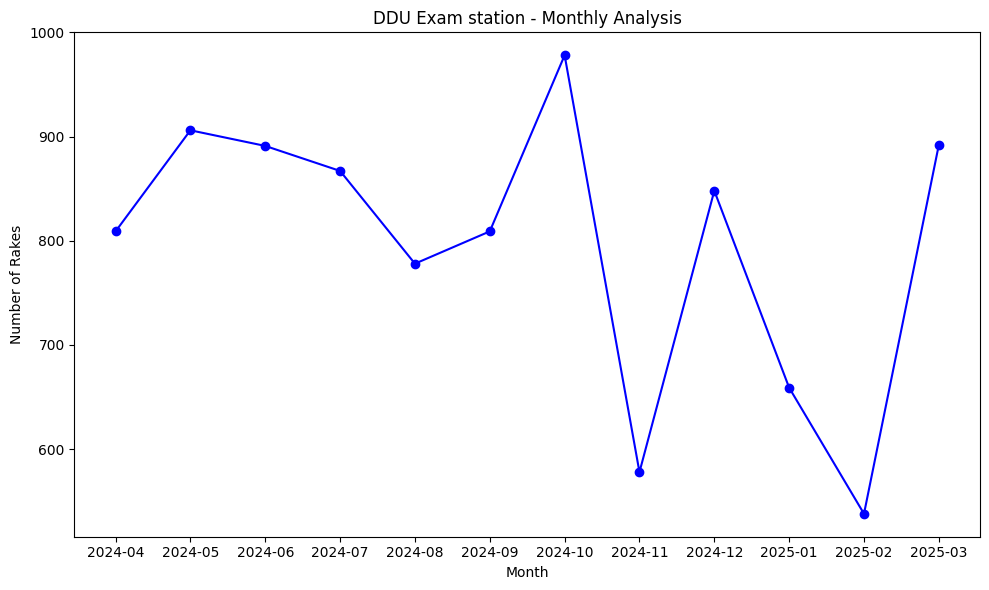

In [530]:
plt.figure(figsize=(10,6))
plt.plot(ddu_monthly['R_MONTH'], ddu_monthly['RAKE_COUNT'], marker='o', linestyle='-', color='blue')
plt.title('DDU Exam station - Monthly Analysis')
plt.xlabel('Month')
plt.ylabel('Number of Rakes')
plt.tight_layout()
plt.show()

C:\Users\anant\AppData\Local\Temp\ipykernel_12904\537275855.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=ddu_monthly['R_MONTH'], y=ddu_monthly['AVG_SHUNTING_TIME'], palette='viridis', ax=axes[0, 1])
C:\Users\anant\AppData\Local\Temp\ipykernel_12904\537275855.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=ddu_monthly['R_MONTH'], y=ddu_monthly['AVG_EXAMINATION_TIME'], palette='viridis', ax=axes[1, 0])
C:\Users\anant\AppData\Local\Temp\ipykernel_12904\537275855.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=ddu_monthly

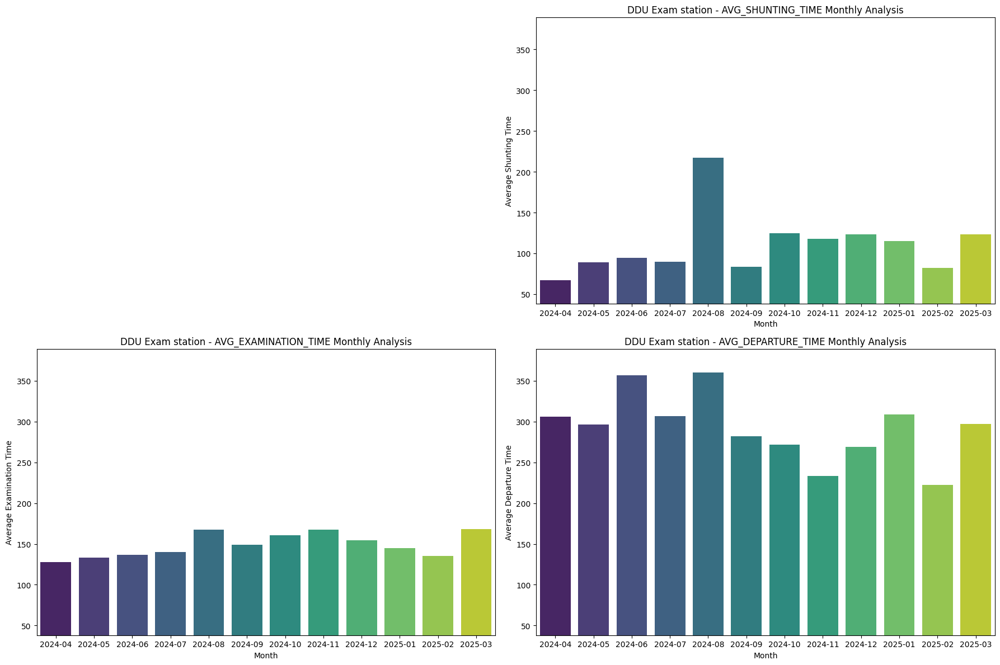

In [531]:
min_y = min(ddu_monthly['AVG_SHUNTING_TIME'].min(),
            ddu_monthly['AVG_EXAMINATION_TIME'].min(),
            ddu_monthly['AVG_DEPARTURE_TIME'].min())

max_y = max(ddu_monthly['AVG_SHUNTING_TIME'].max(),
            ddu_monthly['AVG_EXAMINATION_TIME'].max(),
            ddu_monthly['AVG_DEPARTURE_TIME'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

axes[0, 0].axis('off')

sns.barplot(x=ddu_monthly['R_MONTH'], y=ddu_monthly['AVG_SHUNTING_TIME'], palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('DDU Exam station - AVG_SHUNTING_TIME Monthly Analysis')
axes[0, 1].set_xlabel('Month')
axes[0, 1].set_ylabel('Average Shunting Time')
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=ddu_monthly['R_MONTH'], y=ddu_monthly['AVG_EXAMINATION_TIME'], palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('DDU Exam station - AVG_EXAMINATION_TIME Monthly Analysis')
axes[1, 0].set_xlabel('Month')
axes[1, 0].set_ylabel('Average Examination Time')
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=ddu_monthly['R_MONTH'], y=ddu_monthly['AVG_DEPARTURE_TIME'], palette='viridis', ax=axes[1, 1])
axes[1, 1].set_title('DDU Exam station - AVG_DEPARTURE_TIME Monthly Analysis')
axes[1, 1].set_xlabel('Month')
axes[1, 1].set_ylabel('Average Departure Time')
axes[1, 1].set_ylim(y_lower_bound, y_upper_bound)

plt.tight_layout()
plt.show()

C:\Users\anant\AppData\Local\Temp\ipykernel_12904\2546854158.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=ddu_monthly['R_MONTH'], y=ddu_monthly['AVG_Num_Rakes_Shunting_At_ARVL'], palette='viridis', ax=axes[0, 0])
C:\Users\anant\AppData\Local\Temp\ipykernel_12904\2546854158.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=ddu_monthly['R_MONTH'], y=ddu_monthly['AVG_Num_Rakes_Exam_At_ARVL'], palette='viridis', ax=axes[0, 1])
C:\Users\anant\AppData\Local\Temp\ipykernel_12904\2546854158.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns

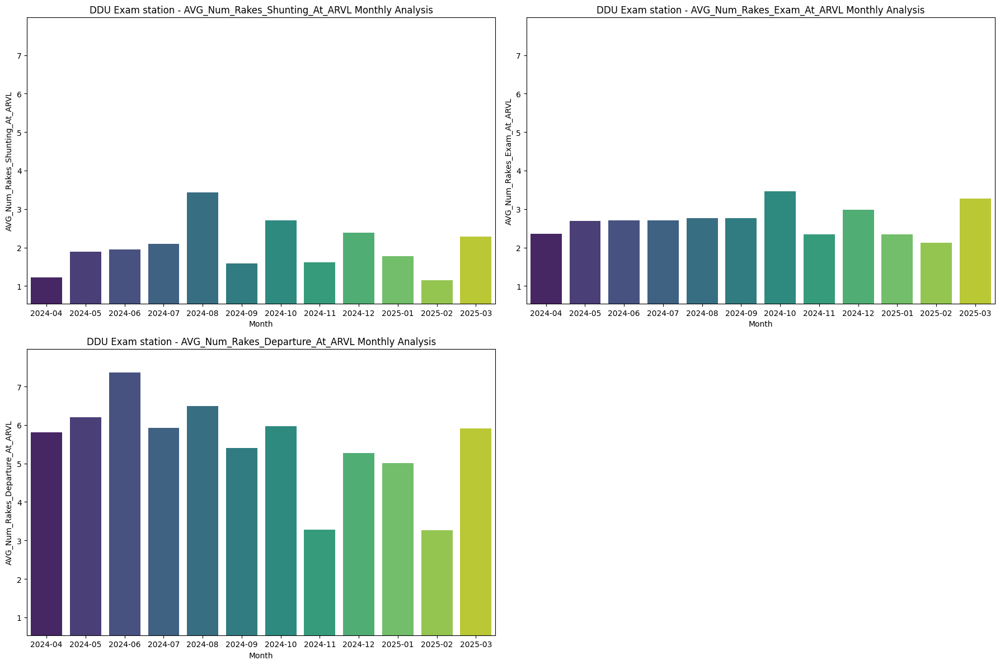

In [532]:
min_y = min(ddu_monthly['AVG_Num_Rakes_Shunting_At_ARVL'].min(),
            ddu_monthly['AVG_Num_Rakes_Exam_At_ARVL'].min(),
            ddu_monthly['AVG_Num_Rakes_Departure_At_ARVL'].min())

max_y = max(ddu_monthly['AVG_Num_Rakes_Shunting_At_ARVL'].max(),
            ddu_monthly['AVG_Num_Rakes_Exam_At_ARVL'].max(),
            ddu_monthly['AVG_Num_Rakes_Departure_At_ARVL'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(x=ddu_monthly['R_MONTH'], y=ddu_monthly['AVG_Num_Rakes_Shunting_At_ARVL'], palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('DDU Exam station - AVG_Num_Rakes_Shunting_At_ARVL Monthly Analysis')
axes[0, 0].set_xlabel('Month')
axes[0, 0].set_ylabel('AVG_Num_Rakes_Shunting_At_ARVL')
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=ddu_monthly['R_MONTH'], y=ddu_monthly['AVG_Num_Rakes_Exam_At_ARVL'], palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('DDU Exam station - AVG_Num_Rakes_Exam_At_ARVL Monthly Analysis')
axes[0, 1].set_xlabel('Month')
axes[0, 1].set_ylabel('AVG_Num_Rakes_Exam_At_ARVL')
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=ddu_monthly['R_MONTH'], y=ddu_monthly['AVG_Num_Rakes_Departure_At_ARVL'], palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('DDU Exam station - AVG_Num_Rakes_Departure_At_ARVL Monthly Analysis')
axes[1, 0].set_xlabel('Month')
axes[1, 0].set_ylabel('AVG_Num_Rakes_Departure_At_ARVL')
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)

axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

C:\Users\anant\AppData\Local\Temp\ipykernel_12904\3129585347.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=ddu_monthly['R_MONTH'], y=ddu_monthly['AVG_Num_Rakes_Exam_At_PLCT'], palette='viridis', ax=axes[0, 0])
C:\Users\anant\AppData\Local\Temp\ipykernel_12904\3129585347.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=ddu_monthly['R_MONTH'], y=ddu_monthly['AVG_Num_Rakes_Departure_At_PLCT'], palette='viridis', ax=axes[0, 1])
C:\Users\anant\AppData\Local\Temp\ipykernel_12904\3129585347.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sn

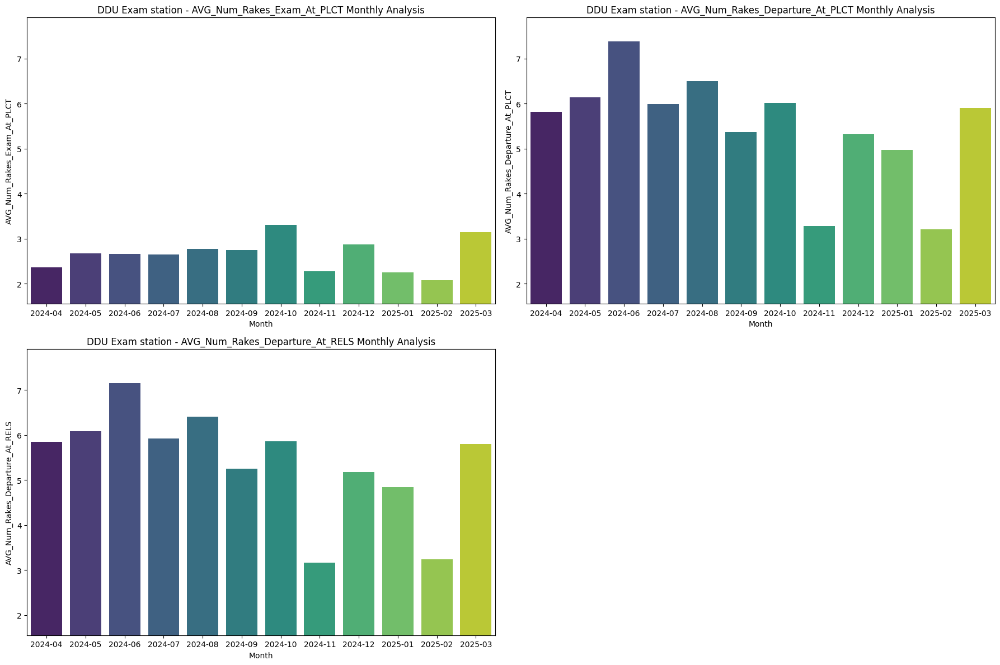

In [533]:
min_y = min(ddu_monthly['AVG_Num_Rakes_Exam_At_PLCT'].min(),
            ddu_monthly['AVG_Num_Rakes_Departure_At_PLCT'].min(),
            ddu_monthly['AVG_Num_Rakes_Departure_At_RELS'].min())

max_y = max(ddu_monthly['AVG_Num_Rakes_Exam_At_PLCT'].max(),
            ddu_monthly['AVG_Num_Rakes_Departure_At_PLCT'].max(),
            ddu_monthly['AVG_Num_Rakes_Departure_At_RELS'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(x=ddu_monthly['R_MONTH'], y=ddu_monthly['AVG_Num_Rakes_Exam_At_PLCT'], palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('DDU Exam station - AVG_Num_Rakes_Exam_At_PLCT Monthly Analysis')
axes[0, 0].set_xlabel('Month')
axes[0, 0].set_ylabel('AVG_Num_Rakes_Exam_At_PLCT')
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=ddu_monthly['R_MONTH'], y=ddu_monthly['AVG_Num_Rakes_Departure_At_PLCT'], palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('DDU Exam station - AVG_Num_Rakes_Departure_At_PLCT Monthly Analysis')
axes[0, 1].set_xlabel('Month')
axes[0, 1].set_ylabel('AVG_Num_Rakes_Departure_At_PLCT')
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=ddu_monthly['R_MONTH'], y=ddu_monthly['AVG_Num_Rakes_Departure_At_RELS'], palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('DDU Exam station - AVG_Num_Rakes_Departure_At_RELS Monthly Analysis')
axes[1, 0].set_xlabel('Month')
axes[1, 0].set_ylabel('AVG_Num_Rakes_Departure_At_RELS')
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)

axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

In [534]:
ddu_monthly

,R_MONTH,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME,AVG_Num_Rakes_Shunting_At_ARVL,AVG_Num_Rakes_Exam_At_ARVL,AVG_Num_Rakes_Departure_At_ARVL,AVG_Num_Rakes_Exam_At_PLCT,AVG_Num_Rakes_Departure_At_PLCT,AVG_Num_Rakes_Departure_At_RELS,AVG_Time_Since_Last_ARVL,AVG_Time_Since_Last_PLCT,AVG_Time_Since_Last_RELS,AVG_Time_Since_Last_DPRT
0,2024-04,809,67.358467,127.834363,306.224969,1.227441,2.354759,5.814586,2.365884,5.809642,5.845488,54.006180,53.325093,53.201483,53.353523
1,2024-05,906,89.151214,133.349890,296.183223,1.889625,2.698675,6.197572,2.672185,6.139073,6.077263,48.856512,49.216336,48.995585,49.260486
2,2024-06,891,94.177329,136.518519,356.652076,1.947250,2.711560,7.356902,2.661055,7.379349,7.153760,48.787879,48.444444,48.653199,48.507295
3,2024-07,867,89.993080,140.174164,306.439446,2.094579,2.704729,5.928489,2.649366,5.986159,5.918108,51.219146,51.362168,51.407151,51.326413
4,2024-08,778,217.523136,167.750643,359.795630,3.435733,2.763496,6.494859,2.768638,6.496144,6.404884,57.726221,57.544987,57.615681,57.487147
5,2024-09,809,83.416564,148.791100,281.902349,1.582200,2.760198,5.402967,2.751545,5.364648,5.244747,53.328801,53.684796,53.548826,53.362176
6,2024-10,978,124.656442,160.657464,271.710634,2.699387,3.469325,5.962168,3.304703,6.011247,5.853783,45.142127,45.254601,45.607362,45.690184
7,2024-11,578,117.799308,167.219723,233.121107,1.612457,2.347751,3.287197,2.278547,3.283737,3.166090,75.361592,74.956747,74.264706,74.418685
8,2024-12,848,123.045991,154.449292,269.241745,2.391509,2.988208,5.266509,2.869104,5.312500,5.176887,52.883255,52.753538,52.841981,52.813679
9,2025-01,659,115.122914,144.858877,308.792109,1.776935,2.345979,5.012140,2.244310,4.971168,4.845220,68.233687,68.042489,67.905918,67.831563


C:\Users\anant\AppData\Local\Temp\ipykernel_12904\3556451336.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=ddu_monthly['R_MONTH'], y=ddu_monthly['AVG_Time_Since_Last_ARVL'], palette='viridis', ax=axes[0, 0])
C:\Users\anant\AppData\Local\Temp\ipykernel_12904\3556451336.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=ddu_monthly['R_MONTH'], y=ddu_monthly['AVG_Time_Since_Last_PLCT'], palette='viridis', ax=axes[0, 1])
C:\Users\anant\AppData\Local\Temp\ipykernel_12904\3556451336.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot

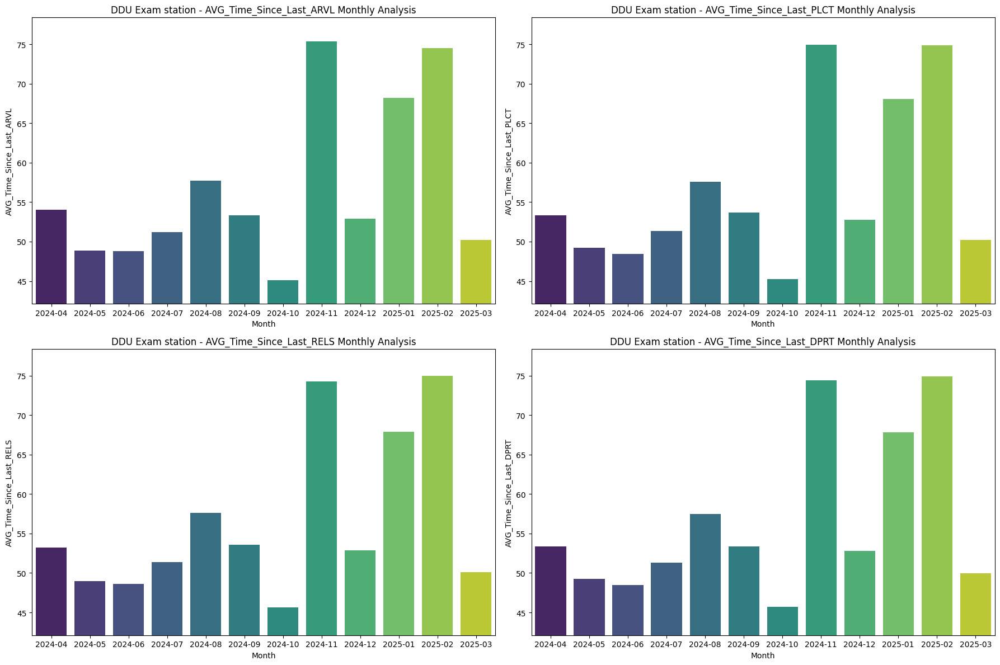

In [535]:
min_y = min(ddu_monthly['AVG_Time_Since_Last_ARVL'].min(),
            ddu_monthly['AVG_Time_Since_Last_PLCT'].min(),
            ddu_monthly['AVG_Time_Since_Last_RELS'].min(),
            ddu_monthly['AVG_Time_Since_Last_DPRT'].min())

max_y = max(ddu_monthly['AVG_Time_Since_Last_ARVL'].max(),
            ddu_monthly['AVG_Time_Since_Last_PLCT'].max(),
            ddu_monthly['AVG_Time_Since_Last_RELS'].max(),
            ddu_monthly['AVG_Time_Since_Last_DPRT'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(x=ddu_monthly['R_MONTH'], y=ddu_monthly['AVG_Time_Since_Last_ARVL'], palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('DDU Exam station - AVG_Time_Since_Last_ARVL Monthly Analysis')
axes[0, 0].set_xlabel('Month')
axes[0, 0].set_ylabel('AVG_Time_Since_Last_ARVL')
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=ddu_monthly['R_MONTH'], y=ddu_monthly['AVG_Time_Since_Last_PLCT'], palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('DDU Exam station - AVG_Time_Since_Last_PLCT Monthly Analysis')
axes[0, 1].set_xlabel('Month')
axes[0, 1].set_ylabel('AVG_Time_Since_Last_PLCT')
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=ddu_monthly['R_MONTH'], y=ddu_monthly['AVG_Time_Since_Last_RELS'], palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('DDU Exam station - AVG_Time_Since_Last_RELS Monthly Analysis')
axes[1, 0].set_xlabel('Month')
axes[1, 0].set_ylabel('AVG_Time_Since_Last_RELS')
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=ddu_monthly['R_MONTH'], y=ddu_monthly['AVG_Time_Since_Last_DPRT'], palette='viridis', ax=axes[1, 1])
axes[1, 1].set_title('DDU Exam station - AVG_Time_Since_Last_DPRT Monthly Analysis')
axes[1, 1].set_xlabel('Month')
axes[1, 1].set_ylabel('AVG_Time_Since_Last_DPRT')
axes[1, 1].set_ylim(y_lower_bound, y_upper_bound)

plt.tight_layout()
plt.show()

In [536]:
monthly_rake_type_count = df1.groupby(['R_MONTH', 'RAKETYPE'])['RDATE'].count().reset_index(name='RAKE_COUNT')
monthly_rake_type_count = pd.DataFrame(monthly_rake_type_count)

monthly_shunting_time_sum = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['AR_TO_PL'].sum().reset_index(name='Shunting_Time')
monthly_examination_time_sum = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['PL_TO_RL'].sum().reset_index(name='Examination_Time')
monthly_departure_lag_time_sum = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['RL_TO_DP'].sum().reset_index(name='Departure_Lag')
monthly_numrakes1 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Num_Rakes_Shunting_At_ARVL'].sum().reset_index(name='numrakes1')
monthly_numrakes2 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Num_Rakes_Exam_At_ARVL'].sum().reset_index(name='numrakes2')
monthly_numrakes3 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Num_Rakes_Departure_At_ARVL'].sum().reset_index(name='numrakes3')
monthly_numrakes4 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Num_Rakes_Exam_At_PLCT'].sum().reset_index(name='numrakes4')
monthly_numrakes5 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Num_Rakes_Departure_At_PLCT'].sum().reset_index(name='numrakes5')
monthly_numrakes6 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Num_Rakes_Departure_At_RELS'].sum().reset_index(name='numrakes6')
monthly_timesince1 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Time_Since_Last_ARVL'].sum().reset_index(name='timesince1')
monthly_timesince2 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Time_Since_Last_PLCT'].sum().reset_index(name='timesince2')
monthly_timesince3 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Time_Since_Last_RELS'].sum().reset_index(name='timesince3')
monthly_timesince4 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Time_Since_Last_DPRT'].sum().reset_index(name='timesince4')

monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_shunting_time_sum, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_SHUNTING_TIME'] = monthly_rake_type_count['Shunting_Time'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_examination_time_sum, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_EXAMINATION_TIME'] = monthly_rake_type_count['Examination_Time'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_departure_lag_time_sum, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_DEPARTURE_TIME'] = monthly_rake_type_count['Departure_Lag'] / monthly_rake_type_count['RAKE_COUNT']

monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_numrakes1, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Num_Rakes_Shunting_At_ARVL'] = monthly_rake_type_count['numrakes1'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_numrakes2, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Num_Rakes_Exam_At_ARVL'] = monthly_rake_type_count['numrakes2'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_numrakes3, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Num_Rakes_Departure_At_ARVL'] = monthly_rake_type_count['numrakes3'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_numrakes4, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Num_Rakes_Exam_At_PLCT'] = monthly_rake_type_count['numrakes4'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_numrakes5, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Num_Rakes_Departure_At_PLCT'] = monthly_rake_type_count['numrakes5'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_numrakes6, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Num_Rakes_Departure_At_RELS'] = monthly_rake_type_count['numrakes6'] / monthly_rake_type_count['RAKE_COUNT']

monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_timesince1, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Time_Since_Last_ARVL'] = monthly_rake_type_count['timesince1'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_timesince2, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Time_Since_Last_PLCT'] = monthly_rake_type_count['timesince2'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_timesince3, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Time_Since_Last_RELS'] = monthly_rake_type_count['timesince3'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_timesince4, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Time_Since_Last_DPRT'] = monthly_rake_type_count['timesince4'] / monthly_rake_type_count['RAKE_COUNT']

monthly_rake_type_count.drop(columns=['Shunting_Time','Examination_Time','Departure_Lag','numrakes1','numrakes2','numrakes3','numrakes4','numrakes5','numrakes6','timesince1','timesince2','timesince3','timesince4'], axis=1, inplace=True)

monthly_rake_type_count

,R_MONTH,RAKETYPE,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME,AVG_Num_Rakes_Shunting_At_ARVL,AVG_Num_Rakes_Exam_At_ARVL,AVG_Num_Rakes_Departure_At_ARVL,AVG_Num_Rakes_Exam_At_PLCT,AVG_Num_Rakes_Departure_At_PLCT,AVG_Num_Rakes_Departure_At_RELS,AVG_Time_Since_Last_ARVL,AVG_Time_Since_Last_PLCT,AVG_Time_Since_Last_RELS,AVG_Time_Since_Last_DPRT
0,2024-04,BOXN,455,67.613187,127.685714,312.573626,1.182418,2.371429,5.600000,2.389011,5.626374,5.672527,54.525275,52.459341,52.810989,55.507692
1,2024-04,BOXNEL,2,0.000000,212.500000,245.000000,0.500000,3.000000,5.500000,3.000000,5.500000,6.500000,33.500000,32.500000,45.000000,20.000000
2,2024-04,BOXNHL,337,62.560831,127.376855,299.991098,1.275964,2.317507,6.091988,2.305638,6.050445,6.094955,53.320475,53.807122,53.038576,50.789318
3,2024-04,BOXNHL25T,13,131.076923,146.153846,285.615385,1.846154,3.000000,6.307692,3.076923,6.230769,5.692308,36.384615,51.384615,58.615385,40.230769
4,2024-04,SHRN,2,471.000000,35.000000,107.500000,0.000000,0.000000,5.000000,2.000000,4.500000,3.500000,186.500000,202.500000,142.500000,114.000000
5,2024-05,BOXN,526,89.749049,133.975285,296.872624,1.874525,2.701521,6.264259,2.686312,6.226236,6.150190,47.298479,49.250951,47.519011,49.095057
6,2024-05,BOXNHL,365,86.539726,131.821918,293.186301,1.906849,2.698630,6.150685,2.657534,6.052055,5.983562,50.931507,48.282192,50.260274,49.476712
7,2024-05,BOXNHL25T,15,131.733333,148.600000,344.933333,2.000000,2.600000,5.000000,2.533333,5.200000,5.800000,53.000000,70.733333,70.000000,49.800000
8,2024-06,BOXN,511,88.647750,137.338552,359.189824,1.972603,2.632094,7.344423,2.628180,7.414873,7.191781,48.326810,47.381605,49.317025,48.522505
9,2024-06,BOXNHL,369,101.485095,134.669377,352.260163,1.891599,2.829268,7.360434,2.718157,7.314363,7.102981,49.672087,50.054201,48.094851,48.761518


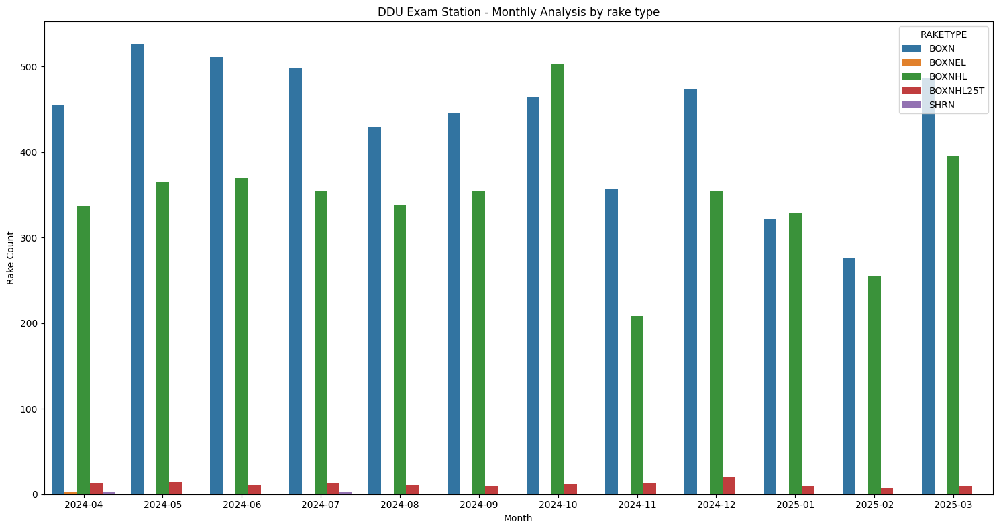

In [537]:
plt.figure(figsize=(15,8))
sns.barplot(monthly_rake_type_count, x='R_MONTH', y='RAKE_COUNT', hue='RAKETYPE')
plt.title('DDU Exam Station - Monthly Analysis by rake type')
plt.xlabel('Month')
plt.ylabel('Rake Count')
plt.tight_layout()
plt.show()

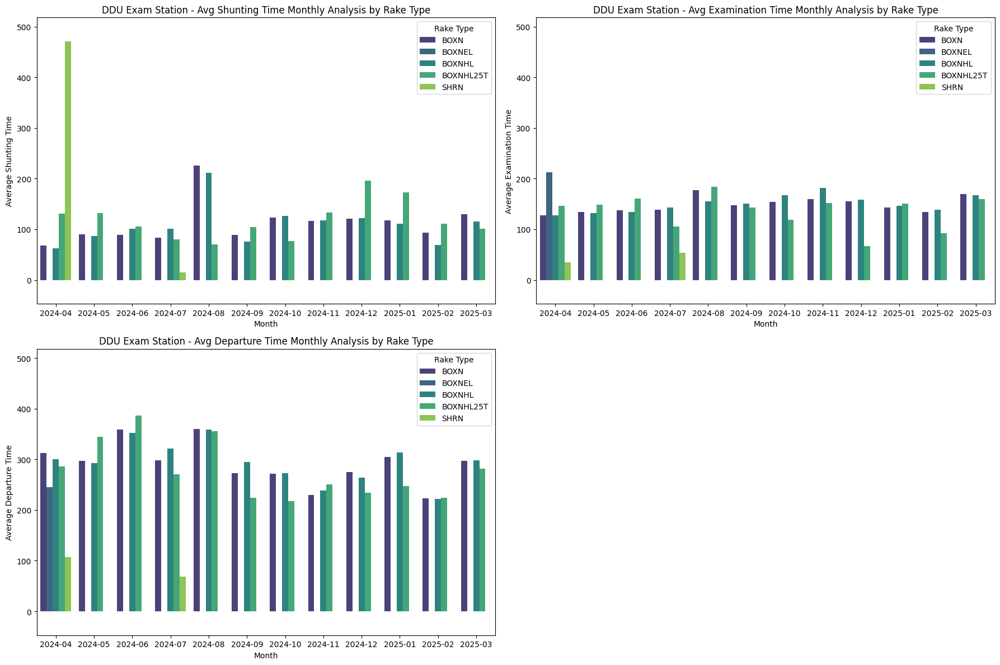

In [538]:
min_y = min(monthly_rake_type_count['AVG_SHUNTING_TIME'].min(),
            monthly_rake_type_count['AVG_EXAMINATION_TIME'].min(),
            monthly_rake_type_count['AVG_DEPARTURE_TIME'].min())

max_y = max(monthly_rake_type_count['AVG_SHUNTING_TIME'].max(),
            monthly_rake_type_count['AVG_EXAMINATION_TIME'].max(),
            monthly_rake_type_count['AVG_DEPARTURE_TIME'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_SHUNTING_TIME', hue='RAKETYPE', palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('DDU Exam Station - Avg Shunting Time Monthly Analysis by Rake Type')
axes[0, 0].set_xlabel('Month')
axes[0, 0].set_ylabel('Average Shunting Time')
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)
axes[0, 0].legend(title='Rake Type', loc='upper right')

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_EXAMINATION_TIME', hue='RAKETYPE', palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('DDU Exam Station - Avg Examination Time Monthly Analysis by Rake Type')
axes[0, 1].set_xlabel('Month')
axes[0, 1].set_ylabel('Average Examination Time')
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)
axes[0, 1].legend(title='Rake Type', loc='upper right')

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_DEPARTURE_TIME', hue='RAKETYPE', palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('DDU Exam Station - Avg Departure Time Monthly Analysis by Rake Type')
axes[1, 0].set_xlabel('Month')
axes[1, 0].set_ylabel('Average Departure Time')
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)
axes[1, 0].legend(title='Rake Type', loc='upper right')

axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

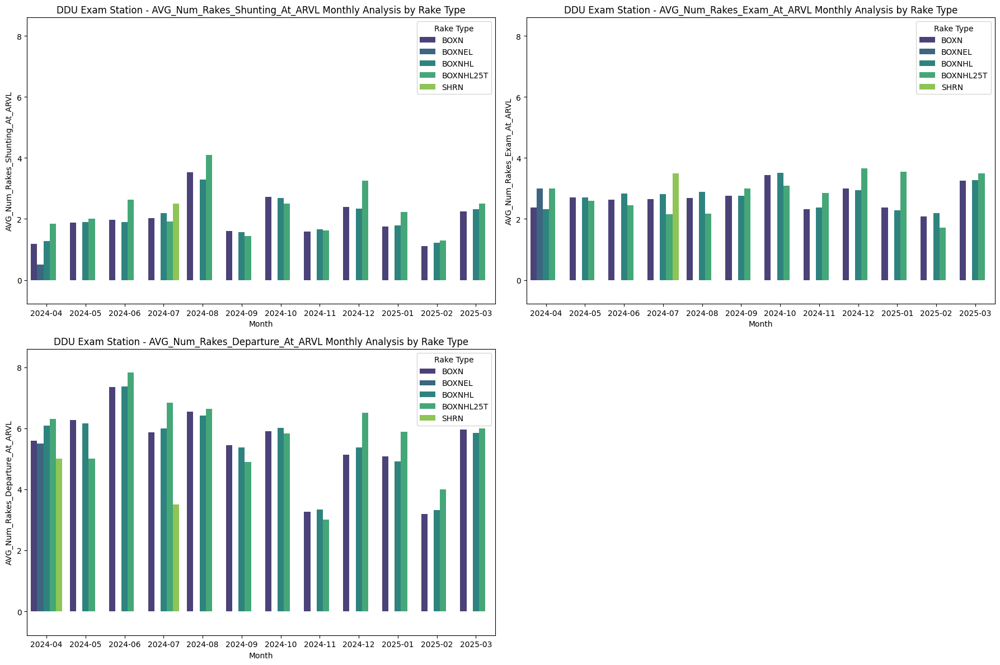

In [539]:
min_y = min(monthly_rake_type_count['AVG_Num_Rakes_Shunting_At_ARVL'].min(),
            monthly_rake_type_count['AVG_Num_Rakes_Exam_At_ARVL'].min(),
            monthly_rake_type_count['AVG_Num_Rakes_Departure_At_ARVL'].min())

max_y = max(monthly_rake_type_count['AVG_Num_Rakes_Shunting_At_ARVL'].max(),
            monthly_rake_type_count['AVG_Num_Rakes_Exam_At_ARVL'].max(),
            monthly_rake_type_count['AVG_Num_Rakes_Departure_At_ARVL'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Num_Rakes_Shunting_At_ARVL', hue='RAKETYPE', palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('DDU Exam Station - AVG_Num_Rakes_Shunting_At_ARVL Monthly Analysis by Rake Type')
axes[0, 0].set_xlabel('Month')
axes[0, 0].set_ylabel('AVG_Num_Rakes_Shunting_At_ARVL')
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)
axes[0, 0].legend(title='Rake Type', loc='upper right')

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Num_Rakes_Exam_At_ARVL', hue='RAKETYPE', palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('DDU Exam Station - AVG_Num_Rakes_Exam_At_ARVL Monthly Analysis by Rake Type')
axes[0, 1].set_xlabel('Month')
axes[0, 1].set_ylabel('AVG_Num_Rakes_Exam_At_ARVL')
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)
axes[0, 1].legend(title='Rake Type', loc='upper right')

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Num_Rakes_Departure_At_ARVL', hue='RAKETYPE', palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('DDU Exam Station - AVG_Num_Rakes_Departure_At_ARVL Monthly Analysis by Rake Type')
axes[1, 0].set_xlabel('Month')
axes[1, 0].set_ylabel('AVG_Num_Rakes_Departure_At_ARVL')
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)
axes[1, 0].legend(title='Rake Type', loc='upper right')

axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

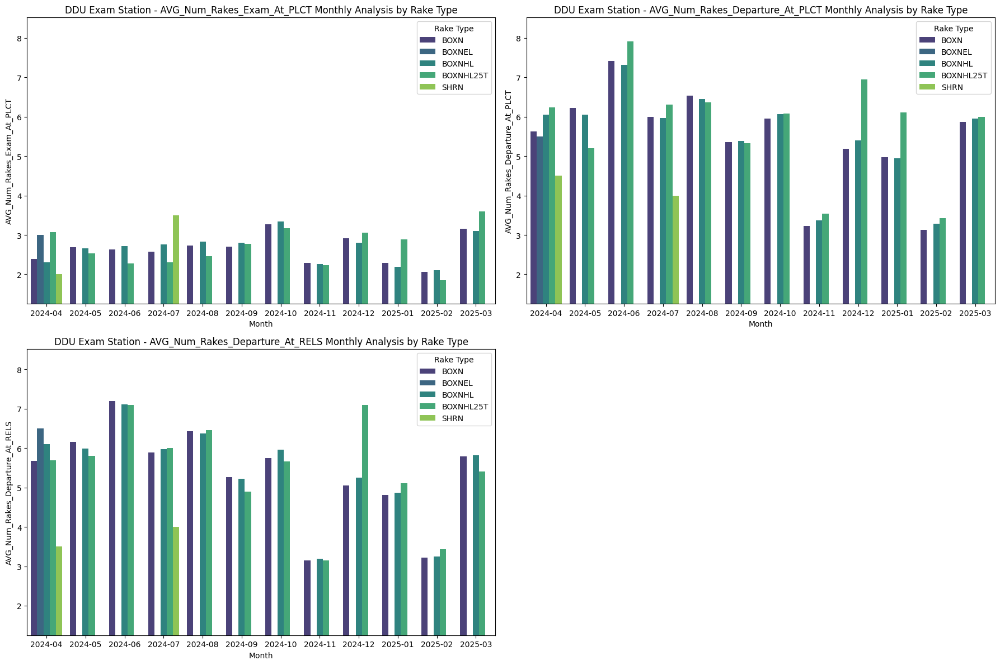

In [540]:
min_y = min(monthly_rake_type_count['AVG_Num_Rakes_Exam_At_PLCT'].min(),
            monthly_rake_type_count['AVG_Num_Rakes_Departure_At_PLCT'].min(),
            monthly_rake_type_count['AVG_Num_Rakes_Departure_At_RELS'].min())

max_y = max(monthly_rake_type_count['AVG_Num_Rakes_Exam_At_PLCT'].max(),
            monthly_rake_type_count['AVG_Num_Rakes_Departure_At_PLCT'].max(),
            monthly_rake_type_count['AVG_Num_Rakes_Departure_At_RELS'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Num_Rakes_Exam_At_PLCT', hue='RAKETYPE', palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('DDU Exam Station - AVG_Num_Rakes_Exam_At_PLCT Monthly Analysis by Rake Type')
axes[0, 0].set_xlabel('Month')
axes[0, 0].set_ylabel('AVG_Num_Rakes_Exam_At_PLCT')
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)
axes[0, 0].legend(title='Rake Type', loc='upper right')

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Num_Rakes_Departure_At_PLCT', hue='RAKETYPE', palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('DDU Exam Station - AVG_Num_Rakes_Departure_At_PLCT Monthly Analysis by Rake Type')
axes[0, 1].set_xlabel('Month')
axes[0, 1].set_ylabel('AVG_Num_Rakes_Departure_At_PLCT')
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)
axes[0, 1].legend(title='Rake Type', loc='upper right')

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Num_Rakes_Departure_At_RELS', hue='RAKETYPE', palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('DDU Exam Station - AVG_Num_Rakes_Departure_At_RELS Monthly Analysis by Rake Type')
axes[1, 0].set_xlabel('Month')
axes[1, 0].set_ylabel('AVG_Num_Rakes_Departure_At_RELS')
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)
axes[1, 0].legend(title='Rake Type', loc='upper right')

axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

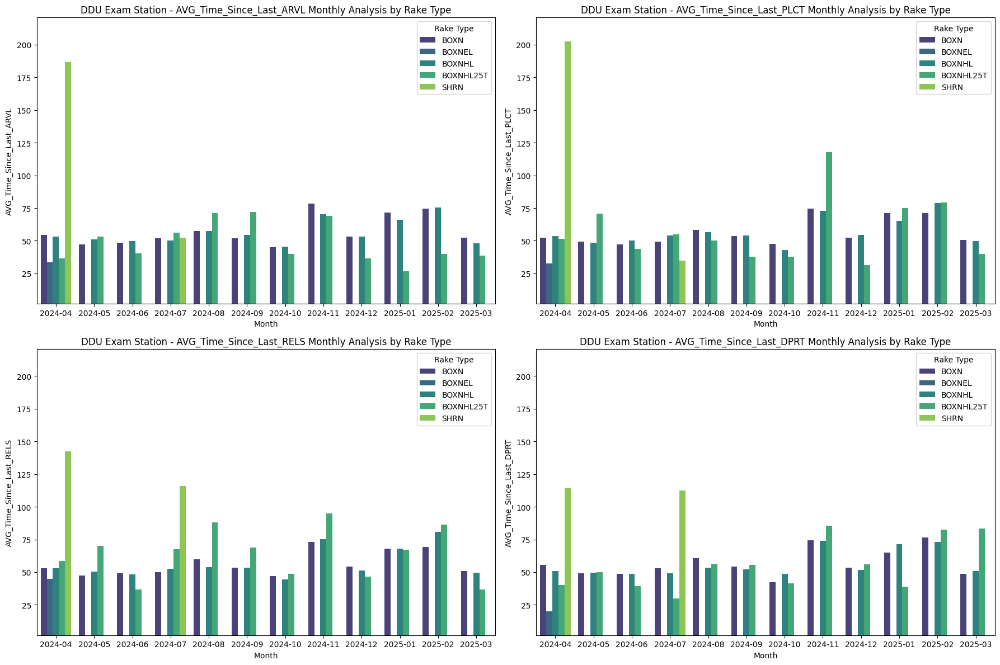

In [541]:
min_y = min(monthly_rake_type_count['AVG_Time_Since_Last_ARVL'].min(),
            monthly_rake_type_count['AVG_Time_Since_Last_PLCT'].min(),
            monthly_rake_type_count['AVG_Time_Since_Last_RELS'].min(),
            monthly_rake_type_count['AVG_Time_Since_Last_DPRT'].min())

max_y = max(monthly_rake_type_count['AVG_Time_Since_Last_ARVL'].max(),
            monthly_rake_type_count['AVG_Time_Since_Last_PLCT'].max(),
            monthly_rake_type_count['AVG_Time_Since_Last_RELS'].max(),
            monthly_rake_type_count['AVG_Time_Since_Last_DPRT'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Time_Since_Last_ARVL', hue='RAKETYPE', palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('DDU Exam Station - AVG_Time_Since_Last_ARVL Monthly Analysis by Rake Type')
axes[0, 0].set_xlabel('Month')
axes[0, 0].set_ylabel('AVG_Time_Since_Last_ARVL')
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)
axes[0, 0].legend(title='Rake Type', loc='upper right')

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Time_Since_Last_PLCT', hue='RAKETYPE', palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('DDU Exam Station - AVG_Time_Since_Last_PLCT Monthly Analysis by Rake Type')
axes[0, 1].set_xlabel('Month')
axes[0, 1].set_ylabel('AVG_Time_Since_Last_PLCT')
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)
axes[0, 1].legend(title='Rake Type', loc='upper right')

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Time_Since_Last_RELS', hue='RAKETYPE', palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('DDU Exam Station - AVG_Time_Since_Last_RELS Monthly Analysis by Rake Type')
axes[1, 0].set_xlabel('Month')
axes[1, 0].set_ylabel('AVG_Time_Since_Last_RELS')
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)
axes[1, 0].legend(title='Rake Type', loc='upper right')

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Time_Since_Last_DPRT', hue='RAKETYPE', palette='viridis', ax=axes[1, 1])
axes[1, 1].set_title('DDU Exam Station - AVG_Time_Since_Last_DPRT Monthly Analysis by Rake Type')
axes[1, 1].set_xlabel('Month')
axes[1, 1].set_ylabel('AVG_Time_Since_Last_DPRT')
axes[1, 1].set_ylim(y_lower_bound, y_upper_bound)
axes[1, 1].legend(title='Rake Type', loc='upper right')

plt.tight_layout()
plt.show()

#### Weekly Analysis

In [542]:
ddu_weekly = df1['R_WEEK'].value_counts(sort=False).reset_index()
ddu_weekly.columns =['R_WEEK','RAKE_COUNT']
ddu_weekly = pd.DataFrame(ddu_weekly)

weekly_shunting_time_sum = df1.groupby('R_WEEK', sort=False)['AR_TO_PL'].sum().reset_index(name='Shunting_Time')
weekly_examination_time_sum = df1.groupby('R_WEEK', sort=False)['PL_TO_RL'].sum().reset_index(name='Examination_Time')
weekly_departure_lag_time_sum = df1.groupby('R_WEEK', sort=False)['RL_TO_DP'].sum().reset_index(name='Departure_Lag')
weekly_numrakes1 = df1.groupby('R_WEEK', sort=False)['Num_Rakes_Shunting_At_ARVL'].sum().reset_index(name='numrakes1')
weekly_numrakes2 = df1.groupby('R_WEEK', sort=False)['Num_Rakes_Exam_At_ARVL'].sum().reset_index(name='numrakes2')
weekly_numrakes3 = df1.groupby('R_WEEK', sort=False)['Num_Rakes_Departure_At_ARVL'].sum().reset_index(name='numrakes3')
weekly_numrakes4 = df1.groupby('R_WEEK', sort=False)['Num_Rakes_Exam_At_PLCT'].sum().reset_index(name='numrakes4')
weekly_numrakes5 = df1.groupby('R_WEEK', sort=False)['Num_Rakes_Departure_At_PLCT'].sum().reset_index(name='numrakes5')
weekly_numrakes6 = df1.groupby('R_WEEK', sort=False)['Num_Rakes_Departure_At_RELS'].sum().reset_index(name='numrakes6')
weekly_timesince1 = df1.groupby('R_WEEK', sort=False)['Time_Since_Last_ARVL'].sum().reset_index(name='timesince1')
weekly_timesince2 = df1.groupby('R_WEEK', sort=False)['Time_Since_Last_PLCT'].sum().reset_index(name='timesince2')
weekly_timesince3 = df1.groupby('R_WEEK', sort=False)['Time_Since_Last_RELS'].sum().reset_index(name='timesince3')
weekly_timesince4 = df1.groupby('R_WEEK', sort=False)['Time_Since_Last_DPRT'].sum().reset_index(name='timesince4')

ddu_weekly['AVG_SHUNTING_TIME'] = weekly_shunting_time_sum['Shunting_Time'] / ddu_weekly['RAKE_COUNT']
ddu_weekly['AVG_EXAMINATION_TIME'] = weekly_examination_time_sum['Examination_Time'] / ddu_weekly['RAKE_COUNT']
ddu_weekly['AVG_DEPARTURE_TIME'] = weekly_departure_lag_time_sum['Departure_Lag'] / ddu_weekly['RAKE_COUNT']
ddu_weekly['AVG_Num_Rakes_Shunting_At_ARVL'] = weekly_numrakes1['numrakes1'] / ddu_weekly['RAKE_COUNT']
ddu_weekly['AVG_Num_Rakes_Exam_At_ARVL'] = weekly_numrakes2['numrakes2'] / ddu_weekly['RAKE_COUNT']
ddu_weekly['AVG_Num_Rakes_Departure_At_ARVL'] = weekly_numrakes3['numrakes3'] / ddu_weekly['RAKE_COUNT']
ddu_weekly['AVG_Num_Rakes_Exam_At_PLCT'] = weekly_numrakes4['numrakes4'] / ddu_weekly['RAKE_COUNT']
ddu_weekly['AVG_Num_Rakes_Departure_At_PLCT'] = weekly_numrakes5['numrakes5'] / ddu_weekly['RAKE_COUNT']
ddu_weekly['AVG_Num_Rakes_Departure_At_RELS'] = weekly_numrakes6['numrakes6'] / ddu_weekly['RAKE_COUNT']
ddu_weekly['AVG_Time_Since_Last_ARVL'] = weekly_timesince1['timesince1'] / ddu_weekly['RAKE_COUNT']
ddu_weekly['AVG_Time_Since_Last_PLCT'] = weekly_timesince2['timesince2'] / ddu_weekly['RAKE_COUNT']
ddu_weekly['AVG_Time_Since_Last_RELS'] = weekly_timesince3['timesince3'] / ddu_weekly['RAKE_COUNT']
ddu_weekly['AVG_Time_Since_Last_DPRT'] = weekly_timesince4['timesince4'] / ddu_weekly['RAKE_COUNT']

ddu_weekly.head()

,R_WEEK,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME,AVG_Num_Rakes_Shunting_At_ARVL,AVG_Num_Rakes_Exam_At_ARVL,AVG_Num_Rakes_Departure_At_ARVL,AVG_Num_Rakes_Exam_At_PLCT,AVG_Num_Rakes_Departure_At_PLCT,AVG_Num_Rakes_Departure_At_RELS,AVG_Time_Since_Last_ARVL,AVG_Time_Since_Last_PLCT,AVG_Time_Since_Last_RELS,AVG_Time_Since_Last_DPRT
0,W-14-2024,213,90.239437,130.816901,248.995305,1.840376,2.676056,4.760563,2.774648,4.882629,5.136150,49.403756,46.967136,46.877934,47.136150
1,W-15-2024,192,69.296875,130.614583,233.114583,1.213542,2.421875,4.442708,2.364583,4.536458,4.364583,52.375000,52.802083,51.927083,52.385417
2,W-16-2024,205,54.658537,124.419512,501.639024,1.034146,2.351220,10.321951,2.390244,10.136585,10.185366,49.370732,48.795122,49.219512,48.414634
3,W-17-2024,151,56.854305,134.072848,258.039735,0.781457,1.887417,3.774834,1.821192,3.741722,3.728477,68.337748,68.807947,68.443709,67.615894
4,W-18-2024,180,64.983333,119.811111,238.816667,1.261111,2.233333,4.444444,2.233333,4.305556,4.305556,52.188889,53.916667,53.638889,56.294444


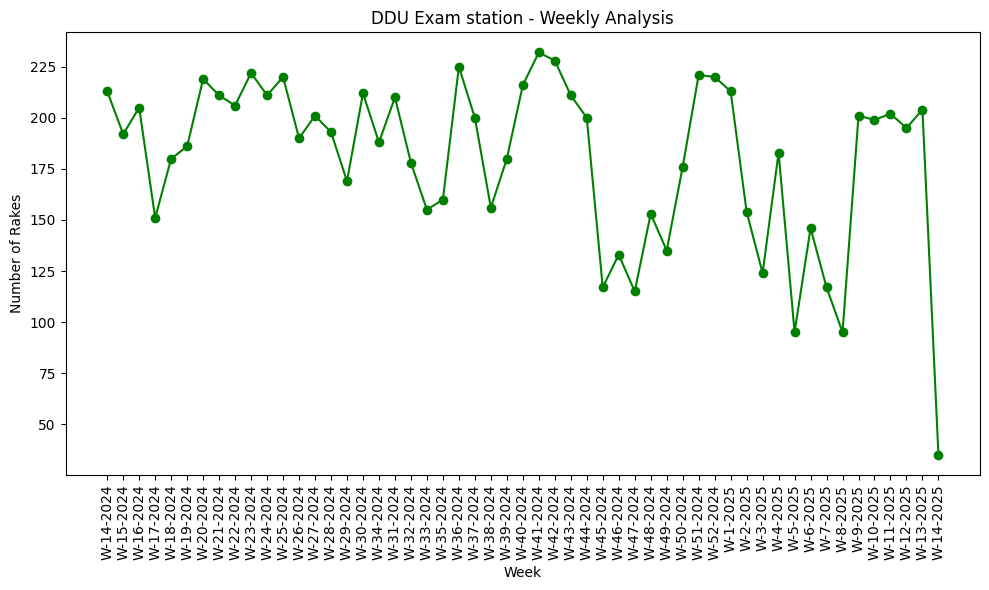

In [543]:
plt.figure(figsize=(10,6))
plt.plot(ddu_weekly['R_WEEK'], ddu_weekly['RAKE_COUNT'], marker='o', linestyle='-', color='green')
plt.title('DDU Exam station - Weekly Analysis')
plt.xlabel('Week')
plt.ylabel('Number of Rakes')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

C:\Users\anant\AppData\Local\Temp\ipykernel_12904\3640530299.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=ddu_weekly['R_WEEK'], y=ddu_weekly['AVG_SHUNTING_TIME'], palette='viridis', ax=axes[0, 1])
C:\Users\anant\AppData\Local\Temp\ipykernel_12904\3640530299.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0, 1].set_xticklabels(axes[0, 1].get_xticklabels(), rotation=90)
C:\Users\anant\AppData\Local\Temp\ipykernel_12904\3640530299.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=ddu_weekly['R_WEEK'], y=ddu_weekly['AVG_EXAMINATION_TIME'], palette='viridis', ax=axes[1, 0])
C:\Users\anan

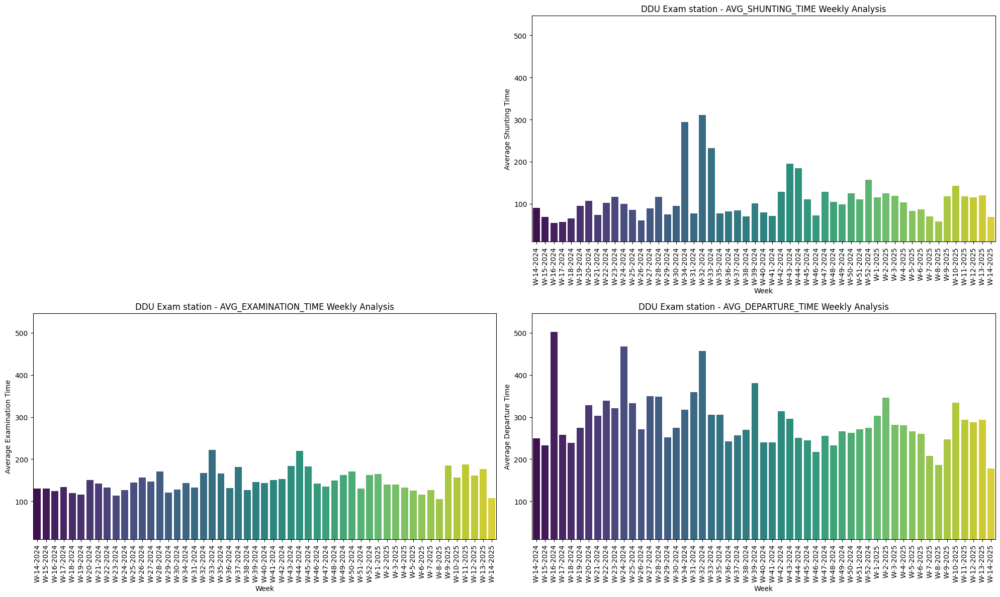

In [544]:
min_y = min(ddu_weekly['AVG_SHUNTING_TIME'].min(),
            ddu_weekly['AVG_EXAMINATION_TIME'].min(),
            ddu_weekly['AVG_DEPARTURE_TIME'].min())

max_y = max(ddu_weekly['AVG_SHUNTING_TIME'].max(),
            ddu_weekly['AVG_EXAMINATION_TIME'].max(),
            ddu_weekly['AVG_DEPARTURE_TIME'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(20, 12))

axes[0, 0].axis('off')

sns.barplot(x=ddu_weekly['R_WEEK'], y=ddu_weekly['AVG_SHUNTING_TIME'], palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('DDU Exam station - AVG_SHUNTING_TIME Weekly Analysis')
axes[0, 1].set_xlabel('Week')
axes[0, 1].set_ylabel('Average Shunting Time')
axes[0, 1].set_xticklabels(axes[0, 1].get_xticklabels(), rotation=90)
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=ddu_weekly['R_WEEK'], y=ddu_weekly['AVG_EXAMINATION_TIME'], palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('DDU Exam station - AVG_EXAMINATION_TIME Weekly Analysis')
axes[1, 0].set_xlabel('Week')
axes[1, 0].set_ylabel('Average Examination Time')
axes[1, 0].set_xticklabels(axes[1, 0].get_xticklabels(), rotation=90)
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=ddu_weekly['R_WEEK'], y=ddu_weekly['AVG_DEPARTURE_TIME'], palette='viridis', ax=axes[1, 1])
axes[1, 1].set_title('DDU Exam station - AVG_DEPARTURE_TIME Weekly Analysis')
axes[1, 1].set_xlabel('Week')
axes[1, 1].set_ylabel('Average Departure Time')
axes[1, 1].set_xticklabels(axes[1, 1].get_xticklabels(), rotation=90)
axes[1, 1].set_ylim(y_lower_bound, y_upper_bound)

plt.tight_layout()
plt.show()

C:\Users\anant\AppData\Local\Temp\ipykernel_12904\1593481291.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=ddu_weekly['R_WEEK'], y=ddu_weekly['AVG_Num_Rakes_Shunting_At_ARVL'], palette='viridis', ax=axes[0, 0])
C:\Users\anant\AppData\Local\Temp\ipykernel_12904\1593481291.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=ddu_weekly['R_WEEK'], y=ddu_weekly['AVG_Num_Rakes_Exam_At_ARVL'], palette='viridis', ax=axes[0, 1])
C:\Users\anant\AppData\Local\Temp\ipykernel_12904\1593481291.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barpl

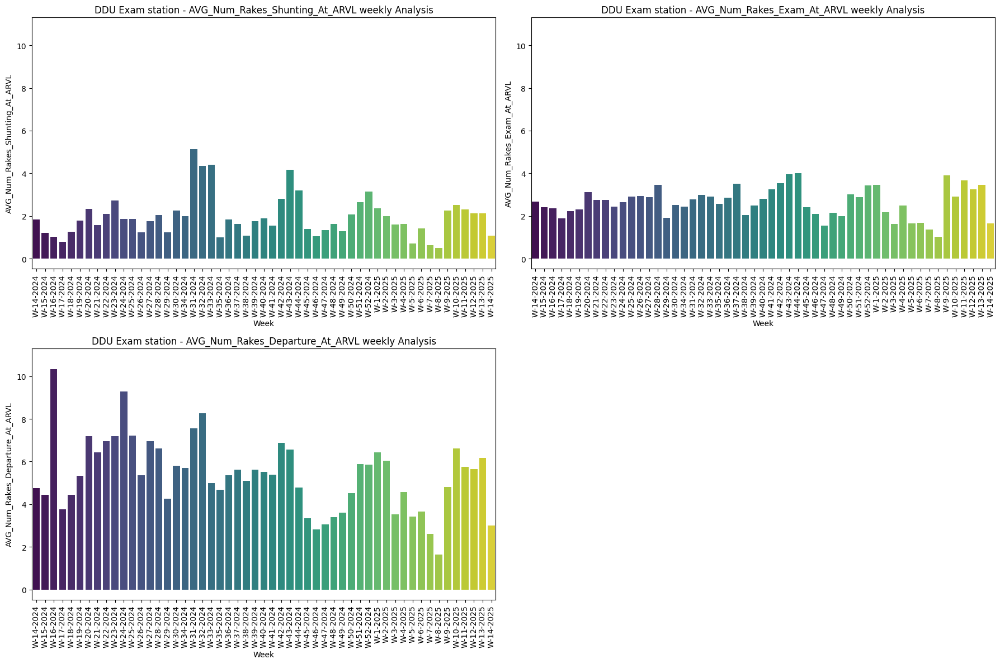

In [545]:
min_y = min(ddu_weekly['AVG_Num_Rakes_Shunting_At_ARVL'].min(),
            ddu_weekly['AVG_Num_Rakes_Exam_At_ARVL'].min(),
            ddu_weekly['AVG_Num_Rakes_Departure_At_ARVL'].min())

max_y = max(ddu_weekly['AVG_Num_Rakes_Shunting_At_ARVL'].max(),
            ddu_weekly['AVG_Num_Rakes_Exam_At_ARVL'].max(),
            ddu_weekly['AVG_Num_Rakes_Departure_At_ARVL'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(x=ddu_weekly['R_WEEK'], y=ddu_weekly['AVG_Num_Rakes_Shunting_At_ARVL'], palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('DDU Exam station - AVG_Num_Rakes_Shunting_At_ARVL weekly Analysis')
axes[0, 0].set_xlabel('Week')
axes[0, 0].set_ylabel('AVG_Num_Rakes_Shunting_At_ARVL')
axes[0, 0].tick_params(axis='x', labelrotation=90)
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=ddu_weekly['R_WEEK'], y=ddu_weekly['AVG_Num_Rakes_Exam_At_ARVL'], palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('DDU Exam station - AVG_Num_Rakes_Exam_At_ARVL weekly Analysis')
axes[0, 1].set_xlabel('Week')
axes[0, 1].set_ylabel('AVG_Num_Rakes_Exam_At_ARVL')
axes[0, 1].tick_params(axis='x', labelrotation=90)
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=ddu_weekly['R_WEEK'], y=ddu_weekly['AVG_Num_Rakes_Departure_At_ARVL'], palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('DDU Exam station - AVG_Num_Rakes_Departure_At_ARVL weekly Analysis')
axes[1, 0].set_xlabel('Week')
axes[1, 0].set_ylabel('AVG_Num_Rakes_Departure_At_ARVL')
axes[1, 0].tick_params(axis='x', labelrotation=90)
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)

axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

C:\Users\anant\AppData\Local\Temp\ipykernel_12904\3519063938.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=ddu_weekly['R_WEEK'], y=ddu_weekly['AVG_Num_Rakes_Exam_At_PLCT'], palette='viridis', ax=axes[0, 0])
C:\Users\anant\AppData\Local\Temp\ipykernel_12904\3519063938.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=ddu_weekly['R_WEEK'], y=ddu_weekly['AVG_Num_Rakes_Departure_At_PLCT'], palette='viridis', ax=axes[0, 1])
C:\Users\anant\AppData\Local\Temp\ipykernel_12904\3519063938.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barp

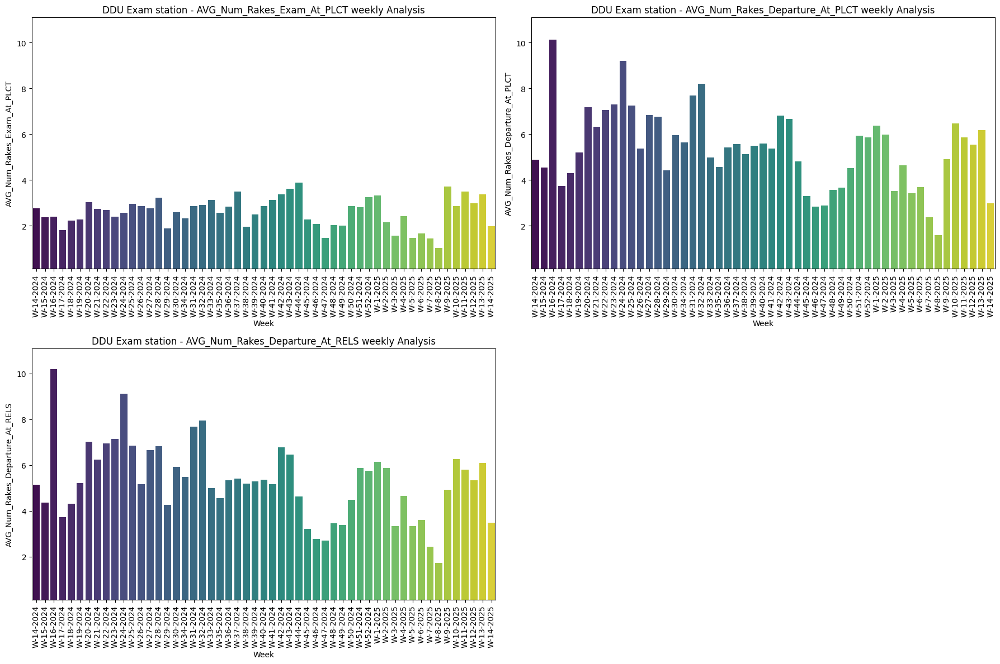

In [546]:
min_y = min(ddu_weekly['AVG_Num_Rakes_Exam_At_PLCT'].min(),
            ddu_weekly['AVG_Num_Rakes_Departure_At_PLCT'].min(),
            ddu_weekly['AVG_Num_Rakes_Departure_At_RELS'].min())

max_y = max(ddu_weekly['AVG_Num_Rakes_Exam_At_PLCT'].max(),
            ddu_weekly['AVG_Num_Rakes_Departure_At_PLCT'].max(),
            ddu_weekly['AVG_Num_Rakes_Departure_At_RELS'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(x=ddu_weekly['R_WEEK'], y=ddu_weekly['AVG_Num_Rakes_Exam_At_PLCT'], palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('DDU Exam station - AVG_Num_Rakes_Exam_At_PLCT weekly Analysis')
axes[0, 0].set_xlabel('Week')
axes[0, 0].set_ylabel('AVG_Num_Rakes_Exam_At_PLCT')
axes[0, 0].tick_params(axis='x', labelrotation=90)
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=ddu_weekly['R_WEEK'], y=ddu_weekly['AVG_Num_Rakes_Departure_At_PLCT'], palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('DDU Exam station - AVG_Num_Rakes_Departure_At_PLCT weekly Analysis')
axes[0, 1].set_xlabel('Week')
axes[0, 1].set_ylabel('AVG_Num_Rakes_Departure_At_PLCT')
axes[0, 1].tick_params(axis='x', labelrotation=90)
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=ddu_weekly['R_WEEK'], y=ddu_weekly['AVG_Num_Rakes_Departure_At_RELS'], palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('DDU Exam station - AVG_Num_Rakes_Departure_At_RELS weekly Analysis')
axes[1, 0].set_xlabel('Week')
axes[1, 0].set_ylabel('AVG_Num_Rakes_Departure_At_RELS')
axes[1, 0].tick_params(axis='x', labelrotation=90)
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)

axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

C:\Users\anant\AppData\Local\Temp\ipykernel_12904\1067663193.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=ddu_weekly['R_WEEK'], y=ddu_weekly['AVG_Time_Since_Last_ARVL'], palette='viridis', ax=axes[0, 0])
C:\Users\anant\AppData\Local\Temp\ipykernel_12904\1067663193.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=ddu_weekly['R_WEEK'], y=ddu_weekly['AVG_Time_Since_Last_PLCT'], palette='viridis', ax=axes[0, 1])
C:\Users\anant\AppData\Local\Temp\ipykernel_12904\1067663193.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=ddu

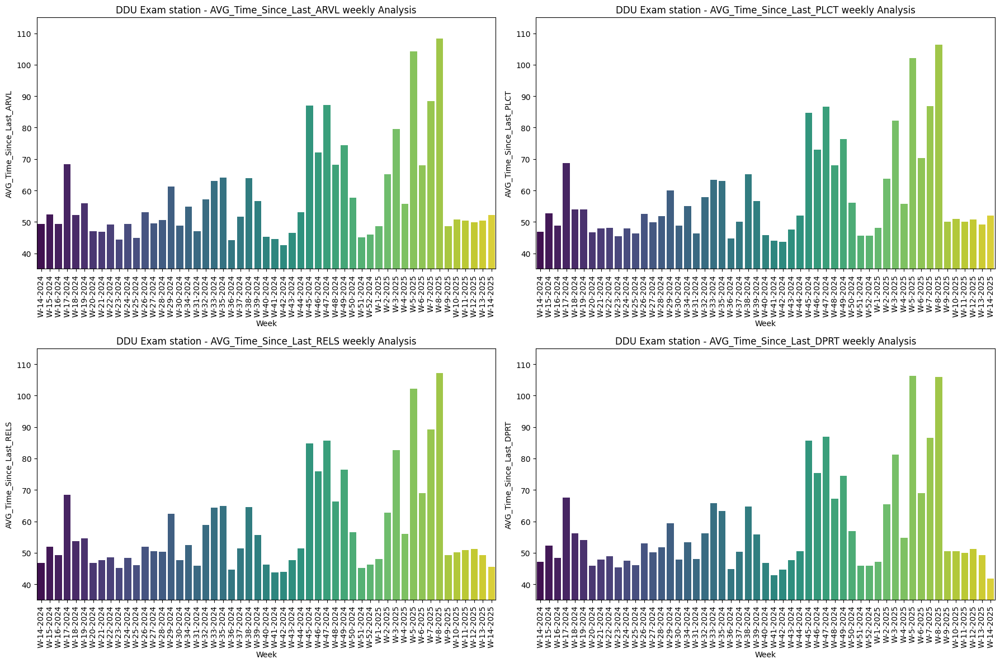

In [547]:
min_y = min(ddu_weekly['AVG_Time_Since_Last_ARVL'].min(),
            ddu_weekly['AVG_Time_Since_Last_PLCT'].min(),
            ddu_weekly['AVG_Time_Since_Last_RELS'].min(),
            ddu_weekly['AVG_Time_Since_Last_DPRT'].min())

max_y = max(ddu_weekly['AVG_Time_Since_Last_ARVL'].max(),
            ddu_weekly['AVG_Time_Since_Last_PLCT'].max(),
            ddu_weekly['AVG_Time_Since_Last_RELS'].max(),
            ddu_weekly['AVG_Time_Since_Last_DPRT'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(x=ddu_weekly['R_WEEK'], y=ddu_weekly['AVG_Time_Since_Last_ARVL'], palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('DDU Exam station - AVG_Time_Since_Last_ARVL weekly Analysis')
axes[0, 0].set_xlabel('Week')
axes[0, 0].set_ylabel('AVG_Time_Since_Last_ARVL')
axes[0, 0].tick_params(axis='x', labelrotation=90)
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=ddu_weekly['R_WEEK'], y=ddu_weekly['AVG_Time_Since_Last_PLCT'], palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('DDU Exam station - AVG_Time_Since_Last_PLCT weekly Analysis')
axes[0, 1].set_xlabel('Week')
axes[0, 1].set_ylabel('AVG_Time_Since_Last_PLCT')
axes[0, 1].tick_params(axis='x', labelrotation=90)
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=ddu_weekly['R_WEEK'], y=ddu_weekly['AVG_Time_Since_Last_RELS'], palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('DDU Exam station - AVG_Time_Since_Last_RELS weekly Analysis')
axes[1, 0].set_xlabel('Week')
axes[1, 0].set_ylabel('AVG_Time_Since_Last_RELS')
axes[1, 0].tick_params(axis='x', labelrotation=90)
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=ddu_weekly['R_WEEK'], y=ddu_weekly['AVG_Time_Since_Last_DPRT'], palette='viridis', ax=axes[1, 1])
axes[1, 1].set_title('DDU Exam station - AVG_Time_Since_Last_DPRT weekly Analysis')
axes[1, 1].set_xlabel('Week')
axes[1, 1].set_ylabel('AVG_Time_Since_Last_DPRT')
axes[1, 1].tick_params(axis='x', labelrotation=90)
axes[1, 1].set_ylim(y_lower_bound, y_upper_bound)

plt.tight_layout()
plt.show()

In [548]:
weekly_rake_type_count = ddu.groupby(['R_WEEK', 'RAKETYPE'], sort=False)['RDATE'].count().reset_index(name='RAKE_COUNT')
weekly_rake_type_count = pd.DataFrame(weekly_rake_type_count)

weekly_shunting_time_sum = ddu.groupby(['R_WEEK', 'RAKETYPE'], sort=False)['AR_TO_PL'].sum().reset_index(name='Shunting_Time')
weekly_examination_time_sum = ddu.groupby(['R_WEEK', 'RAKETYPE'], sort=False)['PL_TO_RL'].sum().reset_index(name='Examination_Time')
weekly_departure_lag_time_sum = ddu.groupby(['R_WEEK', 'RAKETYPE'], sort=False)['RL_TO_DP'].sum().reset_index(name='Departure_Lag')

weekly_rake_type_count = pd.merge(weekly_rake_type_count, weekly_shunting_time_sum, on=['R_WEEK', 'RAKETYPE'], how='left')
weekly_rake_type_count['AVG_SHUNTING_TIME'] = weekly_rake_type_count['Shunting_Time'] / weekly_rake_type_count['RAKE_COUNT']
weekly_rake_type_count = pd.merge(weekly_rake_type_count, weekly_examination_time_sum, on=['R_WEEK', 'RAKETYPE'], how='left')
weekly_rake_type_count['AVG_EXAMINATION_TIME'] = weekly_rake_type_count['Examination_Time'] / weekly_rake_type_count['RAKE_COUNT']
weekly_rake_type_count = pd.merge(weekly_rake_type_count, weekly_departure_lag_time_sum, on=['R_WEEK', 'RAKETYPE'], how='left')
weekly_rake_type_count['AVG_DEPARTURE_TIME'] = weekly_rake_type_count['Departure_Lag'] / weekly_rake_type_count['RAKE_COUNT']

weekly_rake_type_count.drop(columns=['Shunting_Time','Examination_Time','Departure_Lag'], axis=1, inplace=True)

weekly_rake_type_count

,R_WEEK,RAKETYPE,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME
0,W-14-2024,BOXN,124,95.677419,122.032258,233.419355
1,W-14-2024,BOXNHL,87,84.563218,146.344828,276.321839
2,W-14-2024,BOXNHL25T,2,0.000000,0.000000,26.000000
3,W-15-2024,BOXN,120,62.191667,130.200000,237.108333
4,W-15-2024,BOXNHL25T,7,190.142857,205.714286,363.000000
...,...,...,...,...,...,...
153,W-12-2025,BOXNHL25T,4,62.500000,157.500000,330.250000
154,W-13-2025,BOXN,106,122.009434,178.915094,307.018868
155,W-13-2025,BOXNHL,98,118.102041,175.193878,279.979592
156,W-14-2025,BOXN,21,62.047619,133.571429,194.285714


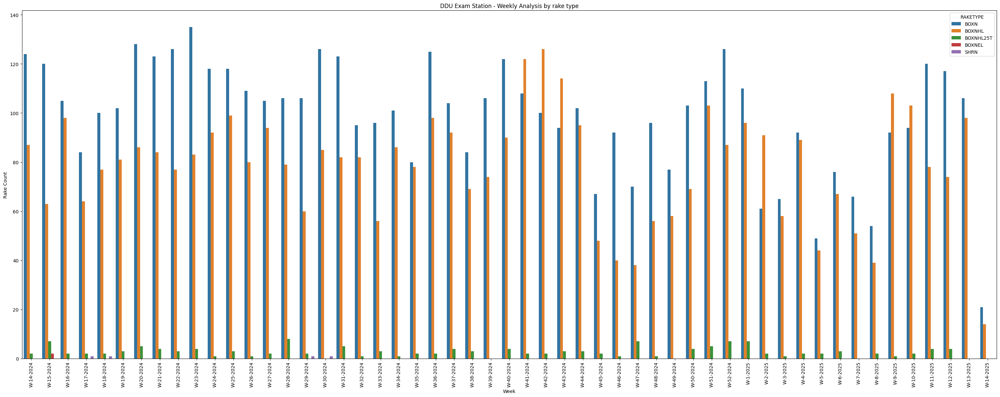

In [549]:
plt.figure(figsize=(30,12))
sns.barplot(weekly_rake_type_count, x='R_WEEK', y='RAKE_COUNT', hue='RAKETYPE')
plt.title('DDU Exam Station - Weekly Analysis by rake type')
plt.xlabel('Week')
plt.ylabel('Rake Count')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

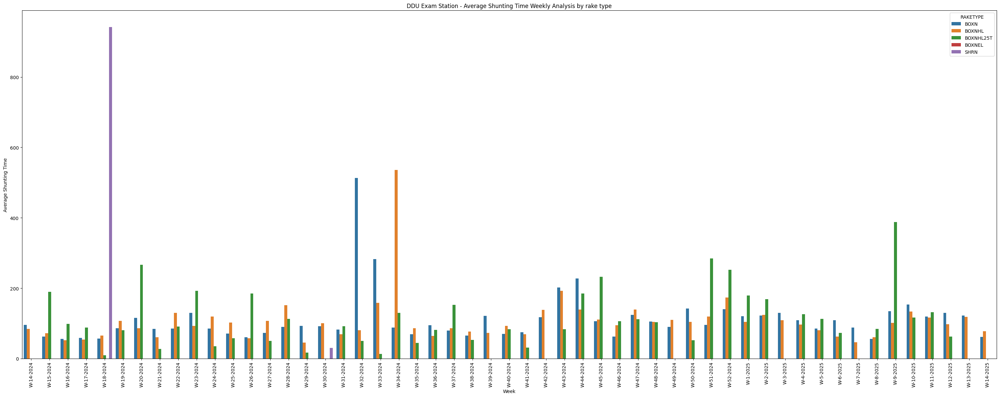

In [550]:
plt.figure(figsize=(30,12))
sns.barplot(weekly_rake_type_count, x='R_WEEK', y='AVG_SHUNTING_TIME', hue='RAKETYPE')
plt.title('DDU Exam Station - Average Shunting Time Weekly Analysis by rake type')
plt.xlabel('Week')
plt.ylabel('Average Shunting Time')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

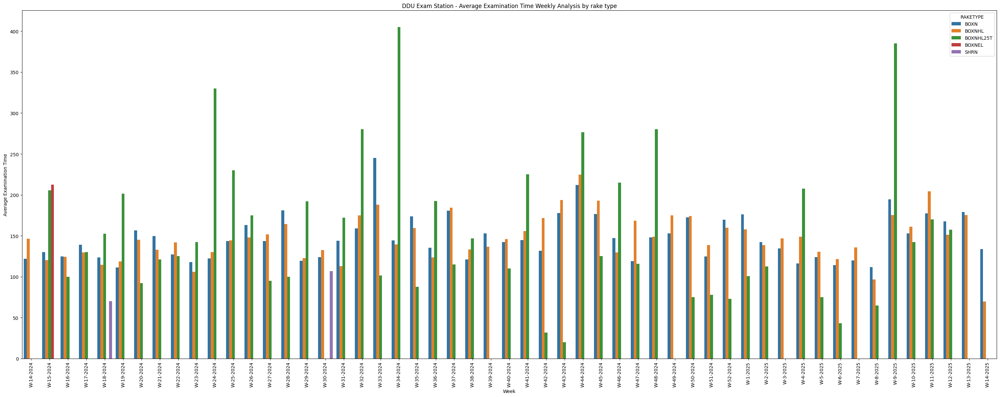

In [551]:
plt.figure(figsize=(30,12))
sns.barplot(weekly_rake_type_count, x='R_WEEK', y='AVG_EXAMINATION_TIME', hue='RAKETYPE')
plt.title('DDU Exam Station - Average Examination Time Weekly Analysis by rake type')
plt.xlabel('Week')
plt.ylabel('Average Examination Time')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

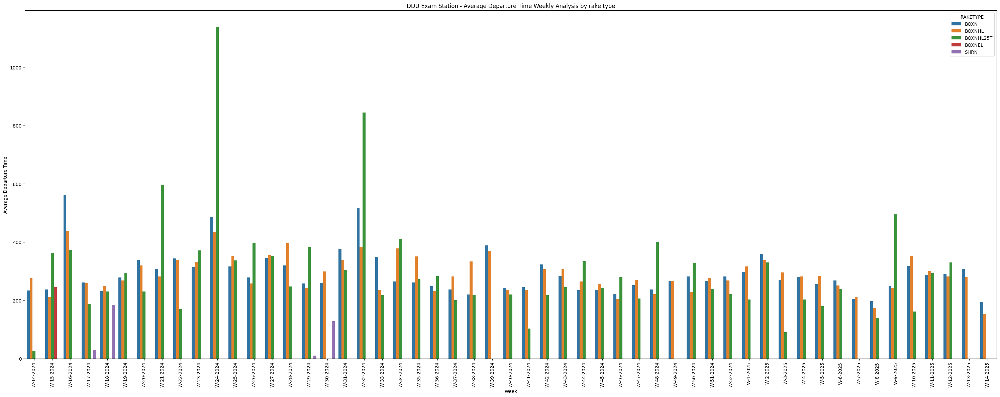

In [552]:
plt.figure(figsize=(30,12))
sns.barplot(weekly_rake_type_count, x='R_WEEK', y='AVG_DEPARTURE_TIME', hue='RAKETYPE')
plt.title('DDU Exam Station - Average Departure Time Weekly Analysis by rake type')
plt.xlabel('Week')
plt.ylabel('Average Departure Time')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

#### Daily Analysis

In [553]:
ddu_daily = df1.groupby('R_DATEOFMONTH', sort=False)['RDATE'].count().reset_index(name='RAKE_COUNT')
ddu_daily = pd.DataFrame(ddu_daily)

daily_shunting_time_sum = df1.groupby('R_DATEOFMONTH', sort=False)['AR_TO_PL'].sum().reset_index(name='Shunting_Time')
daily_examination_time_sum = df1.groupby('R_DATEOFMONTH', sort=False)['PL_TO_RL'].sum().reset_index(name='Examination_Time')
daily_departure_lag_time_sum = df1.groupby('R_DATEOFMONTH', sort=False)['RL_TO_DP'].sum().reset_index(name='Departure_Lag')
daily_numrakes1 = df1.groupby('R_DATEOFMONTH', sort=False)['Num_Rakes_Shunting_At_ARVL'].sum().reset_index(name='numrakes1')
daily_numrakes2 = df1.groupby('R_DATEOFMONTH', sort=False)['Num_Rakes_Exam_At_ARVL'].sum().reset_index(name='numrakes2')
daily_numrakes3 = df1.groupby('R_DATEOFMONTH', sort=False)['Num_Rakes_Departure_At_ARVL'].sum().reset_index(name='numrakes3')
daily_numrakes4 = df1.groupby('R_DATEOFMONTH', sort=False)['Num_Rakes_Exam_At_PLCT'].sum().reset_index(name='numrakes4')
daily_numrakes5 = df1.groupby('R_DATEOFMONTH', sort=False)['Num_Rakes_Departure_At_PLCT'].sum().reset_index(name='numrakes5')
daily_numrakes6 = df1.groupby('R_DATEOFMONTH', sort=False)['Num_Rakes_Departure_At_RELS'].sum().reset_index(name='numrakes6')
daily_timesince1 = df1.groupby('R_DATEOFMONTH', sort=False)['Time_Since_Last_ARVL'].sum().reset_index(name='timesince1')
daily_timesince2 = df1.groupby('R_DATEOFMONTH', sort=False)['Time_Since_Last_PLCT'].sum().reset_index(name='timesince2')
daily_timesince3 = df1.groupby('R_DATEOFMONTH', sort=False)['Time_Since_Last_RELS'].sum().reset_index(name='timesince3')
daily_timesince4 = df1.groupby('R_DATEOFMONTH', sort=False)['Time_Since_Last_DPRT'].sum().reset_index(name='timesince4')

ddu_daily['AVG_SHUNTING_TIME'] = daily_shunting_time_sum['Shunting_Time'] / ddu_daily['RAKE_COUNT']
ddu_daily['AVG_EXAMINATION_TIME'] = daily_examination_time_sum['Examination_Time'] / ddu_daily['RAKE_COUNT']
ddu_daily['AVG_DEPARTURE_TIME'] = daily_departure_lag_time_sum['Departure_Lag'] / ddu_daily['RAKE_COUNT']
ddu_daily['AVG_Num_Rakes_Shunting_At_ARVL'] = daily_numrakes1['numrakes1'] / ddu_daily['RAKE_COUNT']
ddu_daily['AVG_Num_Rakes_Exam_At_ARVL'] = daily_numrakes2['numrakes2'] / ddu_daily['RAKE_COUNT']
ddu_daily['AVG_Num_Rakes_Departure_At_ARVL'] = daily_numrakes3['numrakes3'] / ddu_daily['RAKE_COUNT']
ddu_daily['AVG_Num_Rakes_Exam_At_PLCT'] = daily_numrakes4['numrakes4'] / ddu_daily['RAKE_COUNT']
ddu_daily['AVG_Num_Rakes_Departure_At_PLCT'] = daily_numrakes5['numrakes5'] / ddu_daily['RAKE_COUNT']
ddu_daily['AVG_Num_Rakes_Departure_At_RELS'] = daily_numrakes6['numrakes6'] / ddu_daily['RAKE_COUNT']
ddu_daily['AVG_Time_Since_Last_ARVL'] = daily_timesince1['timesince1'] / ddu_daily['RAKE_COUNT']
ddu_daily['AVG_Time_Since_Last_PLCT'] = daily_timesince2['timesince2'] / ddu_daily['RAKE_COUNT']
ddu_daily['AVG_Time_Since_Last_RELS'] = daily_timesince3['timesince3'] / ddu_daily['RAKE_COUNT']
ddu_daily['AVG_Time_Since_Last_DPRT'] = daily_timesince4['timesince4'] / ddu_daily['RAKE_COUNT']

ddu_daily

,R_DATEOFMONTH,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME,AVG_Num_Rakes_Shunting_At_ARVL,AVG_Num_Rakes_Exam_At_ARVL,AVG_Num_Rakes_Departure_At_ARVL,AVG_Num_Rakes_Exam_At_PLCT,AVG_Num_Rakes_Departure_At_PLCT,AVG_Num_Rakes_Departure_At_RELS,AVG_Time_Since_Last_ARVL,AVG_Time_Since_Last_PLCT,AVG_Time_Since_Last_RELS,AVG_Time_Since_Last_DPRT
0,2024-04-01,33,196.909091,181.909091,228.454545,5.484848,3.909091,3.121212,4.272727,4.121212,4.878788,49.848485,45.272727,42.272727,42.666667
1,2024-04-02,32,131.843750,111.250000,264.000000,0.937500,1.906250,5.062500,2.093750,5.343750,5.437500,58.250000,53.062500,45.312500,45.156250
2,2024-04-03,31,33.548387,106.483871,219.451613,0.870968,2.838710,4.838710,2.838710,4.741935,5.000000,39.129032,31.838710,43.064516,46.129032
3,2024-04-04,24,43.333333,157.166667,338.208333,1.208333,2.500000,5.208333,2.291667,5.166667,4.958333,65.750000,64.541667,61.041667,58.833333
4,2024-04-05,22,73.681818,103.181818,252.636364,1.545455,2.636364,3.727273,2.500000,3.681818,3.636364,51.136364,60.272727,67.272727,64.454545
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
360,2025-03-27,36,156.805556,181.111111,254.305556,2.666667,3.027778,6.166667,3.055556,5.527778,5.555556,47.361111,51.805556,46.250000,44.027778
361,2025-03-28,28,48.642857,163.035714,211.000000,2.142857,4.107143,4.142857,4.035714,4.392857,4.678571,50.107143,44.607143,48.750000,49.821429
362,2025-03-29,28,189.321429,258.892857,339.107143,2.821429,4.535714,6.285714,4.357143,6.607143,6.607143,47.964286,44.857143,45.000000,52.678571
363,2025-03-30,21,134.809524,172.619048,308.523810,1.666667,3.238095,5.952381,2.714286,6.380952,5.619048,72.142857,68.809524,70.000000,63.571429


In [554]:
import matplotlib.dates as mdates

In [555]:
ddu_daily['R_DATEOFMONTH'] = pd.to_datetime(ddu_daily['R_DATEOFMONTH'], format='%Y-%m-%d')

ddu_daily = ddu_daily.sort_values(by='R_DATEOFMONTH')

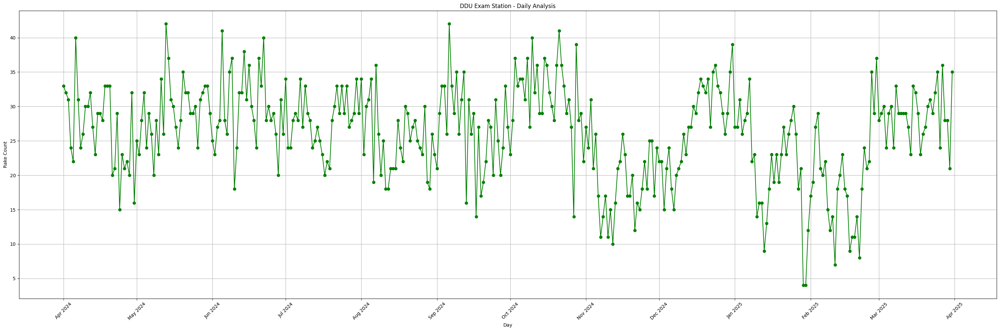

In [556]:
fig, ax = plt.subplots(figsize=(30, 10))
ax.plot(ddu_daily['R_DATEOFMONTH'], ddu_daily['RAKE_COUNT'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('DDU Exam Station - Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('Rake Count')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

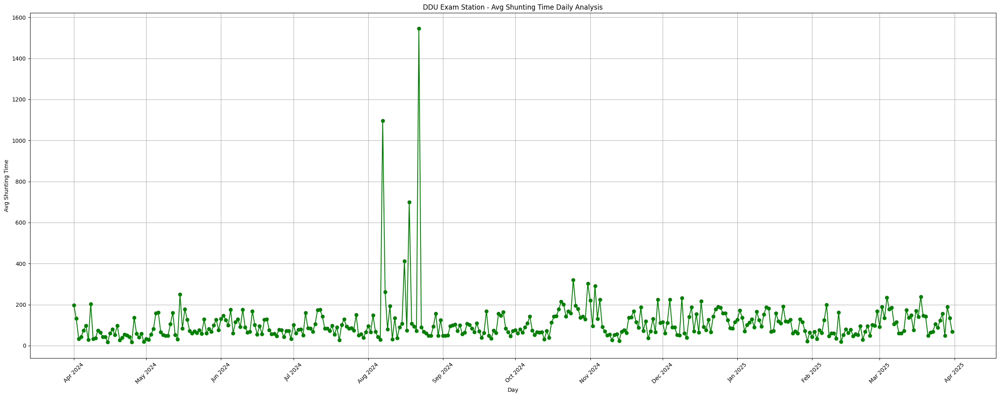

In [557]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(ddu_daily['R_DATEOFMONTH'], ddu_daily['AVG_SHUNTING_TIME'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('DDU Exam Station - Avg Shunting Time Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('Avg Shunting Time')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

In [558]:
ddu_daily[ddu_daily['AVG_SHUNTING_TIME'] > 1000]

,R_DATEOFMONTH,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME,AVG_Num_Rakes_Shunting_At_ARVL,AVG_Num_Rakes_Exam_At_ARVL,AVG_Num_Rakes_Departure_At_ARVL,AVG_Num_Rakes_Exam_At_PLCT,AVG_Num_Rakes_Departure_At_PLCT,AVG_Num_Rakes_Departure_At_RELS,AVG_Time_Since_Last_ARVL,AVG_Time_Since_Last_PLCT,AVG_Time_Since_Last_RELS,AVG_Time_Since_Last_DPRT
122,2024-08-07,36,1096.916667,218.250000,509.583333,5.638889,3.666667,7.722222,4.222222,7.805556,7.833333,47.777778,48.888889,43.75000,42.500000
118,2024-08-22,27,1544.962963,140.296296,656.629630,2.259259,2.518519,5.074074,2.518519,5.185185,5.370370,57.000000,61.259259,54.62963,47.296296


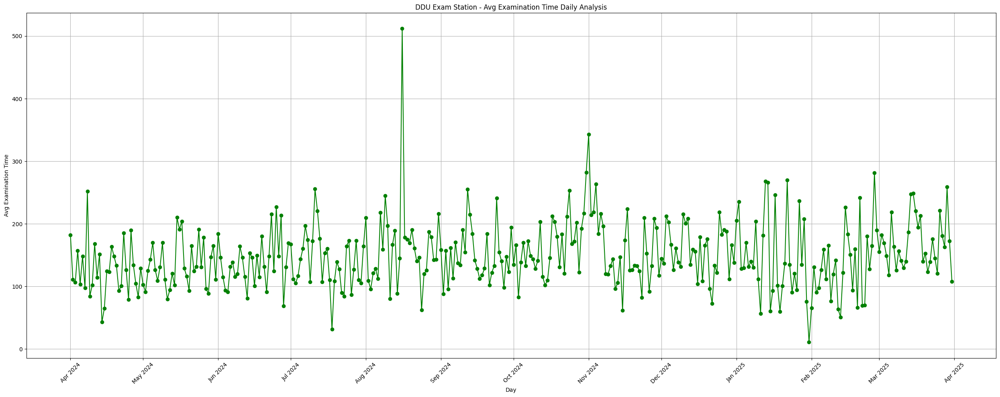

In [559]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(ddu_daily['R_DATEOFMONTH'], ddu_daily['AVG_EXAMINATION_TIME'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('DDU Exam Station - Avg Examination Time Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('Avg Examination Time')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

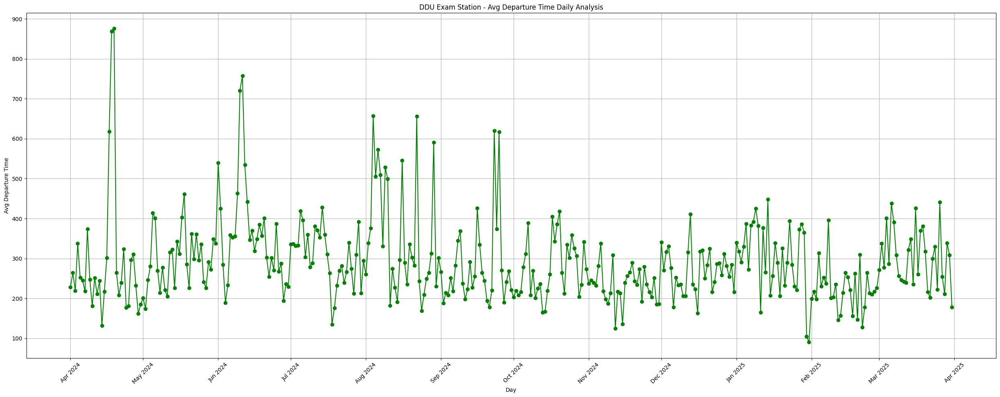

In [560]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(ddu_daily['R_DATEOFMONTH'], ddu_daily['AVG_DEPARTURE_TIME'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('DDU Exam Station - Avg Departure Time Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('Avg Departure Time')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

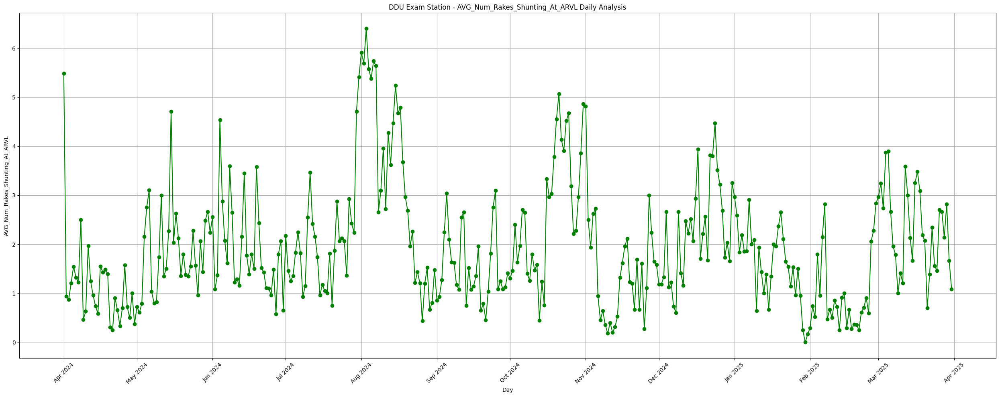

In [561]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(ddu_daily['R_DATEOFMONTH'], ddu_daily['AVG_Num_Rakes_Shunting_At_ARVL'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('DDU Exam Station - AVG_Num_Rakes_Shunting_At_ARVL Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Num_Rakes_Shunting_At_ARVL')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

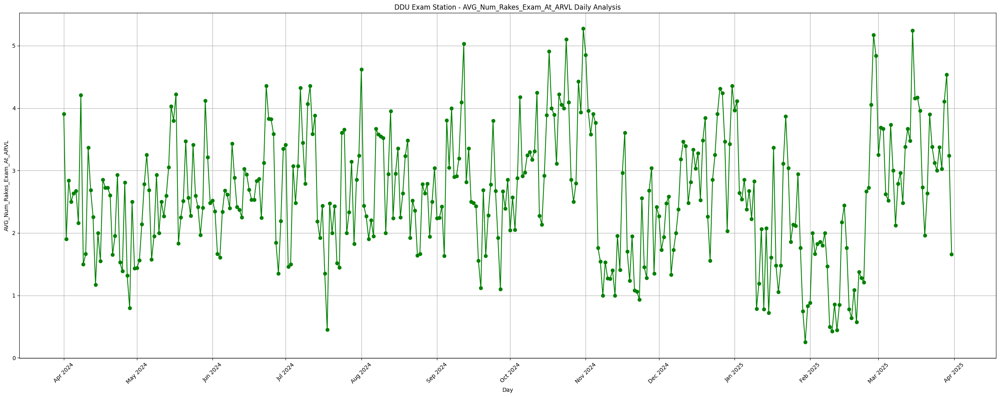

In [562]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(ddu_daily['R_DATEOFMONTH'], ddu_daily['AVG_Num_Rakes_Exam_At_ARVL'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('DDU Exam Station - AVG_Num_Rakes_Exam_At_ARVL Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Num_Rakes_Exam_At_ARVL')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

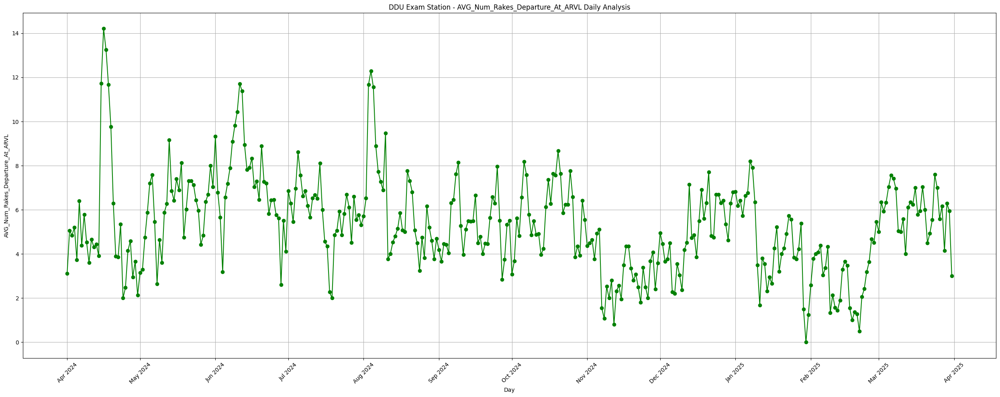

In [563]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(ddu_daily['R_DATEOFMONTH'], ddu_daily['AVG_Num_Rakes_Departure_At_ARVL'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('DDU Exam Station - AVG_Num_Rakes_Departure_At_ARVL Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Num_Rakes_Departure_At_ARVL')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

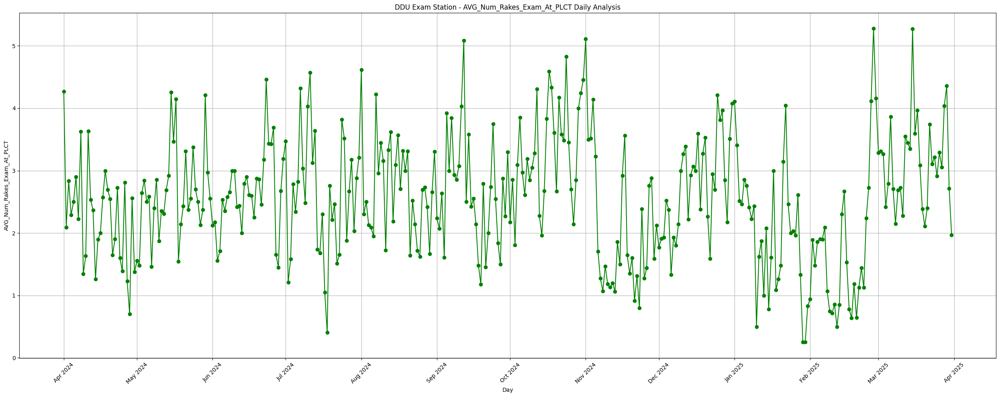

In [564]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(ddu_daily['R_DATEOFMONTH'], ddu_daily['AVG_Num_Rakes_Exam_At_PLCT'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('DDU Exam Station - AVG_Num_Rakes_Exam_At_PLCT Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Num_Rakes_Exam_At_PLCT')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

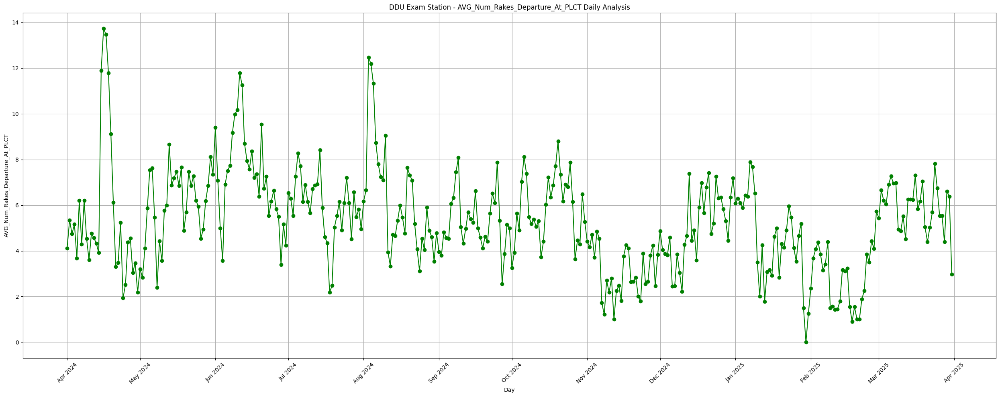

In [565]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(ddu_daily['R_DATEOFMONTH'], ddu_daily['AVG_Num_Rakes_Departure_At_PLCT'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('DDU Exam Station - AVG_Num_Rakes_Departure_At_PLCT Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Num_Rakes_Departure_At_PLCT')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

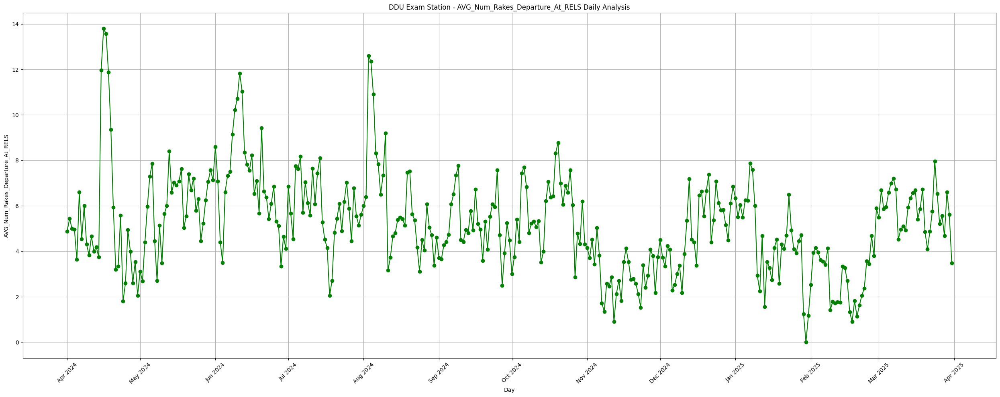

In [566]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(ddu_daily['R_DATEOFMONTH'], ddu_daily['AVG_Num_Rakes_Departure_At_RELS'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('DDU Exam Station - AVG_Num_Rakes_Departure_At_RELS Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Num_Rakes_Departure_At_RELS')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

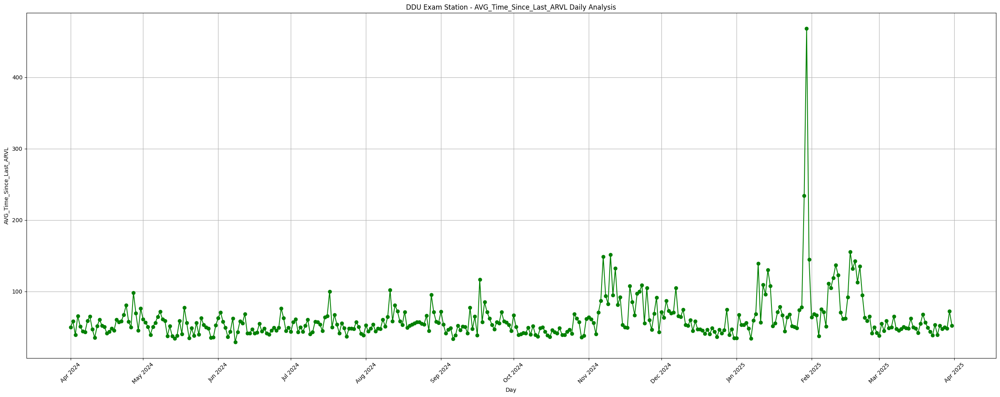

In [567]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(ddu_daily['R_DATEOFMONTH'], ddu_daily['AVG_Time_Since_Last_ARVL'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('DDU Exam Station - AVG_Time_Since_Last_ARVL Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Time_Since_Last_ARVL')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

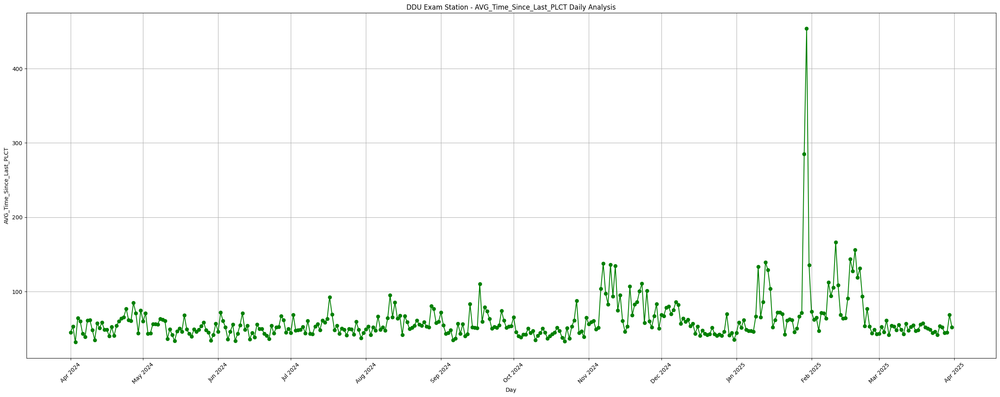

In [568]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(ddu_daily['R_DATEOFMONTH'], ddu_daily['AVG_Time_Since_Last_PLCT'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('DDU Exam Station - AVG_Time_Since_Last_PLCT Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Time_Since_Last_PLCT')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

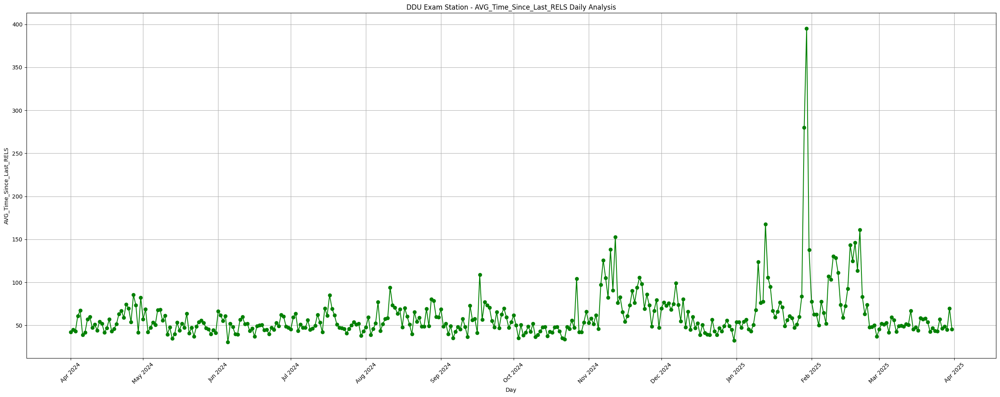

In [569]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(ddu_daily['R_DATEOFMONTH'], ddu_daily['AVG_Time_Since_Last_RELS'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('DDU Exam Station - AVG_Time_Since_Last_RELS Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Time_Since_Last_RELS')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

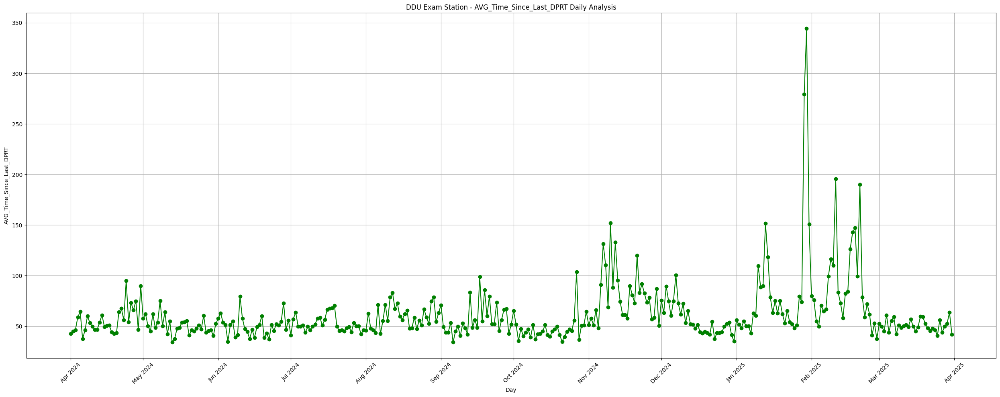

In [570]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(ddu_daily['R_DATEOFMONTH'], ddu_daily['AVG_Time_Since_Last_DPRT'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('DDU Exam Station - AVG_Time_Since_Last_DPRT Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Time_Since_Last_DPRT')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

#### Weekend Analysis

In [571]:
ddu_weekend = df1.groupby('R_DAYOFWEEK', sort=False)['RDATE'].count().reset_index(name='RAKE_COUNT')
ddu_weekend = pd.DataFrame(ddu_weekend)

weekend_shunting_time_sum = df1.groupby('R_DAYOFWEEK', sort=False)['AR_TO_PL'].sum().reset_index(name='Shunting_Time')
weekend_examination_time_sum = df1.groupby('R_DAYOFWEEK', sort=False)['PL_TO_RL'].sum().reset_index(name='Examination_Time')
weekend_departure_lag_time_sum = df1.groupby('R_DAYOFWEEK', sort=False)['RL_TO_DP'].sum().reset_index(name='Departure_Lag')
weekend_numrakes1 = df1.groupby('R_DAYOFWEEK', sort=False)['Num_Rakes_Shunting_At_ARVL'].sum().reset_index(name='numrakes1')
weekend_numrakes2 = df1.groupby('R_DAYOFWEEK', sort=False)['Num_Rakes_Exam_At_ARVL'].sum().reset_index(name='numrakes2')
weekend_numrakes3 = df1.groupby('R_DAYOFWEEK', sort=False)['Num_Rakes_Departure_At_ARVL'].sum().reset_index(name='numrakes3')
weekend_numrakes4 = df1.groupby('R_DAYOFWEEK', sort=False)['Num_Rakes_Exam_At_PLCT'].sum().reset_index(name='numrakes4')
weekend_numrakes5 = df1.groupby('R_DAYOFWEEK', sort=False)['Num_Rakes_Departure_At_PLCT'].sum().reset_index(name='numrakes5')
weekend_numrakes6 = df1.groupby('R_DAYOFWEEK', sort=False)['Num_Rakes_Departure_At_RELS'].sum().reset_index(name='numrakes6')
weekend_timesince1 = df1.groupby('R_DAYOFWEEK', sort=False)['Time_Since_Last_ARVL'].sum().reset_index(name='timesince1')
weekend_timesince2 = df1.groupby('R_DAYOFWEEK', sort=False)['Time_Since_Last_PLCT'].sum().reset_index(name='timesince2')
weekend_timesince3 = df1.groupby('R_DAYOFWEEK', sort=False)['Time_Since_Last_RELS'].sum().reset_index(name='timesince3')
weekend_timesince4 = df1.groupby('R_DAYOFWEEK', sort=False)['Time_Since_Last_DPRT'].sum().reset_index(name='timesince4')

ddu_weekend['AVG_SHUNTING_TIME'] = weekend_shunting_time_sum['Shunting_Time'] / ddu_weekend['RAKE_COUNT']
ddu_weekend['AVG_EXAMINATION_TIME'] = weekend_examination_time_sum['Examination_Time'] / ddu_weekend['RAKE_COUNT']
ddu_weekend['AVG_DEPARTURE_TIME'] = weekend_departure_lag_time_sum['Departure_Lag'] / ddu_weekend['RAKE_COUNT']
ddu_weekend['AVG_Num_Rakes_Shunting_At_ARVL'] = weekend_numrakes1['numrakes1'] / ddu_weekend['RAKE_COUNT']
ddu_weekend['AVG_Num_Rakes_Exam_At_ARVL'] = weekend_numrakes2['numrakes2'] / ddu_weekend['RAKE_COUNT']
ddu_weekend['AVG_Num_Rakes_Departure_At_ARVL'] = weekend_numrakes3['numrakes3'] / ddu_weekend['RAKE_COUNT']
ddu_weekend['AVG_Num_Rakes_Exam_At_PLCT'] = weekend_numrakes4['numrakes4'] / ddu_weekend['RAKE_COUNT']
ddu_weekend['AVG_Num_Rakes_Departure_At_PLCT'] = weekend_numrakes5['numrakes5'] / ddu_weekend['RAKE_COUNT']
ddu_weekend['AVG_Num_Rakes_Departure_At_RELS'] = weekend_numrakes6['numrakes6'] / ddu_weekend['RAKE_COUNT']
ddu_weekend['AVG_Time_Since_Last_ARVL'] = weekend_timesince1['timesince1'] / ddu_weekend['RAKE_COUNT']
ddu_weekend['AVG_Time_Since_Last_PLCT'] = weekend_timesince2['timesince2'] / ddu_weekend['RAKE_COUNT']
ddu_weekend['AVG_Time_Since_Last_RELS'] = weekend_timesince3['timesince3'] / ddu_weekend['RAKE_COUNT']
ddu_weekend['AVG_Time_Since_Last_DPRT'] = weekend_timesince4['timesince4'] / ddu_weekend['RAKE_COUNT']

ddu_weekend

,R_DAYOFWEEK,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME,AVG_Num_Rakes_Shunting_At_ARVL,AVG_Num_Rakes_Exam_At_ARVL,AVG_Num_Rakes_Departure_At_ARVL,AVG_Num_Rakes_Exam_At_PLCT,AVG_Num_Rakes_Departure_At_PLCT,AVG_Num_Rakes_Departure_At_RELS,AVG_Time_Since_Last_ARVL,AVG_Time_Since_Last_PLCT,AVG_Time_Since_Last_RELS,AVG_Time_Since_Last_DPRT
0,0,1443,99.925849,139.970201,293.526681,2.044352,2.646570,5.764380,2.612613,5.717256,5.632710,54.027027,54.580042,53.602218,52.409563
1,1,1353,93.139690,141.320030,286.330377,2.026608,2.704361,5.694752,2.580931,5.737620,5.610495,54.135255,54.098300,54.468588,55.328899
2,2,1361,130.619398,150.196179,298.310066,2.313005,2.809699,5.651727,2.820720,5.665687,5.583395,54.964732,54.552535,55.469508,55.646583
3,3,1359,136.056659,164.465048,315.785136,2.171450,3.024283,5.650478,2.900662,5.680648,5.559235,56.997057,57.124356,56.437822,54.559971
4,4,1317,116.187547,157.017464,299.932422,2.047077,2.803341,5.418375,2.747153,5.376614,5.263478,54.943052,54.988610,56.035687,56.810175
5,5,1398,93.909156,148.527897,282.746066,1.975680,2.759657,5.750358,2.740343,5.766810,5.732475,54.510014,53.779685,53.515021,53.563662
6,6,1322,106.553707,140.690620,293.699697,1.810893,2.588502,5.593041,2.475038,5.583207,5.442511,56.193646,56.266263,55.779123,57.030257


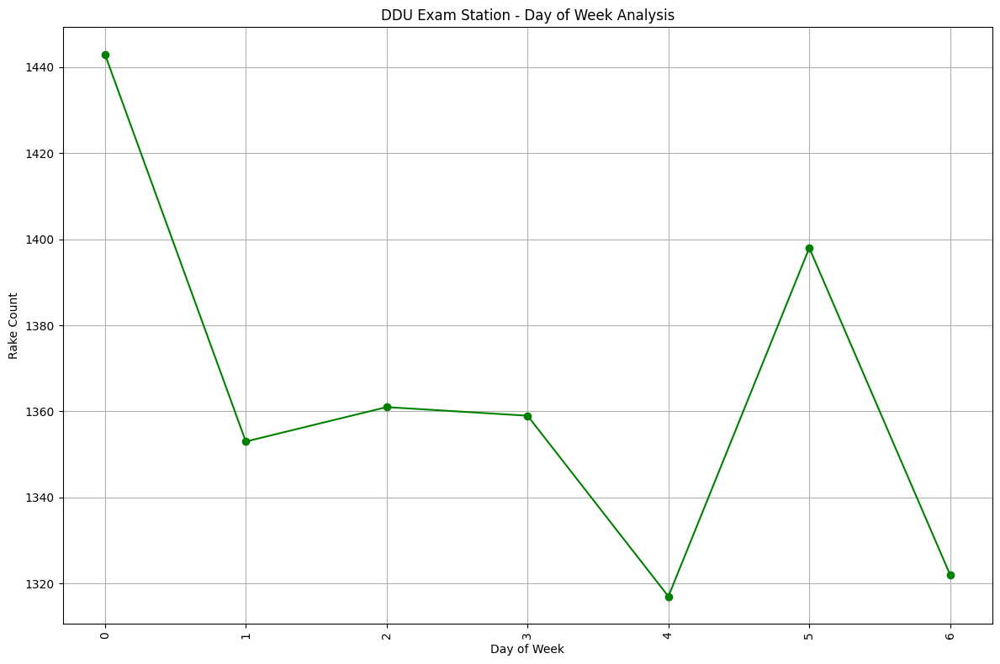

In [572]:
plt.figure(figsize=(12,8))
plt.plot(ddu_weekend['R_DAYOFWEEK'], ddu_weekend['RAKE_COUNT'], marker='o', linestyle='-', color='green')
plt.title('DDU Exam Station - Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('Rake Count')
plt.xticks(rotation=90)
plt.grid(True)
plt.tight_layout()
plt.show()

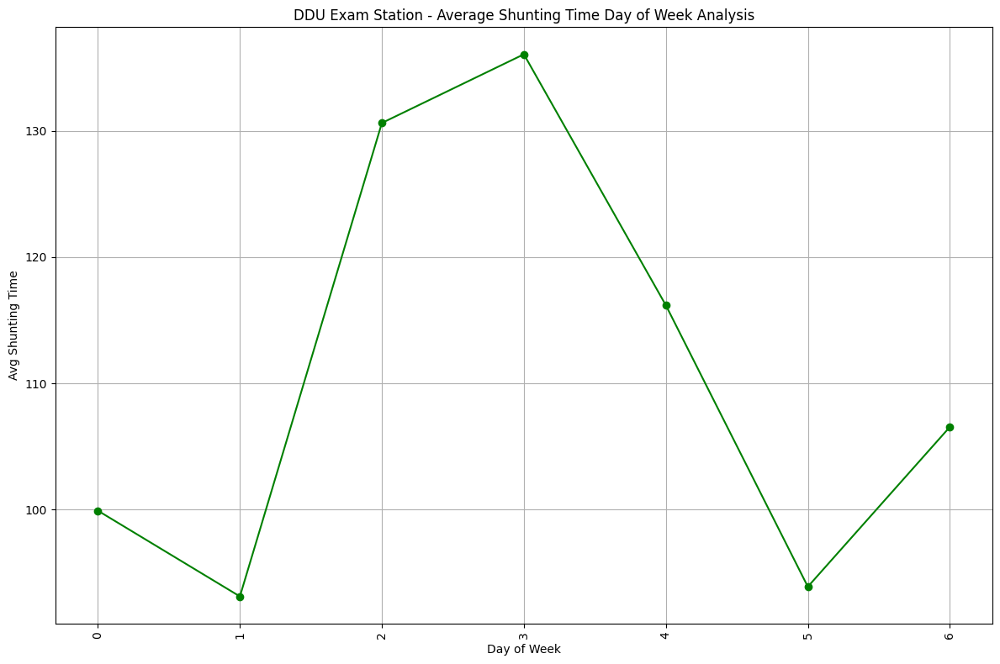

In [573]:
plt.figure(figsize=(12,8))
plt.plot(ddu_weekend['R_DAYOFWEEK'], ddu_weekend['AVG_SHUNTING_TIME'], marker='o', linestyle='-', color='green')
plt.title('DDU Exam Station - Average Shunting Time Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('Avg Shunting Time')
plt.xticks(rotation=90)
plt.grid(True)
plt.tight_layout()
plt.show()

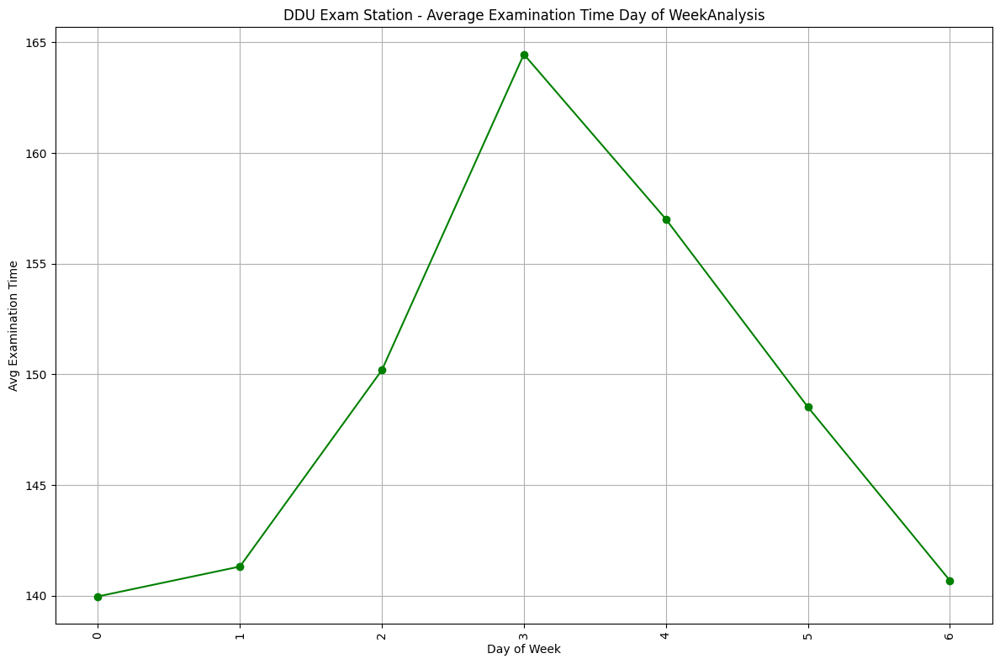

In [574]:
plt.figure(figsize=(12,8))
plt.plot(ddu_weekend['R_DAYOFWEEK'], ddu_weekend['AVG_EXAMINATION_TIME'], marker='o', linestyle='-', color='green')
plt.title('DDU Exam Station - Average Examination Time Day of WeekAnalysis')
plt.xlabel('Day of Week')
plt.ylabel('Avg Examination Time')
plt.xticks(rotation=90)
plt.grid(True)
plt.tight_layout()
plt.show()

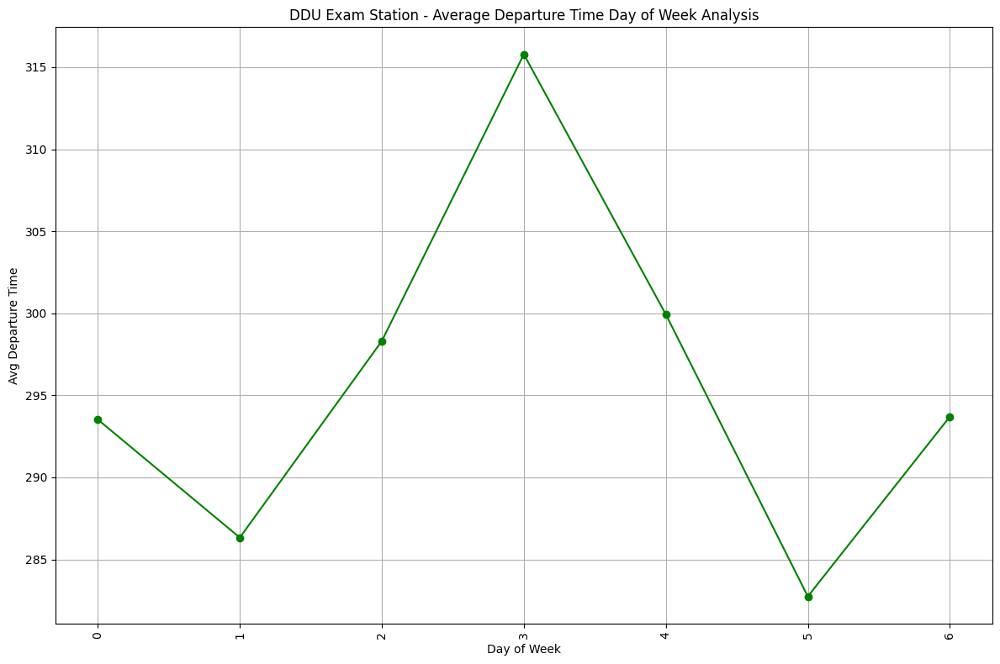

In [575]:
plt.figure(figsize=(12,8))
plt.plot(ddu_weekend['R_DAYOFWEEK'], ddu_weekend['AVG_DEPARTURE_TIME'], marker='o', linestyle='-', color='green')
plt.title('DDU Exam Station - Average Departure Time Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('Avg Departure Time')
plt.xticks(rotation=90)
plt.grid(True)
plt.tight_layout()
plt.show()

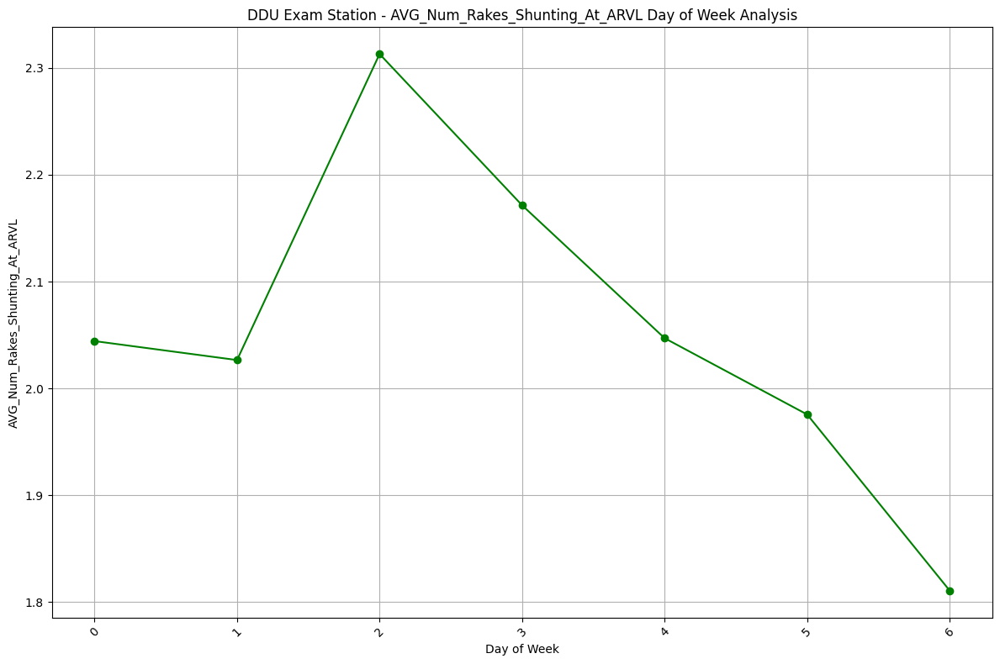

In [576]:
plt.figure(figsize=(12,8))
plt.plot(ddu_weekend['R_DAYOFWEEK'], ddu_weekend['AVG_Num_Rakes_Shunting_At_ARVL'], marker='o', linestyle='-', color='green')
plt.title('DDU Exam Station - AVG_Num_Rakes_Shunting_At_ARVL Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Num_Rakes_Shunting_At_ARVL')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

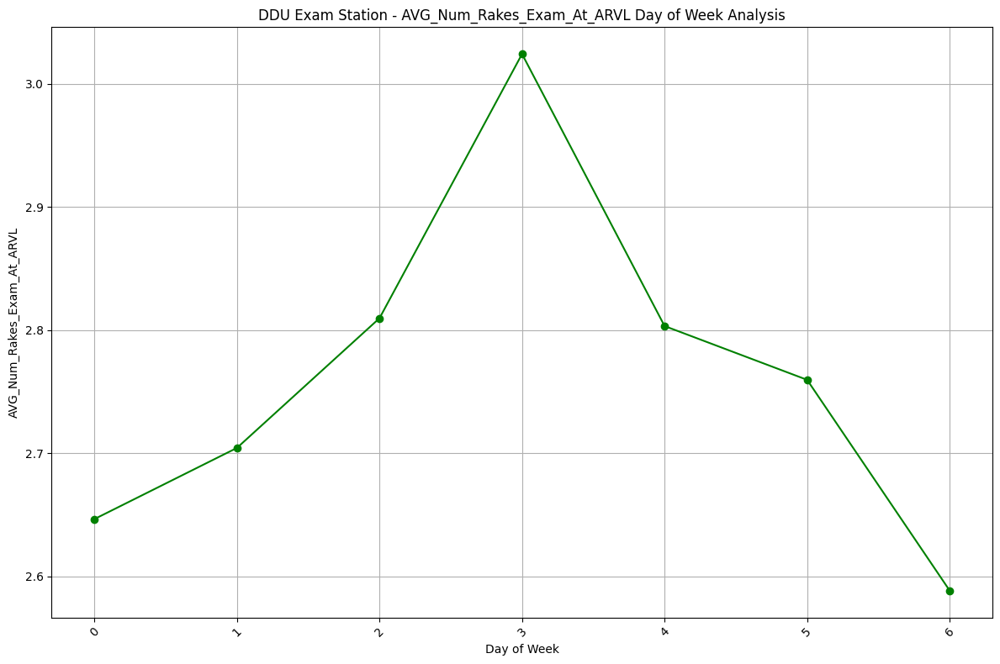

In [577]:
plt.figure(figsize=(12,8))
plt.plot(ddu_weekend['R_DAYOFWEEK'], ddu_weekend['AVG_Num_Rakes_Exam_At_ARVL'], marker='o', linestyle='-', color='green')
plt.title('DDU Exam Station - AVG_Num_Rakes_Exam_At_ARVL Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Num_Rakes_Exam_At_ARVL')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

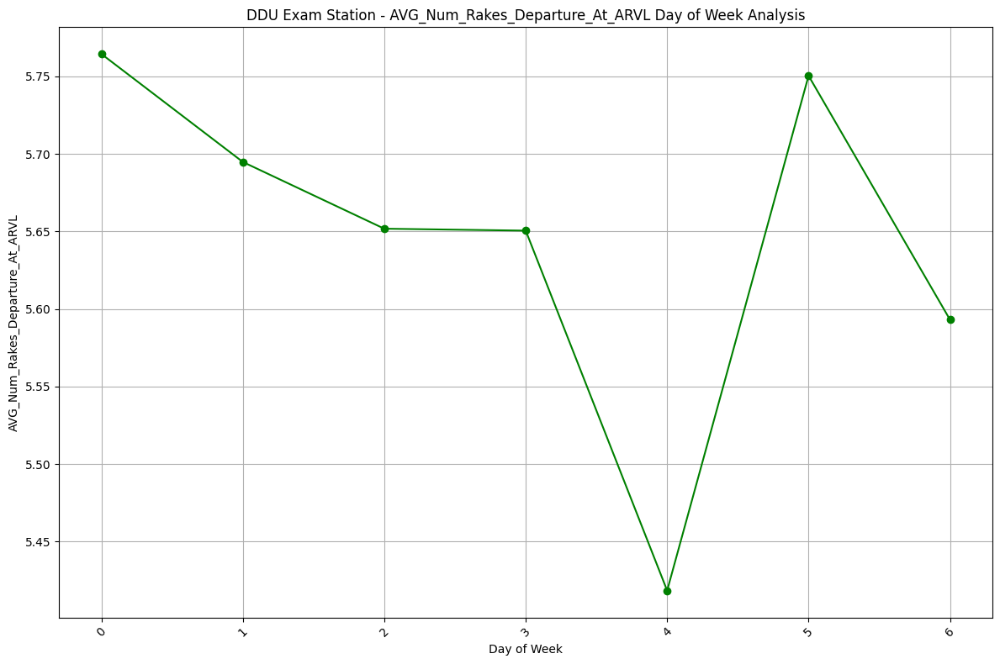

In [578]:
plt.figure(figsize=(12,8))
plt.plot(ddu_weekend['R_DAYOFWEEK'], ddu_weekend['AVG_Num_Rakes_Departure_At_ARVL'], marker='o', linestyle='-', color='green')
plt.title('DDU Exam Station - AVG_Num_Rakes_Departure_At_ARVL Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Num_Rakes_Departure_At_ARVL')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

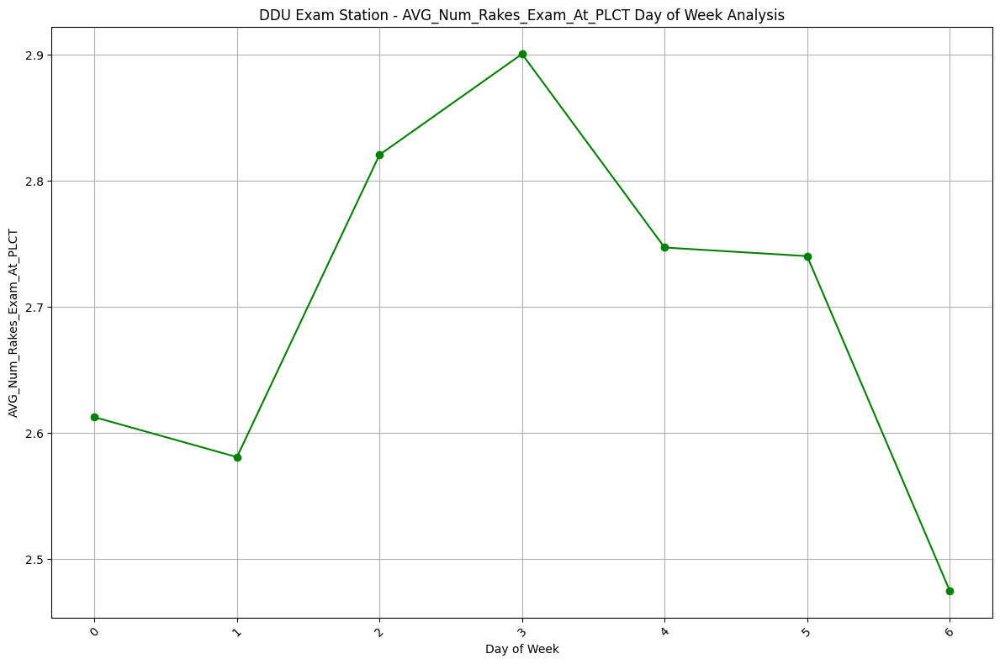

In [579]:
plt.figure(figsize=(12,8))
plt.plot(ddu_weekend['R_DAYOFWEEK'], ddu_weekend['AVG_Num_Rakes_Exam_At_PLCT'], marker='o', linestyle='-', color='green')
plt.title('DDU Exam Station - AVG_Num_Rakes_Exam_At_PLCT Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Num_Rakes_Exam_At_PLCT')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

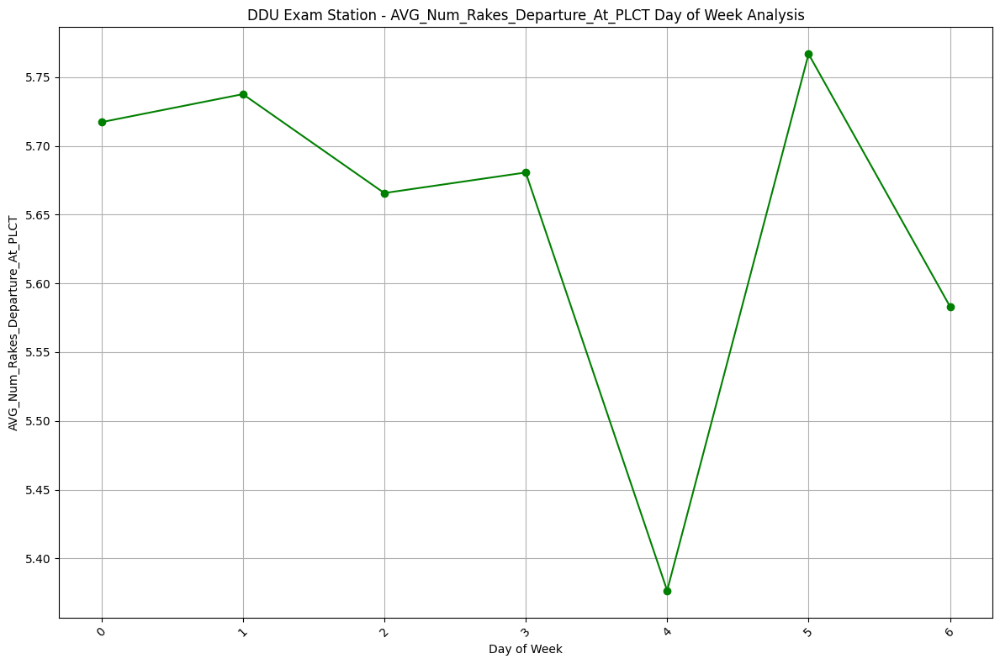

In [580]:
plt.figure(figsize=(12,8))
plt.plot(ddu_weekend['R_DAYOFWEEK'], ddu_weekend['AVG_Num_Rakes_Departure_At_PLCT'], marker='o', linestyle='-', color='green')
plt.title('DDU Exam Station - AVG_Num_Rakes_Departure_At_PLCT Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Num_Rakes_Departure_At_PLCT')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

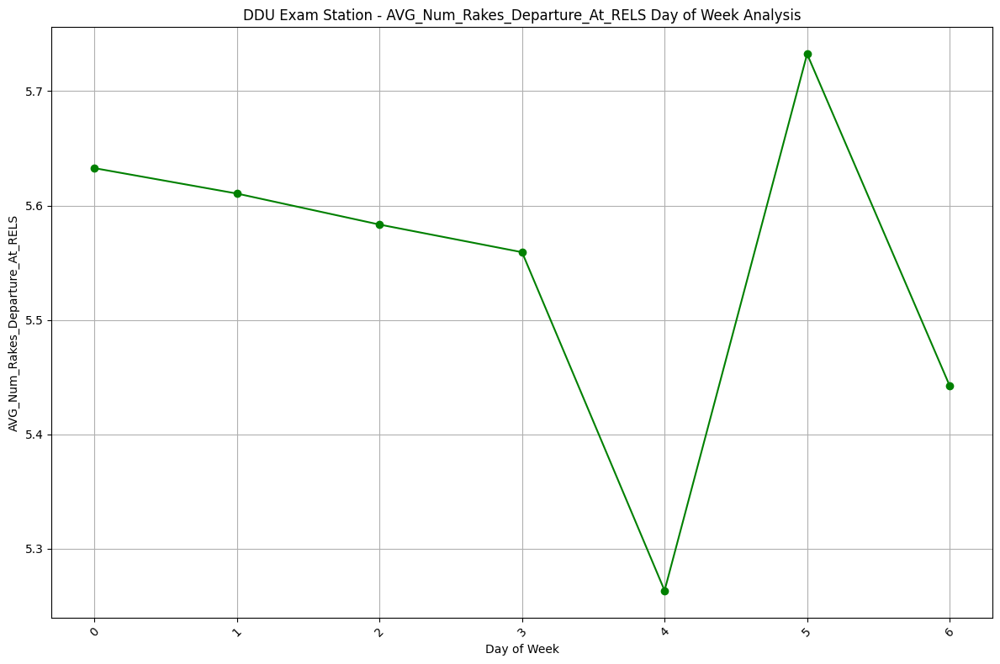

In [581]:
plt.figure(figsize=(12,8))
plt.plot(ddu_weekend['R_DAYOFWEEK'], ddu_weekend['AVG_Num_Rakes_Departure_At_RELS'], marker='o', linestyle='-', color='green')
plt.title('DDU Exam Station - AVG_Num_Rakes_Departure_At_RELS Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Num_Rakes_Departure_At_RELS')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

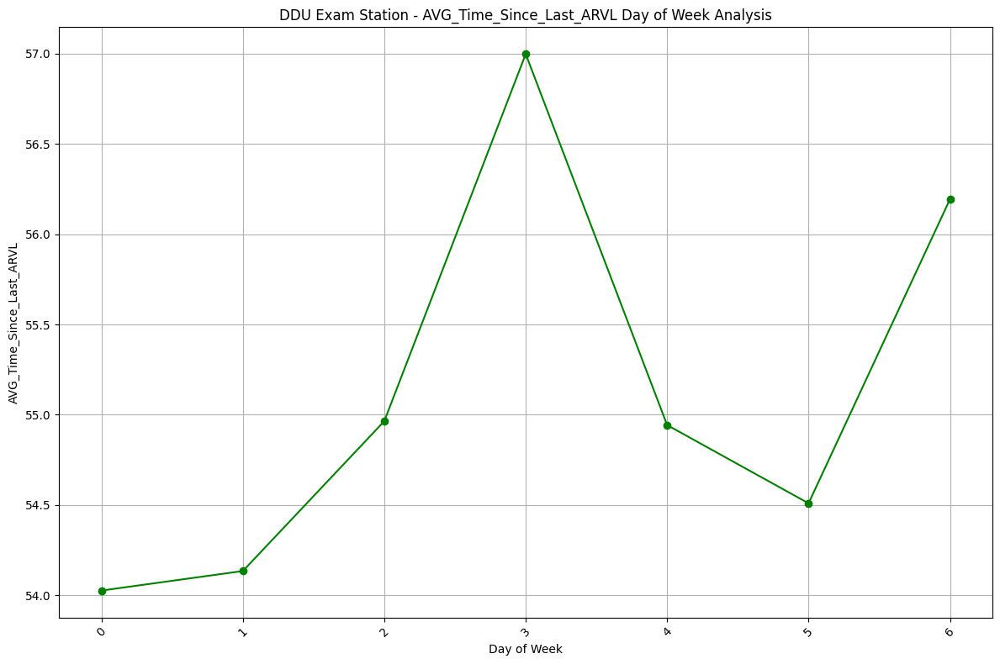

In [582]:
plt.figure(figsize=(12,8))
plt.plot(ddu_weekend['R_DAYOFWEEK'], ddu_weekend['AVG_Time_Since_Last_ARVL'], marker='o', linestyle='-', color='green')
plt.title('DDU Exam Station - AVG_Time_Since_Last_ARVL Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Time_Since_Last_ARVL')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

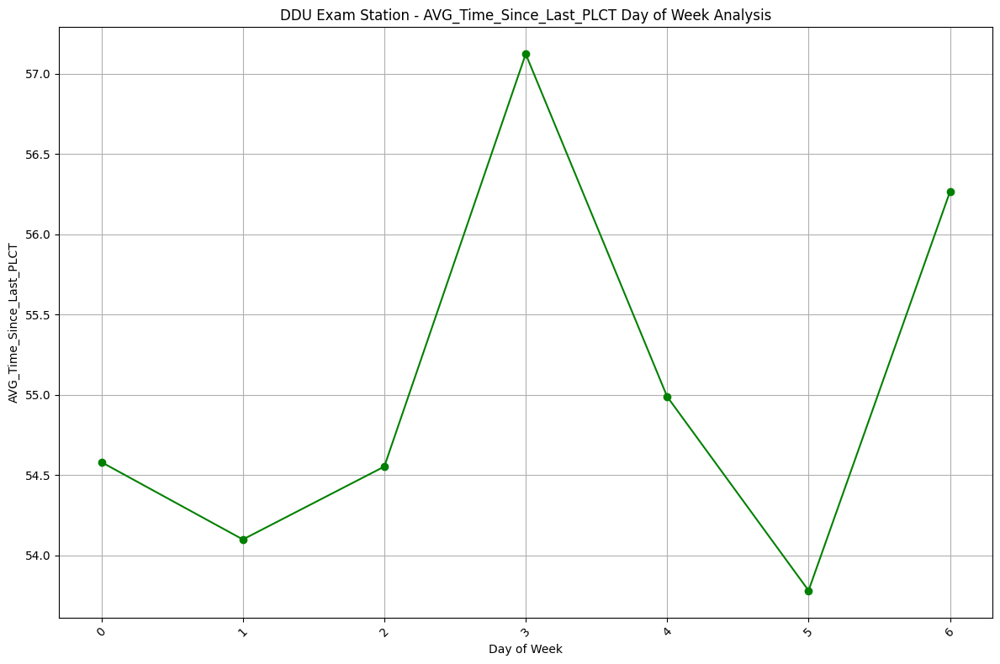

In [583]:
plt.figure(figsize=(12,8))
plt.plot(ddu_weekend['R_DAYOFWEEK'], ddu_weekend['AVG_Time_Since_Last_PLCT'], marker='o', linestyle='-', color='green')
plt.title('DDU Exam Station - AVG_Time_Since_Last_PLCT Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Time_Since_Last_PLCT')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

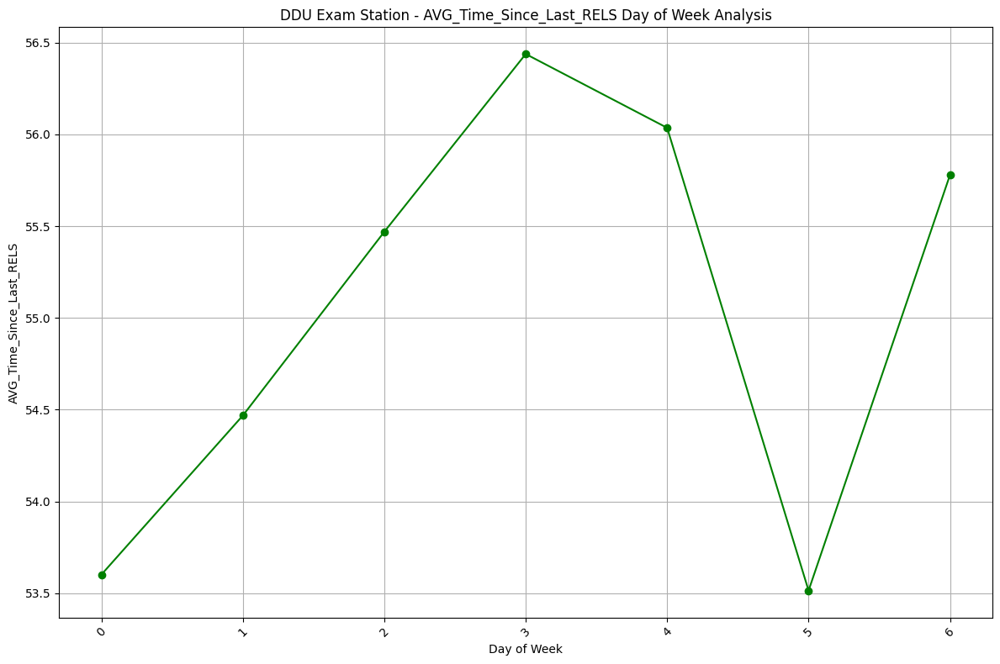

In [584]:
plt.figure(figsize=(12,8))
plt.plot(ddu_weekend['R_DAYOFWEEK'], ddu_weekend['AVG_Time_Since_Last_RELS'], marker='o', linestyle='-', color='green')
plt.title('DDU Exam Station - AVG_Time_Since_Last_RELS Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Time_Since_Last_RELS')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

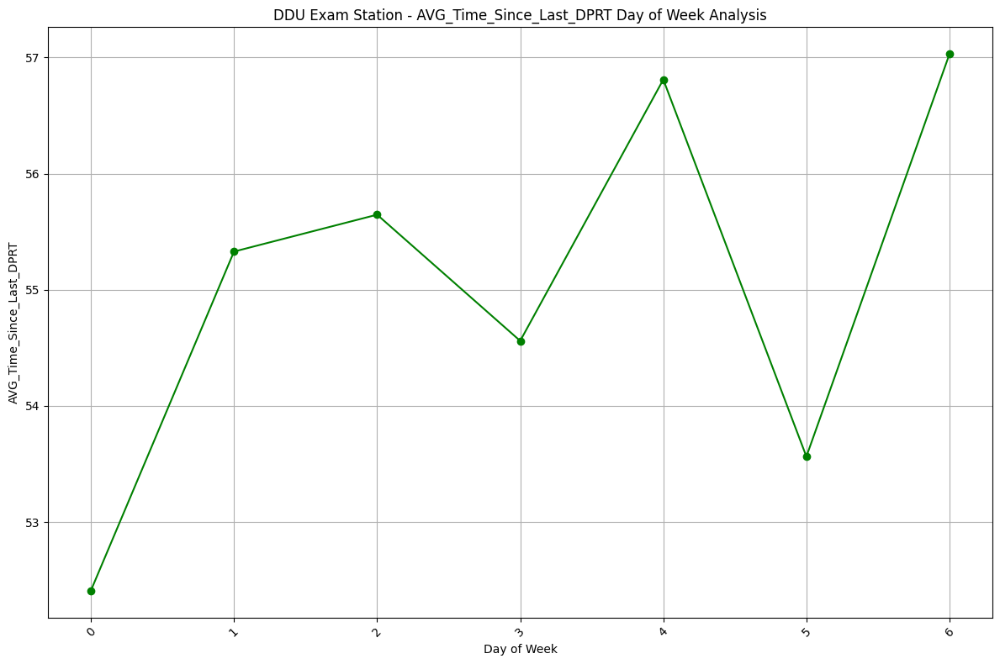

In [585]:
plt.figure(figsize=(12,8))
plt.plot(ddu_weekend['R_DAYOFWEEK'], ddu_weekend['AVG_Time_Since_Last_DPRT'], marker='o', linestyle='-', color='green')
plt.title('DDU Exam Station - AVG_Time_Since_Last_DPRT Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Time_Since_Last_DPRT')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

#### Hourly Analysis

In [586]:
ddu_arvl_h = ddu.groupby('ARVL_H')['RDATE'].count().reset_index(name='RAKE_COUNT')
ddu_arvl_h = pd.DataFrame(ddu_arvl_h)
ddu_plct_h = ddu.groupby('PLCT_H')['RDATE'].count().reset_index(name='RAKE_COUNT')
ddu_plct_h = pd.DataFrame(ddu_plct_h)
ddu_rels_h = ddu.groupby('RELS_H')['RDATE'].count().reset_index(name='RAKE_COUNT')
ddu_rels_h = pd.DataFrame(ddu_rels_h)
ddu_dprt_h = ddu.groupby('DPRT_H')['RDATE'].count().reset_index(name='RAKE_COUNT')
ddu_dprt_h = pd.DataFrame(ddu_dprt_h)

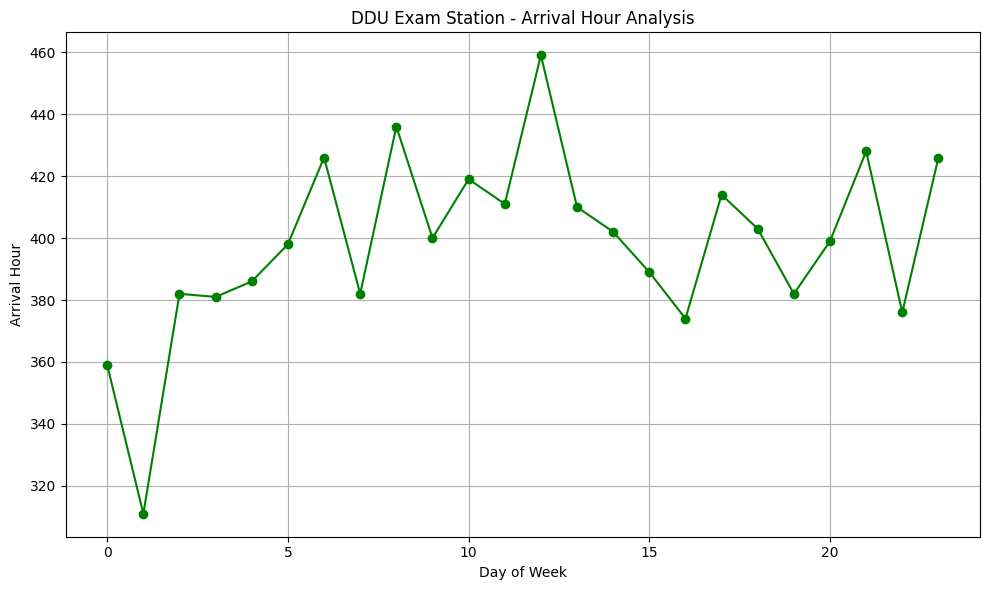

In [587]:
plt.figure(figsize=(10,6))
plt.plot(ddu_arvl_h['ARVL_H'], ddu_arvl_h['RAKE_COUNT'], marker='o', linestyle='-', color='green')
plt.title('DDU Exam Station - Arrival Hour Analysis')
plt.xlabel('Day of Week')
plt.ylabel('Arrival Hour')
plt.grid(True)
plt.tight_layout()
plt.show()

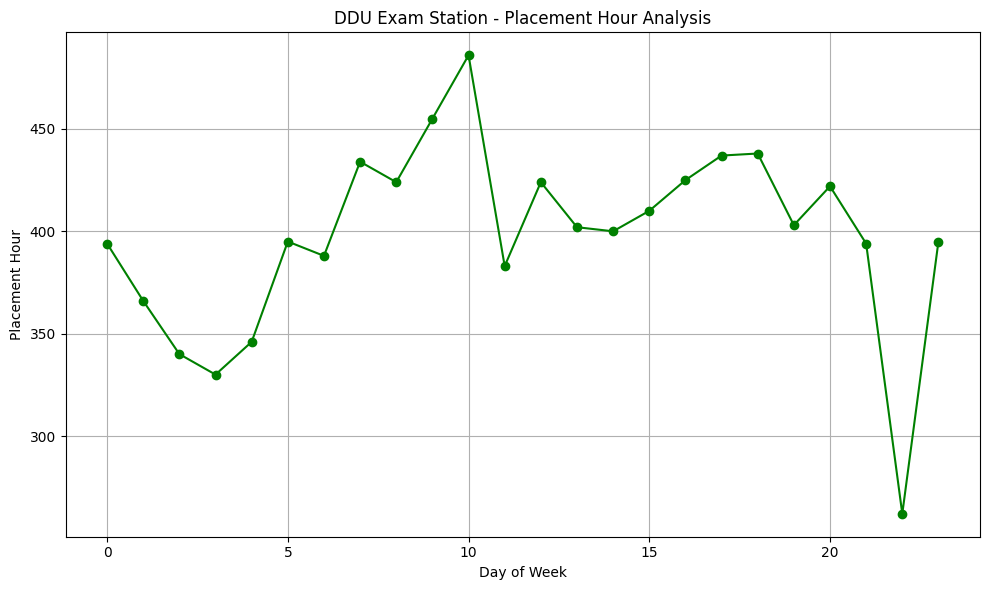

In [588]:
plt.figure(figsize=(10,6))
plt.plot(ddu_plct_h['PLCT_H'], ddu_plct_h['RAKE_COUNT'], marker='o', linestyle='-', color='green')
plt.title('DDU Exam Station - Placement Hour Analysis')
plt.xlabel('Day of Week')
plt.ylabel('Placement Hour')
plt.grid(True)
plt.tight_layout()
plt.show()

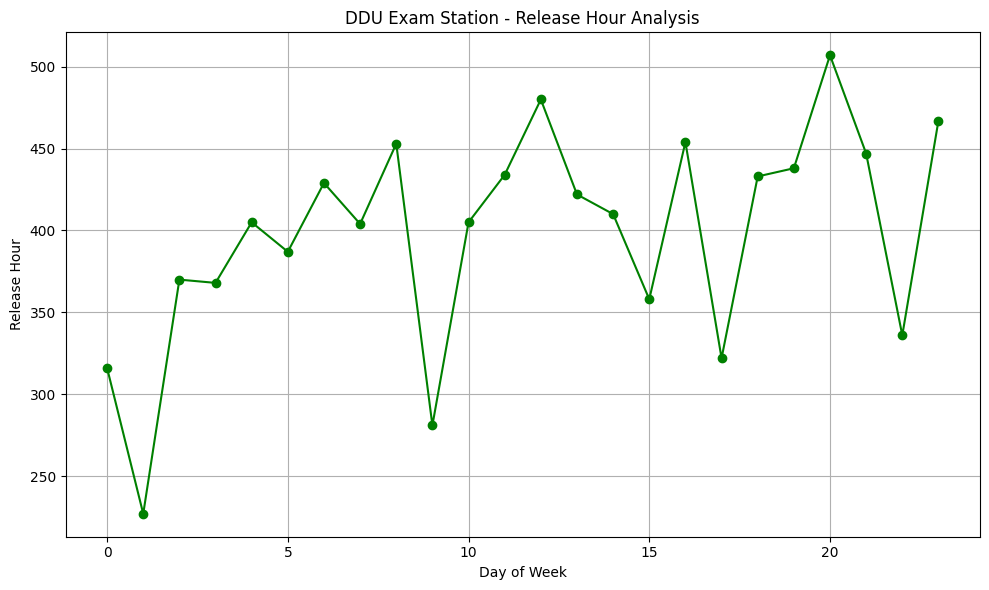

In [589]:
plt.figure(figsize=(10,6))
plt.plot(ddu_rels_h['RELS_H'], ddu_rels_h['RAKE_COUNT'], marker='o', linestyle='-', color='green')
plt.title('DDU Exam Station - Release Hour Analysis')
plt.xlabel('Day of Week')
plt.ylabel('Release Hour')
plt.grid(True)
plt.tight_layout()
plt.show()

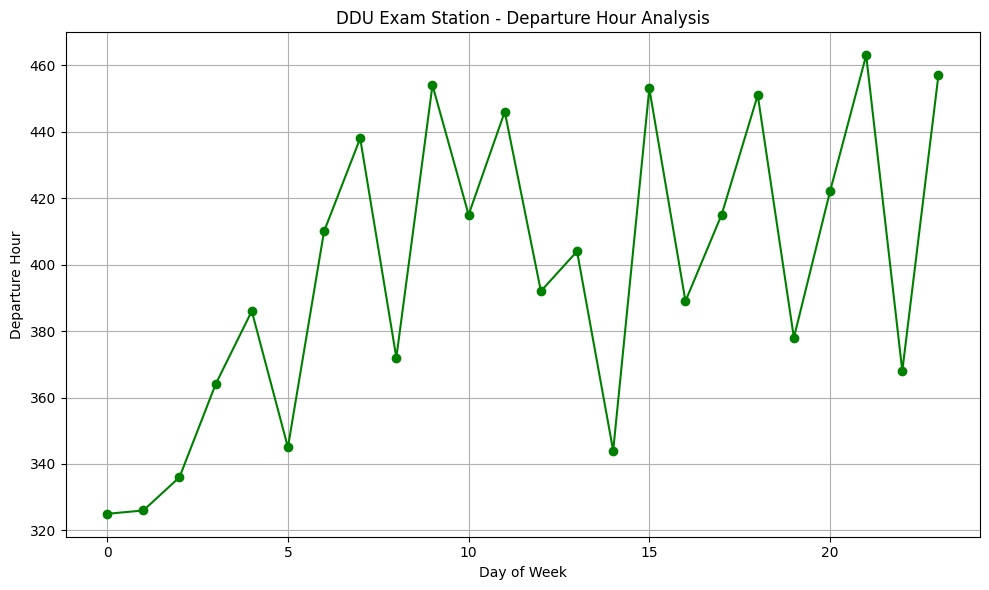

In [590]:
plt.figure(figsize=(10,6))
plt.plot(ddu_dprt_h['DPRT_H'], ddu_dprt_h['RAKE_COUNT'], marker='o', linestyle='-', color='green')
plt.title('DDU Exam Station - Departure Hour Analysis')
plt.xlabel('Day of Week')
plt.ylabel('Departure Hour')
plt.grid(True)
plt.tight_layout()
plt.show()

In [591]:
corr_df = df1.copy()

In [592]:
corr_df['R_DATEOFMONTH'] = corr_df['R_DATEOFMONTH'].str.split('-').str[2].astype('int64')
corr_df['R_MONTH'] = corr_df['R_MONTH'].str.split('-').str[1].astype('int64')
corr_df['R_WEEK'] = corr_df['R_WEEK'].str.split('-').str[1].astype('int64')

corr_df.drop(columns=['RDATE','RAKETYPE','EXAMSTTN','ZONE'], axis=1, inplace=True)

In [593]:
corr = corr_df.corr()

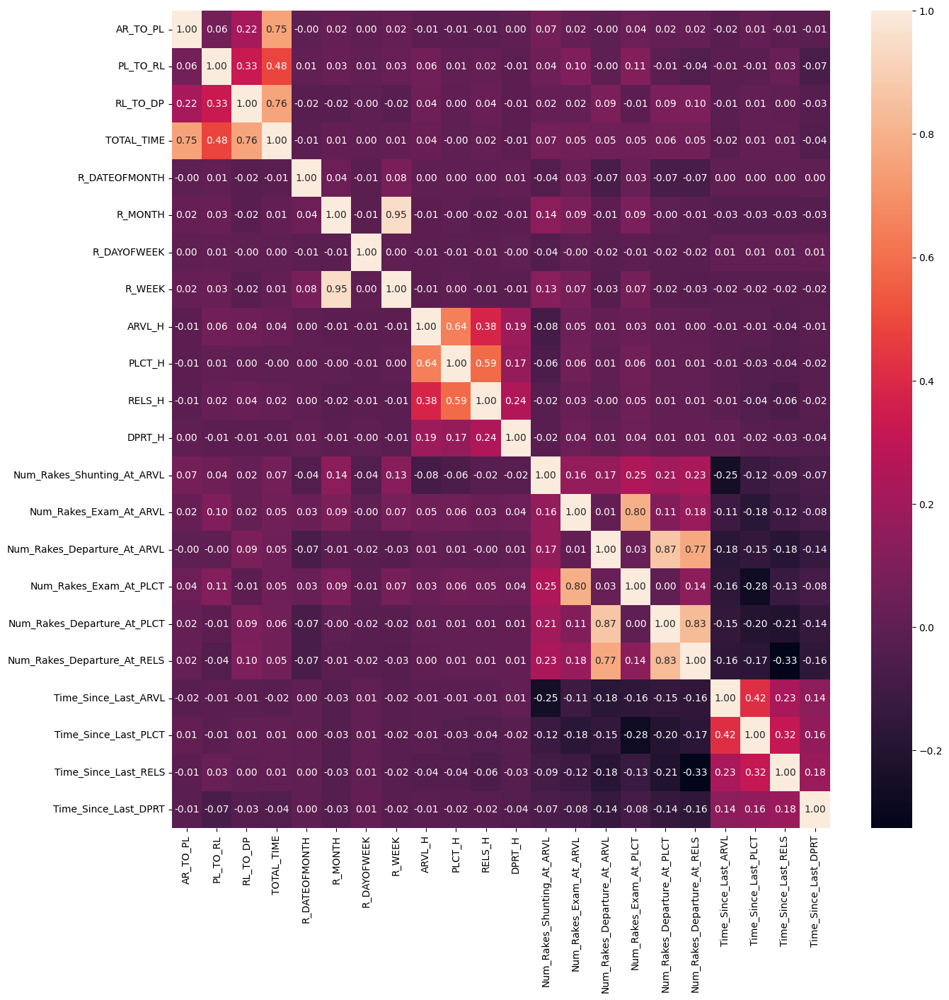

In [594]:
plt.figure(figsize=(15,15))
sns.heatmap(corr, annot=True, fmt=".2f")
plt.show()

#### 10 new feature analysis

In [595]:
df1[['Num_Rakes_Shunting_At_ARVL','Num_Rakes_Exam_At_ARVL','Num_Rakes_Departure_At_ARVL','Num_Rakes_Exam_At_PLCT','Num_Rakes_Departure_At_PLCT','Num_Rakes_Departure_At_RELS','Time_Since_Last_ARVL','Time_Since_Last_PLCT','Time_Since_Last_RELS','Time_Since_Last_DPRT']].describe()

,Num_Rakes_Shunting_At_ARVL,Num_Rakes_Exam_At_ARVL,Num_Rakes_Departure_At_ARVL,Num_Rakes_Exam_At_PLCT,Num_Rakes_Departure_At_PLCT,Num_Rakes_Departure_At_RELS,Time_Since_Last_ARVL,Time_Since_Last_PLCT,Time_Since_Last_RELS,Time_Since_Last_DPRT
count,9553.000000,9553.000000,9553.000000,9553.000000,9553.000000,9553.000000,9553.000000,9553.000000,9553.000000,9553.000000
mean,2.056213,2.761855,5.648801,2.696954,5.649325,5.549461,55.095258,55.042395,55.018319,55.005129
std,1.752326,1.665469,2.659579,1.628939,2.646963,2.619443,59.890654,58.445675,57.587134,64.352111
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,2.000000,4.000000,2.000000,4.000000,4.000000,15.000000,15.000000,15.000000,5.000000
50%,2.000000,3.000000,6.000000,3.000000,6.000000,5.000000,37.000000,40.000000,40.000000,35.000000
75%,3.000000,4.000000,7.000000,4.000000,7.000000,7.000000,75.000000,75.000000,75.000000,84.000000
max,11.000000,10.000000,19.000000,10.000000,19.000000,19.000000,856.000000,920.000000,920.000000,915.000000


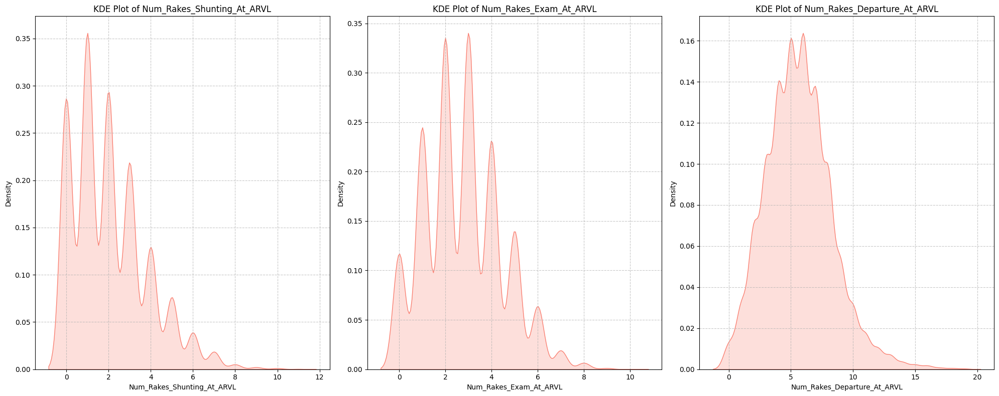

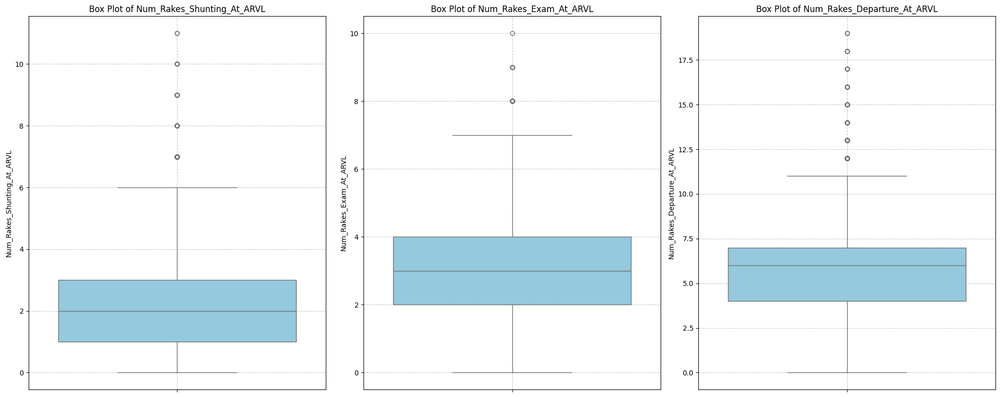

In [596]:
plt.figure(figsize=(20, 8))

plt.subplot(1, 3, 1)
sns.kdeplot(df1['Num_Rakes_Shunting_At_ARVL'], fill=True, color='salmon')
plt.title('KDE Plot of Num_Rakes_Shunting_At_ARVL')
plt.xlabel('Num_Rakes_Shunting_At_ARVL')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 2)
sns.kdeplot(df1['Num_Rakes_Exam_At_ARVL'], fill=True, color='salmon')
plt.title('KDE Plot of Num_Rakes_Exam_At_ARVL')
plt.xlabel('Num_Rakes_Exam_At_ARVL')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 3)
sns.kdeplot(df1['Num_Rakes_Departure_At_ARVL'], fill=True, color='salmon')
plt.title('KDE Plot of Num_Rakes_Departure_At_ARVL')
plt.xlabel('Num_Rakes_Departure_At_ARVL')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()


plt.figure(figsize=(20, 8))

plt.subplot(1, 3, 1)
sns.boxplot(y=df1['Num_Rakes_Shunting_At_ARVL'], color='skyblue')
plt.title('Box Plot of Num_Rakes_Shunting_At_ARVL')
plt.ylabel('Num_Rakes_Shunting_At_ARVL')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 2)
sns.boxplot(y=df1['Num_Rakes_Exam_At_ARVL'], color='skyblue')
plt.title('Box Plot of Num_Rakes_Exam_At_ARVL')
plt.ylabel('Num_Rakes_Exam_At_ARVL')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 3)
sns.boxplot(y=df1['Num_Rakes_Departure_At_ARVL'], color='skyblue')
plt.title('Box Plot of Num_Rakes_Departure_At_ARVL')
plt.ylabel('Num_Rakes_Departure_At_ARVL')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout() 

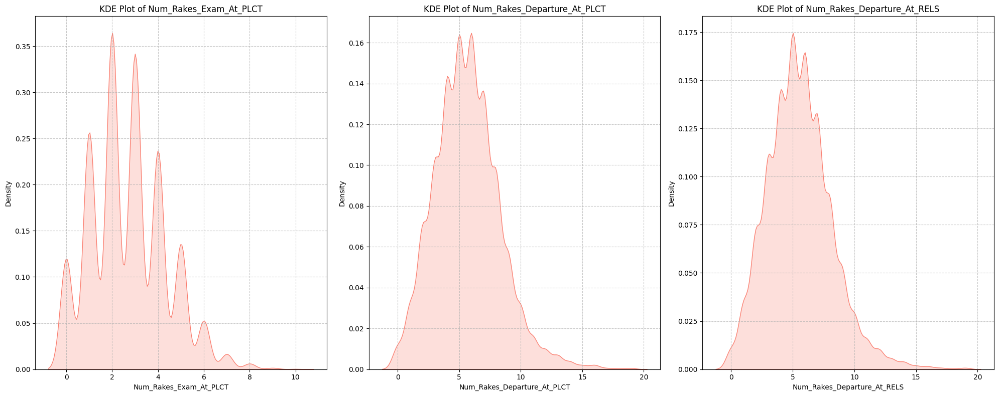

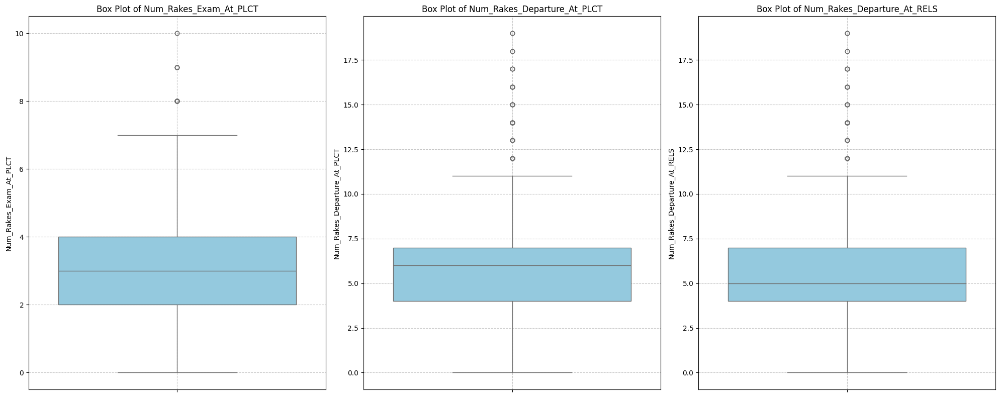

In [597]:
plt.figure(figsize=(20, 8))

plt.subplot(1, 3, 1)
sns.kdeplot(df1['Num_Rakes_Exam_At_PLCT'], fill=True, color='salmon')
plt.title('KDE Plot of Num_Rakes_Exam_At_PLCT')
plt.xlabel('Num_Rakes_Exam_At_PLCT')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 2)
sns.kdeplot(df1['Num_Rakes_Departure_At_PLCT'], fill=True, color='salmon')
plt.title('KDE Plot of Num_Rakes_Departure_At_PLCT')
plt.xlabel('Num_Rakes_Departure_At_PLCT')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 3)
sns.kdeplot(df1['Num_Rakes_Departure_At_RELS'], fill=True, color='salmon')
plt.title('KDE Plot of Num_Rakes_Departure_At_RELS')
plt.xlabel('Num_Rakes_Departure_At_RELS')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()


plt.figure(figsize=(20, 8))

plt.subplot(1, 3, 1)
sns.boxplot(y=df1['Num_Rakes_Exam_At_PLCT'], color='skyblue')
plt.title('Box Plot of Num_Rakes_Exam_At_PLCT')
plt.ylabel('Num_Rakes_Exam_At_PLCT')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 2)
sns.boxplot(y=df1['Num_Rakes_Departure_At_PLCT'], color='skyblue')
plt.title('Box Plot of Num_Rakes_Departure_At_PLCT')
plt.ylabel('Num_Rakes_Departure_At_PLCT')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 3)
sns.boxplot(y=df1['Num_Rakes_Departure_At_RELS'], color='skyblue')
plt.title('Box Plot of Num_Rakes_Departure_At_RELS')
plt.ylabel('Num_Rakes_Departure_At_RELS')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout() 

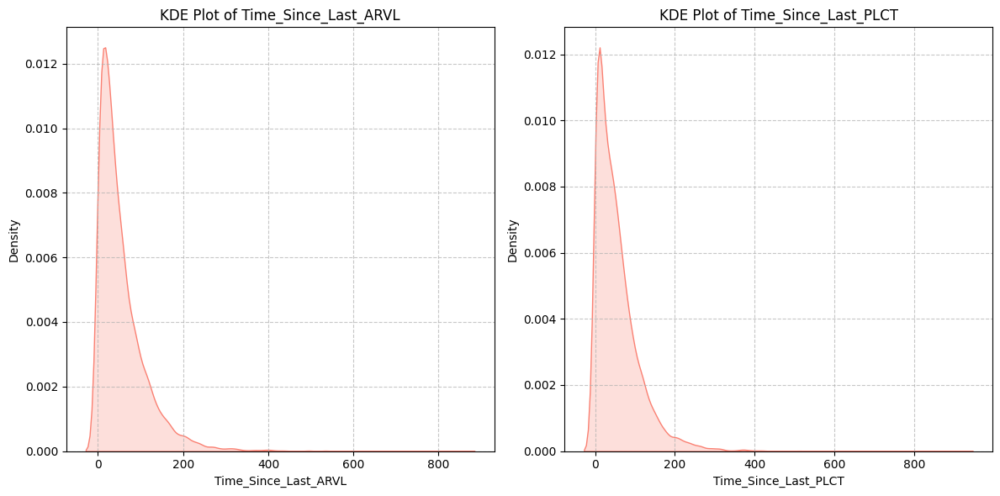

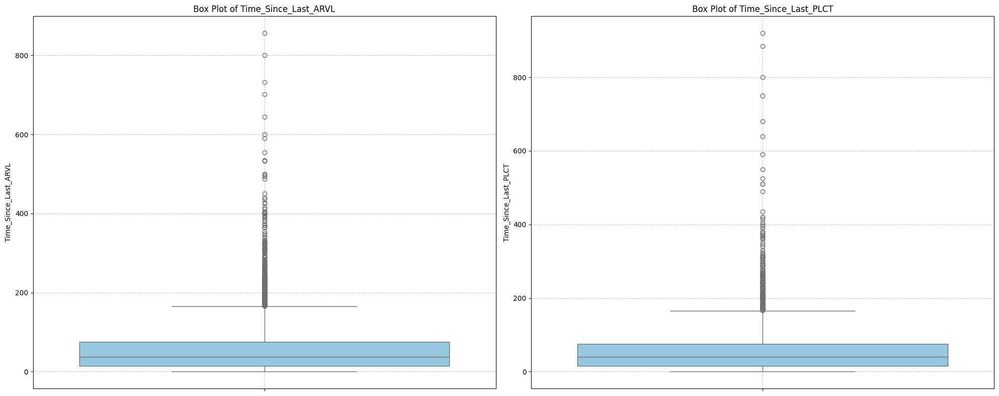

In [598]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.kdeplot(df1['Time_Since_Last_ARVL'], fill=True, color='salmon')
plt.title('KDE Plot of Time_Since_Last_ARVL')
plt.xlabel('Time_Since_Last_ARVL')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.kdeplot(df1['Time_Since_Last_PLCT'], fill=True, color='salmon')
plt.title('KDE Plot of Time_Since_Last_PLCT')
plt.xlabel('Time_Since_Last_PLCT')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()


plt.figure(figsize=(20, 8))

plt.subplot(1, 2, 1)
sns.boxplot(y=df1['Time_Since_Last_ARVL'], color='skyblue')
plt.title('Box Plot of Time_Since_Last_ARVL')
plt.ylabel('Time_Since_Last_ARVL')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.boxplot(y=df1['Time_Since_Last_PLCT'], color='skyblue')
plt.title('Box Plot of Time_Since_Last_PLCT')
plt.ylabel('Time_Since_Last_PLCT')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout() 

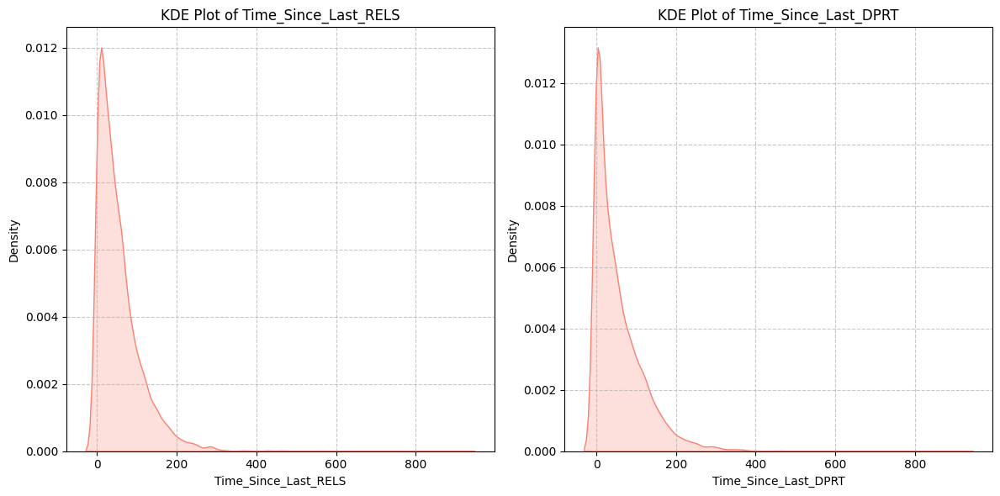

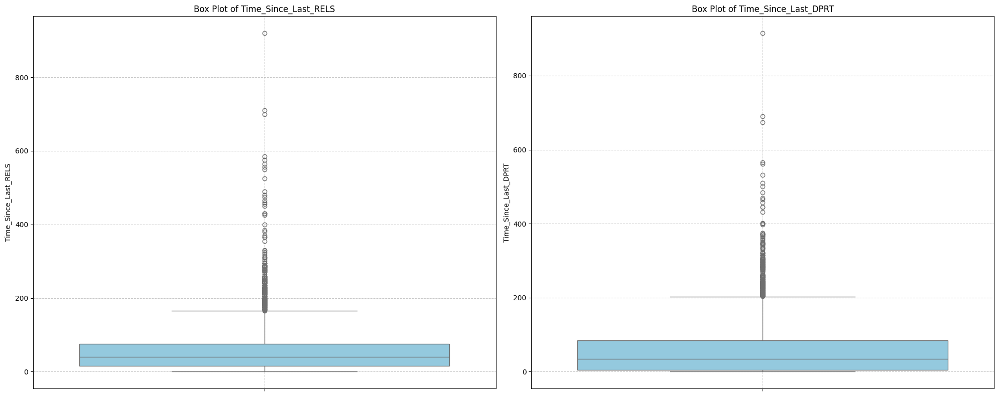

In [599]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.kdeplot(df1['Time_Since_Last_RELS'], fill=True, color='salmon')
plt.title('KDE Plot of Time_Since_Last_RELS')
plt.xlabel('Time_Since_Last_RELS')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.kdeplot(df1['Time_Since_Last_DPRT'], fill=True, color='salmon')
plt.title('KDE Plot of Time_Since_Last_DPRT')
plt.xlabel('Time_Since_Last_DPRT')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()


plt.figure(figsize=(20, 8))

plt.subplot(1, 2, 1)
sns.boxplot(y=df1['Time_Since_Last_RELS'], color='skyblue')
plt.title('Box Plot of Time_Since_Last_RELS')
plt.ylabel('Time_Since_Last_RELS')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.boxplot(y=df1['Time_Since_Last_DPRT'], color='skyblue')
plt.title('Box Plot of Time_Since_Last_DPRT')
plt.ylabel('Time_Since_Last_DPRT')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout() 

### Handling Outliers on the basis of EDA

#### outliers removal

In [698]:
ddu_daily

,R_DATEOFMONTH,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME,AVG_Num_Rakes_Shunting_At_ARVL,AVG_Num_Rakes_Exam_At_ARVL,AVG_Num_Rakes_Departure_At_ARVL,AVG_Num_Rakes_Exam_At_PLCT,AVG_Num_Rakes_Departure_At_PLCT,AVG_Num_Rakes_Departure_At_RELS,AVG_Time_Since_Last_ARVL,AVG_Time_Since_Last_PLCT,AVG_Time_Since_Last_RELS,AVG_Time_Since_Last_DPRT
0,2024-04-01,33,196.909091,181.909091,228.454545,5.484848,3.909091,3.121212,4.272727,4.121212,4.878788,49.848485,45.272727,42.272727,42.666667
1,2024-04-02,32,131.843750,111.250000,264.000000,0.937500,1.906250,5.062500,2.093750,5.343750,5.437500,58.250000,53.062500,45.312500,45.156250
2,2024-04-03,31,33.548387,106.483871,219.451613,0.870968,2.838710,4.838710,2.838710,4.741935,5.000000,39.129032,31.838710,43.064516,46.129032
3,2024-04-04,24,43.333333,157.166667,338.208333,1.208333,2.500000,5.208333,2.291667,5.166667,4.958333,65.750000,64.541667,61.041667,58.833333
4,2024-04-05,22,73.681818,103.181818,252.636364,1.545455,2.636364,3.727273,2.500000,3.681818,3.636364,51.136364,60.272727,67.272727,64.454545
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
360,2025-03-27,36,156.805556,181.111111,254.305556,2.666667,3.027778,6.166667,3.055556,5.527778,5.555556,47.361111,51.805556,46.250000,44.027778
361,2025-03-28,28,48.642857,163.035714,211.000000,2.142857,4.107143,4.142857,4.035714,4.392857,4.678571,50.107143,44.607143,48.750000,49.821429
362,2025-03-29,28,189.321429,258.892857,339.107143,2.821429,4.535714,6.285714,4.357143,6.607143,6.607143,47.964286,44.857143,45.000000,52.678571
363,2025-03-30,21,134.809524,172.619048,308.523810,1.666667,3.238095,5.952381,2.714286,6.380952,5.619048,72.142857,68.809524,70.000000,63.571429


In [699]:
ddu_daily.describe()

,R_DATEOFMONTH,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME,AVG_Num_Rakes_Shunting_At_ARVL,AVG_Num_Rakes_Exam_At_ARVL,AVG_Num_Rakes_Departure_At_ARVL,AVG_Num_Rakes_Exam_At_PLCT,AVG_Num_Rakes_Departure_At_PLCT,AVG_Num_Rakes_Departure_At_RELS,AVG_Time_Since_Last_ARVL,AVG_Time_Since_Last_PLCT,AVG_Time_Since_Last_RELS,AVG_Time_Since_Last_DPRT
count,365,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000
mean,2024-09-30 00:00:00,26.172603,108.482846,148.744168,292.055222,1.931686,2.616037,5.305690,2.550377,5.303366,5.205146,60.929463,60.981258,60.955122,61.141480
min,2024-04-01 00:00:00,4.000000,16.565217,10.833333,90.250000,0.000000,0.250000,0.000000,0.250000,0.000000,0.000000,28.800000,31.838710,30.414634,34.166667
25%,2024-07-01 00:00:00,22.000000,60.409091,114.777778,221.555556,1.076923,1.933333,3.862069,1.878788,3.928571,3.750000,45.517241,45.896552,46.612903,46.562500
50%,2024-09-30 00:00:00,27.000000,84.727273,141.206897,270.363636,1.647059,2.583333,5.210526,2.548387,5.185185,5.062500,53.064516,53.062500,52.916667,52.500000
75%,2024-12-30 00:00:00,31.000000,133.944444,178.684211,337.620690,2.619048,3.312500,6.558824,3.178571,6.620690,6.515152,65.347826,64.722222,66.956522,65.434783
max,2025-03-31 00:00:00,42.000000,1544.962963,511.857143,875.696970,6.400000,5.272727,14.206897,5.275862,13.724138,13.793103,468.250000,453.750000,395.000000,344.250000
std,NaN,6.859686,111.833961,52.287975,106.129813,1.226823,1.002142,2.162267,0.969723,2.158198,2.147824,32.148285,32.051679,30.017047,29.114197


In [700]:
df1['R_DATEOFMONTH'] = pd.to_datetime(df1['R_DATEOFMONTH'], format='%Y-%m-%d')

In [701]:
merged_ddu_df = pd.merge(df1, ddu_daily[['R_DATEOFMONTH', 'AVG_SHUNTING_TIME','AVG_EXAMINATION_TIME','AVG_DEPARTURE_TIME']], on='R_DATEOFMONTH', how='left')

In [702]:
shuntingavg_q1, shuntingavg_q3 = np.quantile(ddu_daily['AVG_SHUNTING_TIME'], q=(0.25,0.75))

shuntingavg_lf = shuntingavg_q1 - 1.5*(shuntingavg_q3-shuntingavg_q1)
shuntingavg_hf = shuntingavg_q3 + 1.5*(shuntingavg_q3-shuntingavg_q1)

print(shuntingavg_lf, shuntingavg_hf)

shunting_q1, shunting_q3 = np.quantile(merged_ddu_df['AR_TO_PL'], q=(0.25,0.75))

shunting_lf = shunting_q1 - 1.5*(shunting_q3-shunting_q1)
shunting_hf = shunting_q3 + 1.5*(shunting_q3-shunting_q1)

print(shunting_lf, shunting_hf)

-49.89393939393942 244.24747474747477
-202.5 337.5


In [703]:
shunting_outliers = merged_ddu_df[(merged_ddu_df['AVG_SHUNTING_TIME'] < shuntingavg_lf) & (merged_ddu_df['AR_TO_PL'] < shunting_lf) | (merged_ddu_df['AVG_SHUNTING_TIME'] > shuntingavg_hf) & (merged_ddu_df['AR_TO_PL'] > shunting_hf)]

print(shunting_outliers.count())
shunting_outliers.head()

RDATE                          36
RAKETYPE                       36
EXAMSTTN                       36
ZONE                           36
AR_TO_PL                       36
PL_TO_RL                       36
RL_TO_DP                       36
TOTAL_TIME                     36
R_DATEOFMONTH                  36
R_MONTH                        36
R_DAYOFWEEK                    36
R_WEEK                         36
ARVL_H                         36
PLCT_H                         36
RELS_H                         36
DPRT_H                         36
Num_Rakes_Shunting_At_ARVL     36
Num_Rakes_Exam_At_ARVL         36
Num_Rakes_Departure_At_ARVL    36
Num_Rakes_Exam_At_PLCT         36
Num_Rakes_Departure_At_PLCT    36
Num_Rakes_Departure_At_RELS    36
Time_Since_Last_ARVL           36
Time_Since_Last_PLCT           36
Time_Since_Last_RELS           36
Time_Since_Last_DPRT           36
AVG_SHUNTING_TIME              36
AVG_EXAMINATION_TIME           36
AVG_DEPARTURE_TIME             36
dtype: int64


,RDATE,RAKETYPE,EXAMSTTN,ZONE,AR_TO_PL,PL_TO_RL,RL_TO_DP,TOTAL_TIME,R_DATEOFMONTH,R_MONTH,...,Num_Rakes_Exam_At_PLCT,Num_Rakes_Departure_At_PLCT,Num_Rakes_Departure_At_RELS,Time_Since_Last_ARVL,Time_Since_Last_PLCT,Time_Since_Last_RELS,Time_Since_Last_DPRT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME
1189,2024-05-15,BOXN,DDU,EC,1345,0,180,1525,2024-05-15,2024-05,...,6,9,9,4.0,0.0,30.0,0.0,250.548387,210.16129,343.0
1190,2024-05-15,BOXN,DDU,EC,1345,5,175,1525,2024-05-15,2024-05,...,5,10,11,0.0,30.0,5.0,90.0,250.548387,210.16129,343.0
1191,2024-05-15,BOXN,DDU,EC,1350,0,175,1525,2024-05-15,2024-05,...,5,11,11,0.0,5.0,0.0,0.0,250.548387,210.16129,343.0
1224,2024-05-15,BOXN,DDU,EC,367,345,430,1142,2024-05-15,2024-05,...,4,7,6,18.0,155.0,0.0,0.0,250.548387,210.16129,343.0
1226,2024-05-15,BOXN,DDU,EC,359,350,515,1224,2024-05-15,2024-05,...,5,7,7,26.0,30.0,35.0,120.0,250.548387,210.16129,343.0


In [704]:
examinationavg_q1, examinationavg_q3 = np.quantile(ddu_daily['AVG_EXAMINATION_TIME'], q=(0.25,0.75))

examinationavg_lf = examinationavg_q1 - 1.5*(examinationavg_q3-examinationavg_q1)
examinationavg_hf = examinationavg_q3 + 1.5*(examinationavg_q3-examinationavg_q1)

print(examinationavg_lf, examinationavg_hf)

examination_q1, examination_q3 = np.quantile(merged_ddu_df['PL_TO_RL'], q=(0.25,0.75))

examination_lf = examination_q1 - 1.5*(examination_q3-examination_q1)
examination_hf = examination_q3 + 1.5*(examination_q3-examination_q1)

print(examination_lf, examination_hf)

18.918128654970758 274.5438596491228
-412.5 687.5


In [705]:
examination_outliers = merged_ddu_df[(merged_ddu_df['AVG_EXAMINATION_TIME'] < examinationavg_lf) & (merged_ddu_df['PL_TO_RL'] < examination_lf) | (merged_ddu_df['AVG_EXAMINATION_TIME'] > examinationavg_hf) & (merged_ddu_df['PL_TO_RL'] > examination_hf)]

print(examination_outliers.count())
examination_outliers.head()

RDATE                          7
RAKETYPE                       7
EXAMSTTN                       7
ZONE                           7
AR_TO_PL                       7
PL_TO_RL                       7
RL_TO_DP                       7
TOTAL_TIME                     7
R_DATEOFMONTH                  7
R_MONTH                        7
R_DAYOFWEEK                    7
R_WEEK                         7
ARVL_H                         7
PLCT_H                         7
RELS_H                         7
DPRT_H                         7
Num_Rakes_Shunting_At_ARVL     7
Num_Rakes_Exam_At_ARVL         7
Num_Rakes_Departure_At_ARVL    7
Num_Rakes_Exam_At_PLCT         7
Num_Rakes_Departure_At_PLCT    7
Num_Rakes_Departure_At_RELS    7
Time_Since_Last_ARVL           7
Time_Since_Last_PLCT           7
Time_Since_Last_RELS           7
Time_Since_Last_DPRT           7
AVG_SHUNTING_TIME              7
AVG_EXAMINATION_TIME           7
AVG_DEPARTURE_TIME             7
dtype: int64


,RDATE,RAKETYPE,EXAMSTTN,ZONE,AR_TO_PL,PL_TO_RL,RL_TO_DP,TOTAL_TIME,R_DATEOFMONTH,R_MONTH,...,Num_Rakes_Exam_At_PLCT,Num_Rakes_Departure_At_PLCT,Num_Rakes_Departure_At_RELS,Time_Since_Last_ARVL,Time_Since_Last_PLCT,Time_Since_Last_RELS,Time_Since_Last_DPRT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME
3733,2024-08-16,BOXN,DDU,EC,0,9735,135,9870,2024-08-16,2024-08,...,5,9,5,0.0,0.0,0.0,0.0,412.428571,511.857143,545.214286
6014,2024-10-31,BOXN,DDU,EC,404,695,275,1374,2024-10-31,2024-10,...,6,6,4,20.0,0.0,40.0,30.0,303.000000,282.045455,273.954545
6023,2024-10-31,BOXNHL,DDU,EC,70,700,355,1125,2024-10-31,2024-10,...,5,7,6,10.0,80.0,5.0,85.0,303.000000,282.045455,273.954545
6033,2024-11-01,BOXN,DDU,EC,275,720,355,1350,2024-11-01,2024-11,...,2,5,3,32.0,40.0,15.0,0.0,221.222222,342.777778,237.000000
6038,2024-11-01,BOXN,DDU,EC,293,775,315,1383,2024-11-01,2024-11,...,5,4,4,132.0,20.0,145.0,5.0,221.222222,342.777778,237.000000


In [706]:
departureavg_q1, departureavg_q3 = np.quantile(ddu_daily['AVG_DEPARTURE_TIME'], q=(0.25,0.75))

departureavg_lf = departureavg_q1 - 1.5*(departureavg_q3-departureavg_q1)
departureavg_hf = departureavg_q3 + 1.5*(departureavg_q3-departureavg_q1)

print(departureavg_lf, departureavg_hf)

departure_q1, departure_q3 = np.quantile(merged_ddu_df['RL_TO_DP'], q=(0.25,0.75))

departure_lf = departure_q1 - 1.5*(departure_q3-departure_q1)
departure_hf = departure_q3 + 1.5*(departure_q3-departure_q1)

print(departure_lf, departure_hf)

47.457854406130195 511.7183908045978
-487.5 1004.5


In [707]:
departure_outliers = merged_ddu_df[(merged_ddu_df['AVG_DEPARTURE_TIME'] < departureavg_lf) & (merged_ddu_df['RL_TO_DP'] < departure_lf) | (merged_ddu_df['AVG_DEPARTURE_TIME'] > departureavg_hf) & (merged_ddu_df['RL_TO_DP'] > departure_hf)]

print(departure_outliers.count())
departure_outliers.head()

RDATE                          48
RAKETYPE                       48
EXAMSTTN                       48
ZONE                           48
AR_TO_PL                       48
PL_TO_RL                       48
RL_TO_DP                       48
TOTAL_TIME                     48
R_DATEOFMONTH                  48
R_MONTH                        48
R_DAYOFWEEK                    48
R_WEEK                         48
ARVL_H                         48
PLCT_H                         48
RELS_H                         48
DPRT_H                         48
Num_Rakes_Shunting_At_ARVL     48
Num_Rakes_Exam_At_ARVL         48
Num_Rakes_Departure_At_ARVL    48
Num_Rakes_Exam_At_PLCT         48
Num_Rakes_Departure_At_PLCT    48
Num_Rakes_Departure_At_RELS    48
Time_Since_Last_ARVL           48
Time_Since_Last_PLCT           48
Time_Since_Last_RELS           48
Time_Since_Last_DPRT           48
AVG_SHUNTING_TIME              48
AVG_EXAMINATION_TIME           48
AVG_DEPARTURE_TIME             48
dtype: int64


,RDATE,RAKETYPE,EXAMSTTN,ZONE,AR_TO_PL,PL_TO_RL,RL_TO_DP,TOTAL_TIME,R_DATEOFMONTH,R_MONTH,...,Num_Rakes_Exam_At_PLCT,Num_Rakes_Departure_At_PLCT,Num_Rakes_Departure_At_RELS,Time_Since_Last_ARVL,Time_Since_Last_PLCT,Time_Since_Last_RELS,Time_Since_Last_DPRT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME
396,2024-04-17,BOXN,DDU,EC,102,215,4171,4488,2024-04-17,2024-04,...,1,2,3,13.0,8.0,60.0,29.0,80.642857,123.392857,618.000000
398,2024-04-18,BOXN,DDU,EC,102,360,5726,6188,2024-04-18,2024-04,...,4,0,4,12.0,5.0,25.0,56.0,53.030303,163.606061,869.393939
400,2024-04-18,BOXNHL,DDU,EC,0,205,5805,6010,2024-04-18,2024-04,...,3,0,3,45.0,45.0,30.0,135.0,53.030303,163.606061,869.393939
402,2024-04-17,BOXNHL,DDU,EC,49,295,3810,4154,2024-04-17,2024-04,...,1,4,8,101.0,30.0,10.0,24.0,80.642857,123.392857,618.000000
406,2024-04-18,BOXNHL,DDU,EC,0,10,5950,5960,2024-04-18,2024-04,...,3,4,5,5.0,5.0,5.0,15.0,53.030303,163.606061,869.393939


In [708]:
combined_outlier_df = pd.concat([shunting_outliers, examination_outliers, departure_outliers], ignore_index=True)
combined_outlier_df = combined_outlier_df.drop_duplicates(keep='first')
combined_outlier_df.count()

RDATE                          89
RAKETYPE                       89
EXAMSTTN                       89
ZONE                           89
AR_TO_PL                       89
PL_TO_RL                       89
RL_TO_DP                       89
TOTAL_TIME                     89
R_DATEOFMONTH                  89
R_MONTH                        89
R_DAYOFWEEK                    89
R_WEEK                         89
ARVL_H                         89
PLCT_H                         89
RELS_H                         89
DPRT_H                         89
Num_Rakes_Shunting_At_ARVL     89
Num_Rakes_Exam_At_ARVL         89
Num_Rakes_Departure_At_ARVL    89
Num_Rakes_Exam_At_PLCT         89
Num_Rakes_Departure_At_PLCT    89
Num_Rakes_Departure_At_RELS    89
Time_Since_Last_ARVL           89
Time_Since_Last_PLCT           89
Time_Since_Last_RELS           89
Time_Since_Last_DPRT           89
AVG_SHUNTING_TIME              89
AVG_EXAMINATION_TIME           89
AVG_DEPARTURE_TIME             89
dtype: int64

In [709]:
combined_outlier_df.drop(columns=['AVG_SHUNTING_TIME','AVG_EXAMINATION_TIME','AVG_DEPARTURE_TIME'], axis=1, inplace=True)
combined_outlier_df.head()

,RDATE,RAKETYPE,EXAMSTTN,ZONE,AR_TO_PL,PL_TO_RL,RL_TO_DP,TOTAL_TIME,R_DATEOFMONTH,R_MONTH,...,Num_Rakes_Shunting_At_ARVL,Num_Rakes_Exam_At_ARVL,Num_Rakes_Departure_At_ARVL,Num_Rakes_Exam_At_PLCT,Num_Rakes_Departure_At_PLCT,Num_Rakes_Departure_At_RELS,Time_Since_Last_ARVL,Time_Since_Last_PLCT,Time_Since_Last_RELS,Time_Since_Last_DPRT
0,2024-05-15,BOXN,DDU,EC,1345,0,180,1525,2024-05-15,2024-05,...,3,3,11,6,9,9,4.0,0.0,30.0,0.0
1,2024-05-15,BOXN,DDU,EC,1345,5,175,1525,2024-05-15,2024-05,...,3,3,11,5,10,11,0.0,30.0,5.0,90.0
2,2024-05-15,BOXN,DDU,EC,1350,0,175,1525,2024-05-15,2024-05,...,3,3,11,5,11,11,0.0,5.0,0.0,0.0
3,2024-05-15,BOXN,DDU,EC,367,345,430,1142,2024-05-15,2024-05,...,8,3,7,4,7,6,18.0,155.0,0.0,0.0
4,2024-05-15,BOXN,DDU,EC,359,350,515,1224,2024-05-15,2024-05,...,9,3,6,5,7,7,26.0,30.0,35.0,120.0


In [710]:
ddu_updated1 = df1.copy()

In [711]:
merged_for_removal = pd.merge(ddu_updated1, combined_outlier_df, on=list(ddu_updated1.columns), how='left', indicator=True)

ddu_updated1 = merged_for_removal[merged_for_removal['_merge'] == 'left_only']
ddu_updated1 = ddu_updated1.drop(columns='_merge')

ddu_updated1

,RDATE,RAKETYPE,EXAMSTTN,ZONE,AR_TO_PL,PL_TO_RL,RL_TO_DP,TOTAL_TIME,R_DATEOFMONTH,R_MONTH,...,Num_Rakes_Shunting_At_ARVL,Num_Rakes_Exam_At_ARVL,Num_Rakes_Departure_At_ARVL,Num_Rakes_Exam_At_PLCT,Num_Rakes_Departure_At_PLCT,Num_Rakes_Departure_At_RELS,Time_Since_Last_ARVL,Time_Since_Last_PLCT,Time_Since_Last_RELS,Time_Since_Last_DPRT
0,2024-04-01,BOXN,DDU,EC,561,229,345,1135,2024-04-01,2024-04,...,0,0,0,1,0,1,0.0,56.0,55.0,0.0
1,2024-04-02,BOXNHL,DDU,EC,2180,295,260,2735,2024-04-02,2024-04,...,1,0,0,3,5,4,45.0,40.0,135.0,29.0
2,2024-04-01,BOXN,DDU,EC,545,355,252,1152,2024-04-01,2024-04,...,2,0,0,4,3,3,330.0,50.0,40.0,2.0
3,2024-04-01,BOXN,DDU,EC,213,309,295,817,2024-04-01,2024-04,...,3,0,0,3,0,5,63.0,86.0,0.0,0.0
4,2024-04-01,BOXNHL,DDU,EC,60,230,400,690,2024-04-01,2024-04,...,4,0,0,0,0,0,7.0,0.0,0.0,120.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9548,2025-03-31,BOXN,DDU,EC,0,0,105,105,2025-03-31,2025-03,...,2,0,2,0,2,2,41.0,80.0,80.0,14.0
9549,2025-03-31,BOXNHL,DDU,EC,0,0,118,118,2025-03-31,2025-03,...,0,2,2,2,2,2,100.0,40.0,100.0,82.0
9550,2025-03-31,BOXN,DDU,EC,0,0,105,105,2025-03-31,2025-03,...,0,2,2,2,2,2,25.0,25.0,25.0,12.0
9551,2025-03-31,BOXNHL,DDU,EC,0,0,101,101,2025-03-31,2025-03,...,0,1,1,1,1,1,105.0,105.0,105.0,1.0


#### graphs and analysis

In [712]:
updated_corr_df = ddu_updated1.copy()

In [715]:
updated_corr_df['R_DATEOFMONTH'] = updated_corr_df['R_DATEOFMONTH'].dt.day
updated_corr_df['R_MONTH'] = updated_corr_df['R_MONTH'].str.split('-').str[1].astype('int64')
updated_corr_df['R_WEEK'] = updated_corr_df['R_WEEK'].str.split('-').str[1].astype('int64')

updated_corr_df.drop(columns=['RDATE','RAKETYPE','EXAMSTTN','ZONE','R_DATEOFMONTH','R_MONTH','R_WEEK','R_DAYOFWEEK','ARVL_H','PLCT_H','RELS_H','DPRT_H'], axis=1, inplace=True)

In [716]:
updated_corr = updated_corr_df.corr()

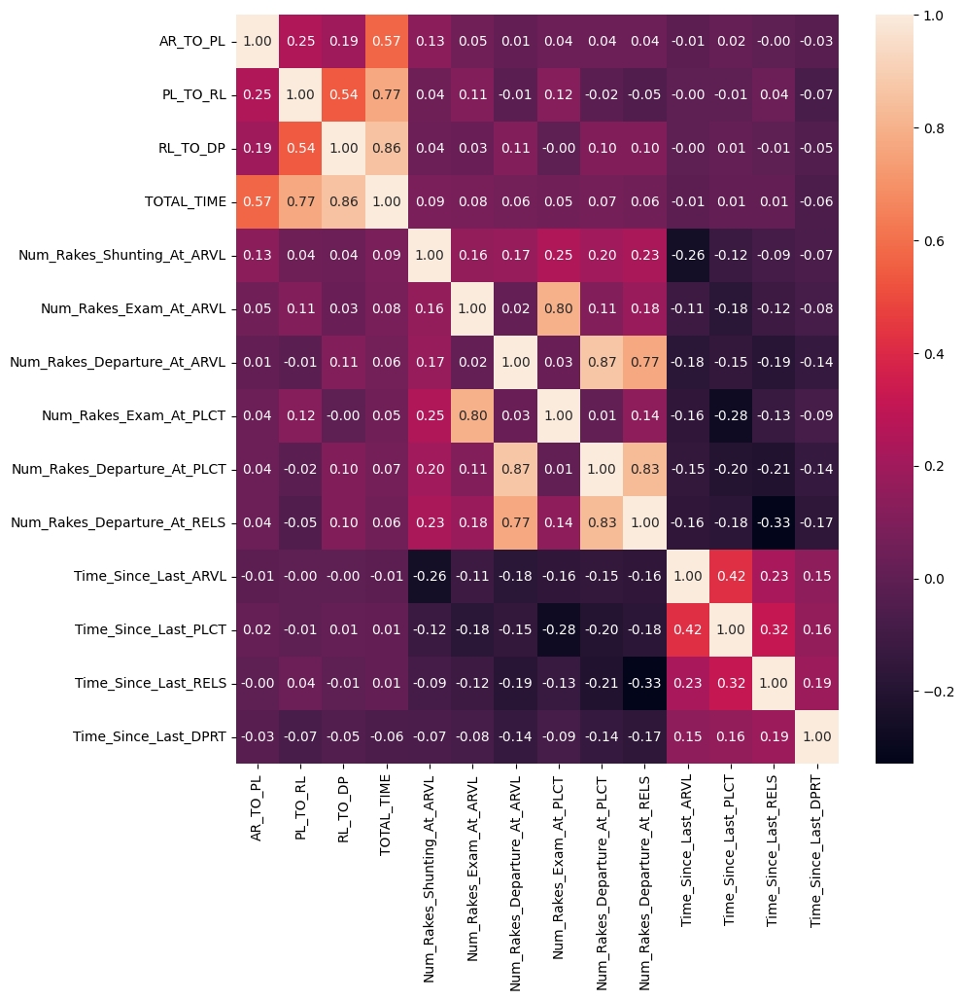

In [717]:
plt.figure(figsize=(10,10))
sns.heatmap(updated_corr, annot=True, fmt=".2f")
plt.show()

In [718]:
updated_corr_df1 = ddu_updated1.copy()

In [720]:
updated_corr_df1['R_DATEOFMONTH'] = updated_corr_df1['R_DATEOFMONTH'].dt.day
updated_corr_df1['R_MONTH'] = updated_corr_df1['R_MONTH'].str.split('-').str[1].astype('int64')
updated_corr_df1['R_WEEK'] = updated_corr_df1['R_WEEK'].str.split('-').str[1].astype('int64')

updated_corr1 = updated_corr_df1[['R_DATEOFMONTH','R_MONTH','R_WEEK','R_DAYOFWEEK','ARVL_H','PLCT_H','RELS_H','DPRT_H']].corr()

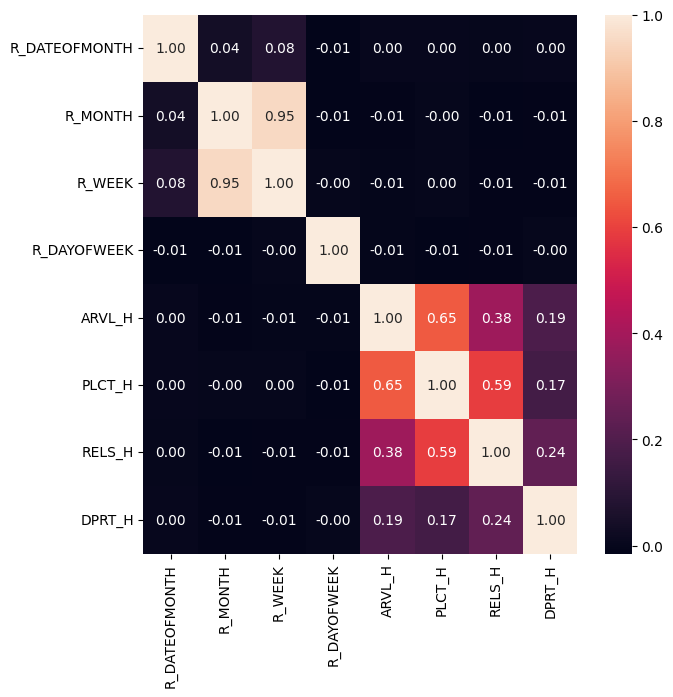

In [721]:
plt.figure(figsize=(7,7))
sns.heatmap(updated_corr1, annot=True, fmt=".2f")
plt.show()

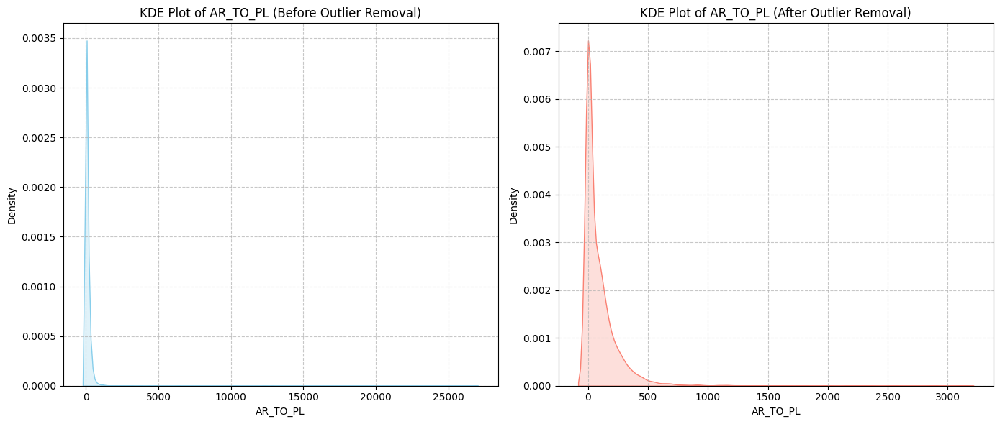

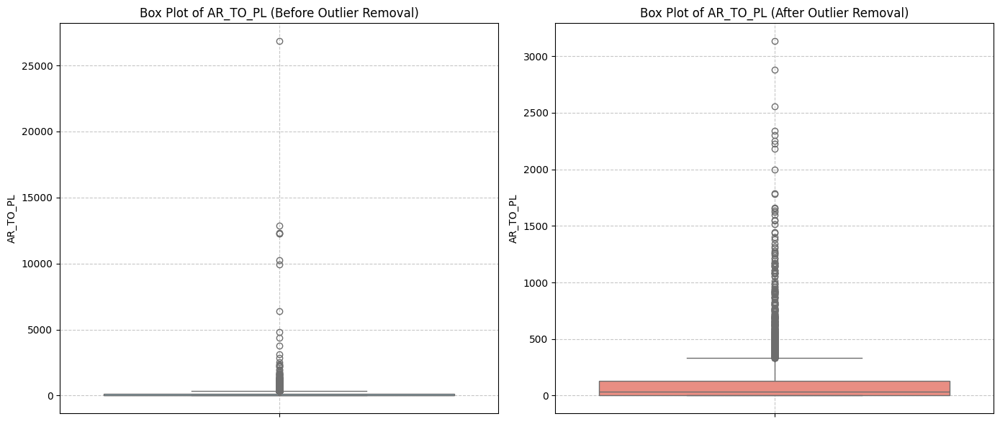

In [722]:
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.kdeplot(ddu['AR_TO_PL'], fill=True, color='skyblue')
plt.title('KDE Plot of AR_TO_PL (Before Outlier Removal)')
plt.xlabel('AR_TO_PL')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.kdeplot(ddu_updated1['AR_TO_PL'], fill=True, color='salmon')
plt.title('KDE Plot of AR_TO_PL (After Outlier Removal)')
plt.xlabel('AR_TO_PL')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()


plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.boxplot(y=ddu['AR_TO_PL'], color='skyblue')
plt.title('Box Plot of AR_TO_PL (Before Outlier Removal)')
plt.ylabel('AR_TO_PL')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.boxplot(y=ddu_updated1['AR_TO_PL'], color='salmon')
plt.title('Box Plot of AR_TO_PL (After Outlier Removal)')
plt.ylabel('AR_TO_PL')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout() 

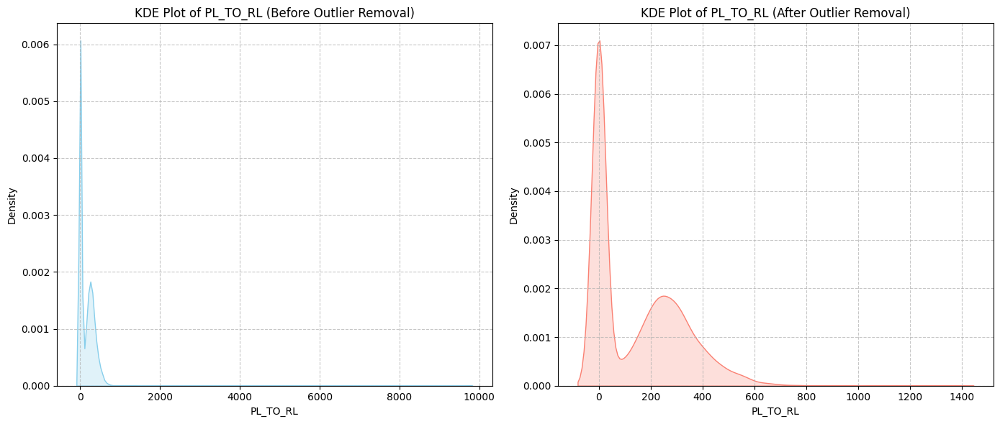

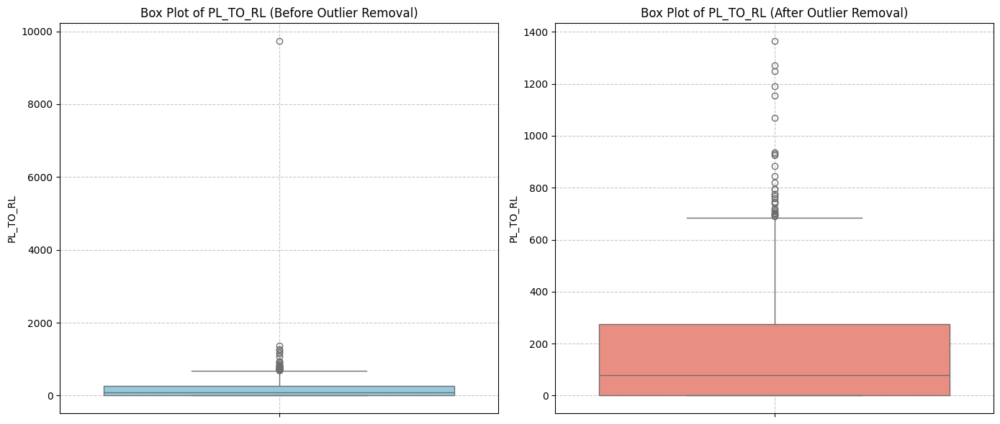

In [723]:
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.kdeplot(ddu['PL_TO_RL'], fill=True, color='skyblue')
plt.title('KDE Plot of PL_TO_RL (Before Outlier Removal)')
plt.xlabel('PL_TO_RL')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.kdeplot(ddu_updated1['PL_TO_RL'], fill=True, color='salmon')
plt.title('KDE Plot of PL_TO_RL (After Outlier Removal)')
plt.xlabel('PL_TO_RL')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()


plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.boxplot(y=ddu['PL_TO_RL'], color='skyblue')
plt.title('Box Plot of PL_TO_RL (Before Outlier Removal)')
plt.ylabel('PL_TO_RL')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.boxplot(y=ddu_updated1['PL_TO_RL'], color='salmon')
plt.title('Box Plot of PL_TO_RL (After Outlier Removal)')
plt.ylabel('PL_TO_RL')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout() 

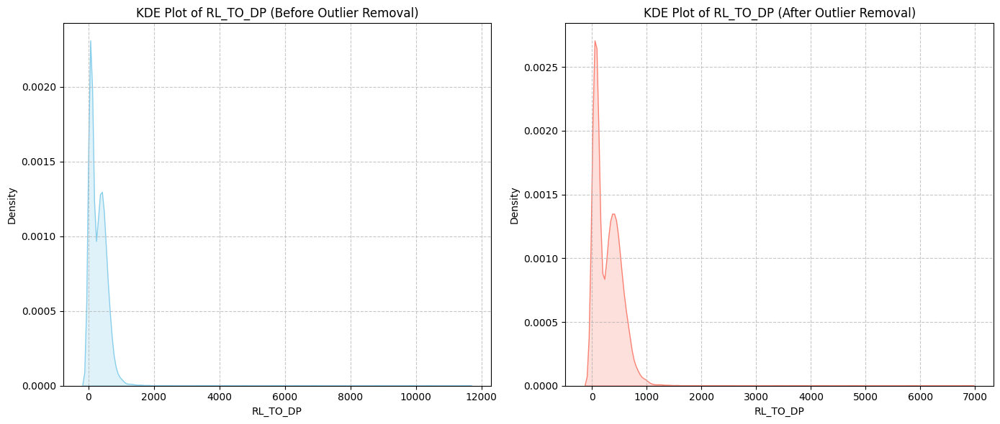

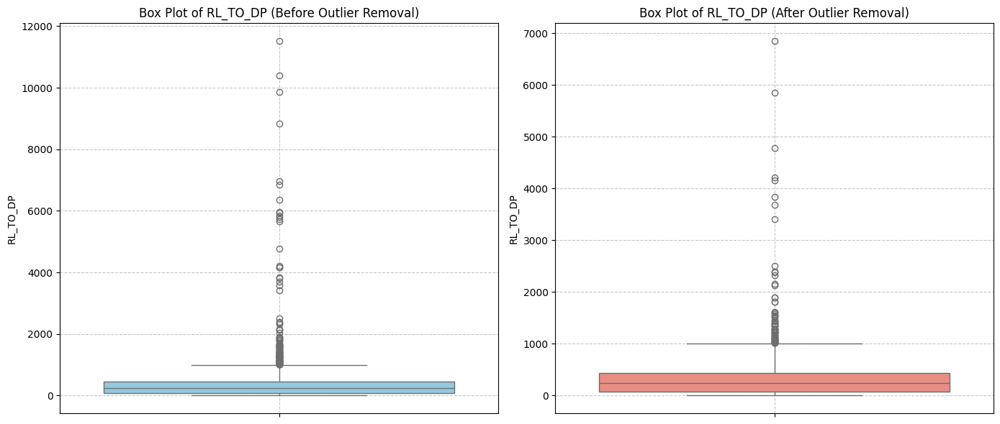

In [724]:
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.kdeplot(ddu['RL_TO_DP'], fill=True, color='skyblue')
plt.title('KDE Plot of RL_TO_DP (Before Outlier Removal)')
plt.xlabel('RL_TO_DP')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.kdeplot(ddu_updated1['RL_TO_DP'], fill=True, color='salmon')
plt.title('KDE Plot of RL_TO_DP (After Outlier Removal)')
plt.xlabel('RL_TO_DP')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()


plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.boxplot(y=ddu['RL_TO_DP'], color='skyblue')
plt.title('Box Plot of RL_TO_DP (Before Outlier Removal)')
plt.ylabel('RL_TO_DP')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.boxplot(y=ddu_updated1['RL_TO_DP'], color='salmon')
plt.title('Box Plot of RL_TO_DP (After Outlier Removal)')
plt.ylabel('RL_TO_DP')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout() 

### Implementing Cyclic features

In [730]:
ddu_updated2 = ddu_updated1.copy()

In [731]:
ddu_updated2.head()

,RDATE,RAKETYPE,EXAMSTTN,ZONE,AR_TO_PL,PL_TO_RL,RL_TO_DP,TOTAL_TIME,R_DATEOFMONTH,R_MONTH,...,Num_Rakes_Shunting_At_ARVL,Num_Rakes_Exam_At_ARVL,Num_Rakes_Departure_At_ARVL,Num_Rakes_Exam_At_PLCT,Num_Rakes_Departure_At_PLCT,Num_Rakes_Departure_At_RELS,Time_Since_Last_ARVL,Time_Since_Last_PLCT,Time_Since_Last_RELS,Time_Since_Last_DPRT
0,2024-04-01,BOXN,DDU,EC,561,229,345,1135,2024-04-01,2024-04,...,0,0,0,1,0,1,0.0,56.0,55.0,0.0
1,2024-04-02,BOXNHL,DDU,EC,2180,295,260,2735,2024-04-02,2024-04,...,1,0,0,3,5,4,45.0,40.0,135.0,29.0
2,2024-04-01,BOXN,DDU,EC,545,355,252,1152,2024-04-01,2024-04,...,2,0,0,4,3,3,330.0,50.0,40.0,2.0
3,2024-04-01,BOXN,DDU,EC,213,309,295,817,2024-04-01,2024-04,...,3,0,0,3,0,5,63.0,86.0,0.0,0.0
4,2024-04-01,BOXNHL,DDU,EC,60,230,400,690,2024-04-01,2024-04,...,4,0,0,0,0,0,7.0,0.0,0.0,120.0


In [732]:
ddu_updated2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9464 entries, 0 to 9552
Data columns (total 26 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   RDATE                        9464 non-null   object        
 1   RAKETYPE                     9464 non-null   object        
 2   EXAMSTTN                     9464 non-null   object        
 3   ZONE                         9464 non-null   object        
 4   AR_TO_PL                     9464 non-null   int64         
 5   PL_TO_RL                     9464 non-null   int64         
 6   RL_TO_DP                     9464 non-null   int64         
 7   TOTAL_TIME                   9464 non-null   int64         
 8   R_DATEOFMONTH                9464 non-null   datetime64[ns]
 9   R_MONTH                      9464 non-null   object        
 10  R_DAYOFWEEK                  9464 non-null   int64         
 11  R_WEEK                       9464 non-null   obj

In [733]:
ddu_updated2['R_MONTH'] = ddu_updated2['R_MONTH'].str.split('-').str[1].astype('int64')
ddu_updated2['R_DATEOFMONTH'] = ddu_updated2['R_DATEOFMONTH'].dt.day
ddu_updated2['R_WEEK'] = ddu_updated2['R_WEEK'].str.split('-').str[1].astype('int64')


ddu_updated2['R_MONTH_sin'] = np.sin(2 * np.pi * ddu_updated2['R_MONTH'] / 12)
ddu_updated2['R_MONTH_cos'] = np.cos(2 * np.pi * ddu_updated2['R_MONTH'] / 12)

ddu_updated2['R_DAYOFWEEK_sin'] = np.sin(2 * np.pi * ddu_updated2['R_DAYOFWEEK'] / 7)
ddu_updated2['R_DAYOFWEEK_cos'] = np.cos(2 * np.pi * ddu_updated2['R_DAYOFWEEK'] / 7)

ddu_updated2['R_WEEK_sin'] = np.sin(2 * np.pi * ddu_updated2['R_WEEK'] / 52)
ddu_updated2['R_WEEK_cos'] = np.cos(2 * np.pi * ddu_updated2['R_WEEK'] / 52)

ddu_updated2['ARVL_H_sin'] = np.sin(2 * np.pi * ddu_updated2['ARVL_H'] / 24)
ddu_updated2['ARVL_H_cos'] = np.cos(2 * np.pi * ddu_updated2['ARVL_H'] / 24)


ddu_updated2.drop(columns=['R_MONTH', 'R_DAYOFWEEK', 'R_WEEK', 'ARVL_H', 'PLCT_H', 'RELS_H', 'DPRT_H'], axis=1, inplace=True)

ddu_updated2.head()

,RDATE,RAKETYPE,EXAMSTTN,ZONE,AR_TO_PL,PL_TO_RL,RL_TO_DP,TOTAL_TIME,R_DATEOFMONTH,Num_Rakes_Shunting_At_ARVL,...,Time_Since_Last_RELS,Time_Since_Last_DPRT,R_MONTH_sin,R_MONTH_cos,R_DAYOFWEEK_sin,R_DAYOFWEEK_cos,R_WEEK_sin,R_WEEK_cos,ARVL_H_sin,ARVL_H_cos
0,2024-04-01,BOXN,DDU,EC,561,229,345,1135,1,0,...,55.0,0.0,0.866025,-0.5,0.000000,1.00000,0.992709,-0.120537,0.866025,-0.500000
1,2024-04-02,BOXNHL,DDU,EC,2180,295,260,2735,2,1,...,135.0,29.0,0.866025,-0.5,0.781831,0.62349,0.992709,-0.120537,0.707107,-0.707107
2,2024-04-01,BOXN,DDU,EC,545,355,252,1152,1,2,...,40.0,2.0,0.866025,-0.5,0.000000,1.00000,0.992709,-0.120537,-0.500000,-0.866025
3,2024-04-01,BOXN,DDU,EC,213,309,295,817,1,3,...,0.0,0.0,0.866025,-0.5,0.000000,1.00000,0.992709,-0.120537,-0.707107,-0.707107
4,2024-04-01,BOXNHL,DDU,EC,60,230,400,690,1,4,...,0.0,120.0,0.866025,-0.5,0.000000,1.00000,0.992709,-0.120537,-0.707107,-0.707107


### One Hot Encoding

In [734]:
from sklearn.preprocessing import OneHotEncoder

In [735]:
categorical_cols = ['RAKETYPE']

In [736]:
encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)
encoded_features = encoder.fit_transform(ddu_updated2[categorical_cols])

In [737]:
encoded_col_names = encoder.get_feature_names_out(categorical_cols)
encoded_df = pd.DataFrame(encoded_features, columns=encoded_col_names, index=ddu_updated2.index)

In [738]:
ddu_updated3 = pd.concat([ddu_updated2, encoded_df], axis=1)
ddu_updated3 = ddu_updated3.drop(columns=categorical_cols)

In [739]:
ddu_updated3.drop(columns=['RDATE', 'EXAMSTTN','ZONE','TOTAL_TIME'], axis=1, inplace=True)

In [740]:
ddu_updated3

,AR_TO_PL,PL_TO_RL,RL_TO_DP,R_DATEOFMONTH,Num_Rakes_Shunting_At_ARVL,Num_Rakes_Exam_At_ARVL,Num_Rakes_Departure_At_ARVL,Num_Rakes_Exam_At_PLCT,Num_Rakes_Departure_At_PLCT,Num_Rakes_Departure_At_RELS,...,R_DAYOFWEEK_cos,R_WEEK_sin,R_WEEK_cos,ARVL_H_sin,ARVL_H_cos,RAKETYPE_BOXN,RAKETYPE_BOXNEL,RAKETYPE_BOXNHL,RAKETYPE_BOXNHL25T,RAKETYPE_SHRN
0,561,229,345,1,0,0,0,1,0,1,...,1.00000,0.992709,-0.120537,0.866025,-0.500000,1.0,0.0,0.0,0.0,0.0
1,2180,295,260,2,1,0,0,3,5,4,...,0.62349,0.992709,-0.120537,0.707107,-0.707107,0.0,0.0,1.0,0.0,0.0
2,545,355,252,1,2,0,0,4,3,3,...,1.00000,0.992709,-0.120537,-0.500000,-0.866025,1.0,0.0,0.0,0.0,0.0
3,213,309,295,1,3,0,0,3,0,5,...,1.00000,0.992709,-0.120537,-0.707107,-0.707107,1.0,0.0,0.0,0.0,0.0
4,60,230,400,1,4,0,0,0,0,0,...,1.00000,0.992709,-0.120537,-0.707107,-0.707107,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9548,0,0,105,31,2,0,2,0,2,2,...,1.00000,0.992709,-0.120537,-0.707107,-0.707107,1.0,0.0,0.0,0.0,0.0
9549,0,0,118,31,0,2,2,2,2,2,...,1.00000,0.992709,-0.120537,-0.965926,-0.258819,0.0,0.0,1.0,0.0,0.0
9550,0,0,105,31,0,2,2,2,2,2,...,1.00000,0.992709,-0.120537,-0.965926,-0.258819,1.0,0.0,0.0,0.0,0.0
9551,0,0,101,31,0,1,1,1,1,1,...,1.00000,0.992709,-0.120537,-0.965926,0.258819,0.0,0.0,1.0,0.0,0.0


In [741]:
ddu_updated3.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9464 entries, 0 to 9552
Data columns (total 27 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   AR_TO_PL                     9464 non-null   int64  
 1   PL_TO_RL                     9464 non-null   int64  
 2   RL_TO_DP                     9464 non-null   int64  
 3   R_DATEOFMONTH                9464 non-null   int32  
 4   Num_Rakes_Shunting_At_ARVL   9464 non-null   int64  
 5   Num_Rakes_Exam_At_ARVL       9464 non-null   int64  
 6   Num_Rakes_Departure_At_ARVL  9464 non-null   int64  
 7   Num_Rakes_Exam_At_PLCT       9464 non-null   int64  
 8   Num_Rakes_Departure_At_PLCT  9464 non-null   int64  
 9   Num_Rakes_Departure_At_RELS  9464 non-null   int64  
 10  Time_Since_Last_ARVL         9464 non-null   float64
 11  Time_Since_Last_PLCT         9464 non-null   float64
 12  Time_Since_Last_RELS         9464 non-null   float64
 13  Time_Since_Last_DPRT   

### Each time frame count analysis

In [742]:
shunting_time_count = ddu_updated3['AR_TO_PL'].value_counts().reset_index()
shunting_time_count.columns = ['AR_TO_PL','RAKE_COUNT']

shunting_time_count = shunting_time_count.sort_values(by='AR_TO_PL').reset_index(drop=True)
shunting_time_count.head(30)

,AR_TO_PL,RAKE_COUNT
0,0,3892
1,1,67
2,2,66
3,3,49
4,4,29
5,5,189
6,6,17
7,7,12
8,8,15
9,9,4


In [743]:
exam_time_count = ddu_updated3['PL_TO_RL'].value_counts().reset_index()
exam_time_count.columns = ['PL_TO_RL','RAKE_COUNT']

exam_time_count = exam_time_count.sort_values(by='PL_TO_RL').reset_index(drop=True)
exam_time_count.head(30)

,PL_TO_RL,RAKE_COUNT
0,0,4490
1,1,14
2,2,1
3,4,1
4,5,32
5,6,1
6,10,10
7,15,6
8,19,1
9,20,7


In [744]:
departure_time_count = ddu_updated3['RL_TO_DP'].value_counts().reset_index()
departure_time_count.columns = ['RL_TO_DP','RAKE_COUNT']

departure_time_count = departure_time_count.sort_values(by='RL_TO_DP').reset_index(drop=True)
departure_time_count.head(30)

,RL_TO_DP,RAKE_COUNT
0,0,306
1,1,91
2,2,24
3,3,19
4,4,12
5,5,121
6,6,10
7,7,4
8,8,10
9,9,12


# Model Selections Part - single stage (old)

### Preparing columns

In [745]:
ddu_final = ddu_updated3.copy()

In [747]:
ddu_final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9464 entries, 0 to 9552
Data columns (total 27 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   AR_TO_PL                     9464 non-null   int64  
 1   PL_TO_RL                     9464 non-null   int64  
 2   RL_TO_DP                     9464 non-null   int64  
 3   R_DATEOFMONTH                9464 non-null   int32  
 4   Num_Rakes_Shunting_At_ARVL   9464 non-null   int64  
 5   Num_Rakes_Exam_At_ARVL       9464 non-null   int64  
 6   Num_Rakes_Departure_At_ARVL  9464 non-null   int64  
 7   Num_Rakes_Exam_At_PLCT       9464 non-null   int64  
 8   Num_Rakes_Departure_At_PLCT  9464 non-null   int64  
 9   Num_Rakes_Departure_At_RELS  9464 non-null   int64  
 10  Time_Since_Last_ARVL         9464 non-null   float64
 11  Time_Since_Last_PLCT         9464 non-null   float64
 12  Time_Since_Last_RELS         9464 non-null   float64
 13  Time_Since_Last_DPRT   

In [749]:
target_cols = ['AR_TO_PL', 'PL_TO_RL', 'RL_TO_DP']

base_features = [col for col in ddu_final.columns if col not in target_cols]

X = ddu_final[base_features]
y = ddu_final[target_cols]

In [750]:
base_features

['R_DATEOFMONTH',
 'Num_Rakes_Shunting_At_ARVL',
 'Num_Rakes_Exam_At_ARVL',
 'Num_Rakes_Departure_At_ARVL',
 'Num_Rakes_Exam_At_PLCT',
 'Num_Rakes_Departure_At_PLCT',
 'Num_Rakes_Departure_At_RELS',
 'Time_Since_Last_ARVL',
 'Time_Since_Last_PLCT',
 'Time_Since_Last_RELS',
 'Time_Since_Last_DPRT',
 'R_MONTH_sin',
 'R_MONTH_cos',
 'R_DAYOFWEEK_sin',
 'R_DAYOFWEEK_cos',
 'R_WEEK_sin',
 'R_WEEK_cos',
 'ARVL_H_sin',
 'ARVL_H_cos',
 'RAKETYPE_BOXN',
 'RAKETYPE_BOXNEL',
 'RAKETYPE_BOXNHL',
 'RAKETYPE_BOXNHL25T',
 'RAKETYPE_SHRN']

In [751]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [752]:
from sklearn.metrics import mean_absolute_error, root_mean_squared_error, r2_score

In [753]:
def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    non_zero_indices = y_true != 0

    if not np.any(non_zero_indices):
        return np.nan

    return np.mean(np.abs((y_true[non_zero_indices] - y_pred[non_zero_indices]) / y_true[non_zero_indices])) * 100


In [754]:
models = {}
scalers = {}

## RandomForest Regressor

In [755]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import Pipeline

In [756]:
rfr_predictions = {}
rfr_metrics = {}

In [ ]:
for target in target_cols:
    print(f"RandomForestRegressor model for target: {target}")
    rfr_model = Pipeline(steps=[('regressor', RandomForestRegressor(n_estimators=300, max_depth=15, min_samples_leaf=3, random_state=42, n_jobs=-1))])
    rfr_model.fit(X_train, y_train[target])
    models[f'RFR_{target}'] = rfr_model

    y_pred = rfr_model.predict(X_test)
    rfr_predictions[target] = y_pred

    mae = mean_absolute_error(y_test[target], y_pred)
    mape = mean_absolute_percentage_error(y_test[target], y_pred)
    rmse = root_mean_squared_error(y_test[target], y_pred)
    r2 = r2_score(y_test[target], y_pred)

    rfr_metrics[target] = {'MAE': mae, 'MAPE': mape, 'RMSE': rmse, 'R2': r2}

    print(f" Mean Absolute Error (MAE): {mae}")
    print(f" Mean Absolute Percentage Error (MAPE): {mape}")
    print(f" Root Mean Squared Error (RMSE): {rmse}")
    print(f" R-squared (R2): {r2}")

RandomForestRegressor model for target: AR_TO_PL
 Mean Absolute Error (MAE): 86.78454873285997
 Mean Absolute Percentage Error (MAPE): 276.62583011555375
 Root Mean Squared Error (RMSE): 166.43277520612344
 R-squared (R2): 0.1411643440272642
RandomForestRegressor model for target: PL_TO_RL
 Mean Absolute Error (MAE): 104.19972908441368
 Mean Absolute Percentage Error (MAPE): 112.60937173039294
 Root Mean Squared Error (RMSE): 131.5628918005193
 R-squared (R2): 0.3538632858406886
RandomForestRegressor model for target: RL_TO_DP
 Mean Absolute Error (MAE): 154.35802246766883
 Mean Absolute Percentage Error (MAPE): 426.1553455206641
 Root Mean Squared Error (RMSE): 225.4990111049373
 R-squared (R2): 0.2679920670134708


In [758]:
models

{'RFR_AR_TO_PL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_PL_TO_RL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_RL_TO_DP': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))])}

In [759]:
rfr_predictions

{'AR_TO_PL': array([ 69.18800682, 104.28629372,  31.91993405, ..., 146.80961159,
        138.48975381,  67.5330255 ], shape=(1893,)),
 'PL_TO_RL': array([164.25971481, 202.72521291,  30.26789543, ...,  75.37048352,
         62.88100567,  98.43125586], shape=(1893,)),
 'RL_TO_DP': array([325.30797272, 377.57452873, 139.57168453, ..., 164.29495778,
        243.64336554, 163.43969938], shape=(1893,))}

In [760]:
rfr_metrics

{'AR_TO_PL': {'MAE': 86.78454873285997,
  'MAPE': np.float64(276.62583011555375),
  'RMSE': 166.43277520612344,
  'R2': 0.1411643440272642},
 'PL_TO_RL': {'MAE': 104.19972908441368,
  'MAPE': np.float64(112.60937173039294),
  'RMSE': 131.5628918005193,
  'R2': 0.3538632858406886},
 'RL_TO_DP': {'MAE': 154.35802246766883,
  'MAPE': np.float64(426.1553455206641),
  'RMSE': 225.4990111049373,
  'R2': 0.2679920670134708}}

## SupportVector Regressor

In [761]:
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler

In [762]:
svr_metrics = {}

Training SVR for target: AR_TO_PL
Evaluation for AR_TO_PL (SVR):
 Mean Absolute Error (MAE): 72.31926664611949
 Mean Absolute Percentage Error (MAPE): 351.09750026279806
 Root Mean Squared Error (RMSE): 164.0263347224147
 R-squared (R2): 0.16582049102555596


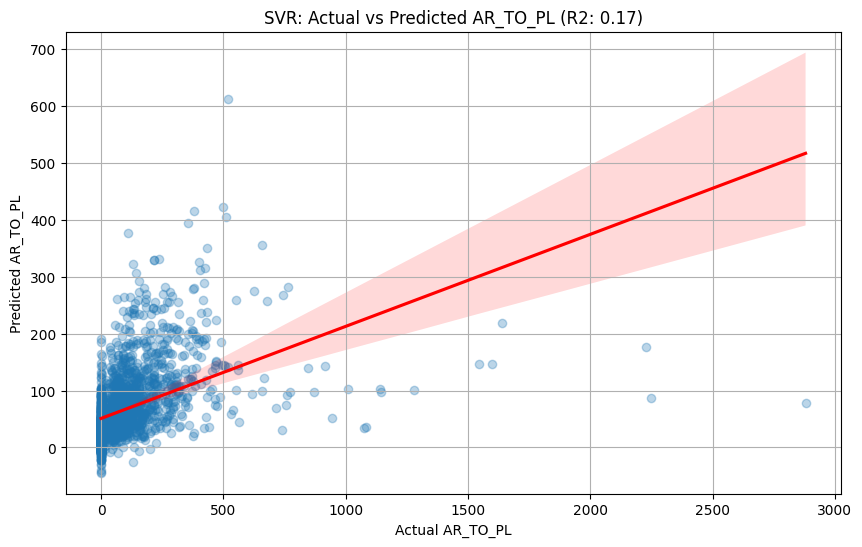

Training SVR for target: PL_TO_RL
Evaluation for PL_TO_RL (SVR):
 Mean Absolute Error (MAE): 107.78794904552174
 Mean Absolute Percentage Error (MAPE): 143.2668608137555
 Root Mean Squared Error (RMSE): 144.85033291548075
 R-squared (R2): 0.21675687326557624


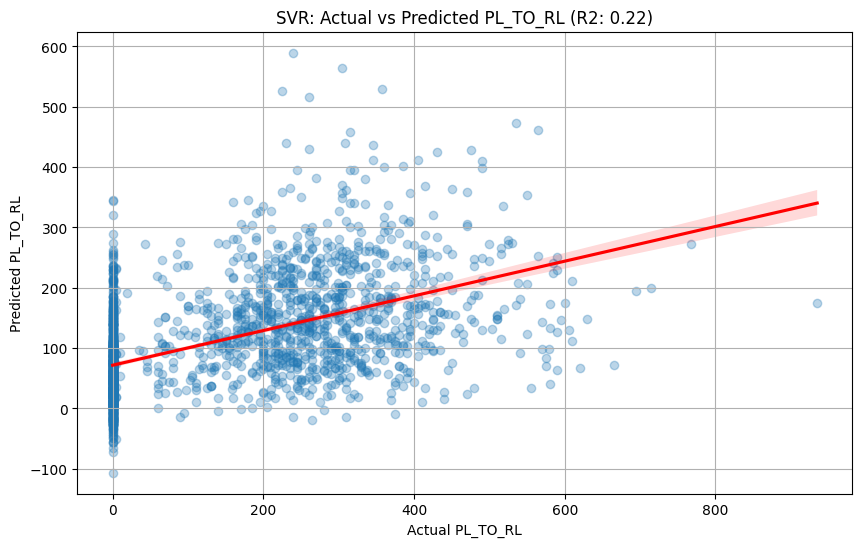

Training SVR for target: RL_TO_DP
Evaluation for RL_TO_DP (SVR):
 Mean Absolute Error (MAE): 169.91862385028483
 Mean Absolute Percentage Error (MAPE): 535.2291456833337
 Root Mean Squared Error (RMSE): 246.20431998020146
 R-squared (R2): 0.12739470862479196


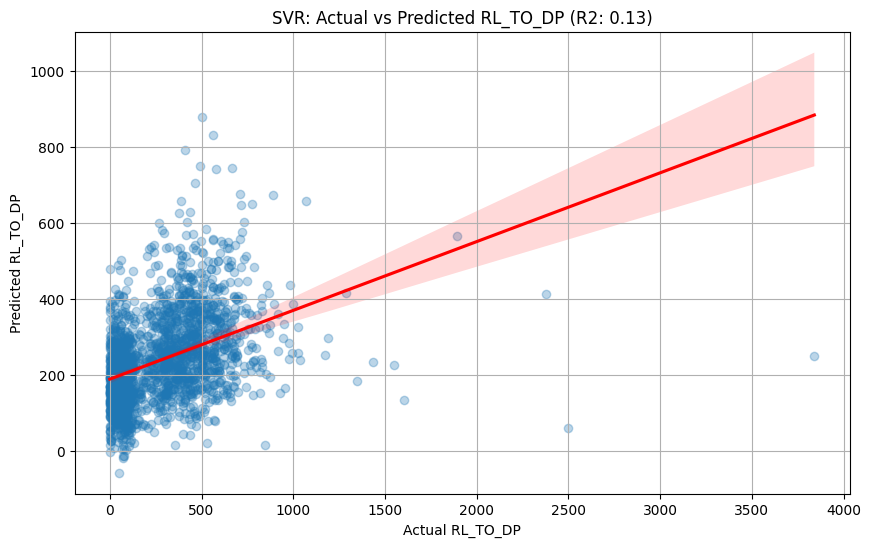

In [768]:
for target in target_cols:
    print(f"Training SVR for target: {target}")

    scaler_X = StandardScaler()
    scaler_y = StandardScaler()

    X_train_scaled = scaler_X.fit_transform(X_train)
    y_train_scaled = scaler_y.fit_transform(y_train[[target]])

    X_test_scaled = scaler_X.transform(X_test)

    svr_model = SVR(kernel='rbf', C=1.0, epsilon=0.1, gamma='scale')

    svr_model.fit(X_train_scaled, y_train_scaled.ravel())

    models[f'SVR_{target}'] = svr_model
    scalers[f'SVR_X_scaler_{target}'] = scaler_X
    scalers[f'SVR_y_scaler_{target}'] = scaler_y

    y_pred_scaled = svr_model.predict(X_test_scaled)

    y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1))

    mae = mean_absolute_error(y_test[target], y_pred)
    mape = mean_absolute_percentage_error(y_test[target], y_pred)
    rmse = root_mean_squared_error(y_test[target], y_pred)
    r2 = r2_score(y_test[target], y_pred)

    svr_metrics[target] = {'MAE': mae, 'MAPE': mape, 'RMSE': rmse, 'R2': r2}

    print(f"Evaluation for {target} (SVR):")
    print(f" Mean Absolute Error (MAE): {mae}")
    print(f" Mean Absolute Percentage Error (MAPE): {mape}")
    print(f" Root Mean Squared Error (RMSE): {rmse}")
    print(f" R-squared (R2): {r2}")

    plt.figure(figsize=(10, 6))
    sns.regplot(x=y_test[target], y=y_pred.flatten(), scatter_kws={'alpha':0.3}, line_kws={'color':'red'})
    plt.xlabel(f'Actual {target}')
    plt.ylabel(f'Predicted {target}')
    plt.title(f'SVR: Actual vs Predicted {target} (R2: {r2:.2f})')
    plt.grid(True)
    plt.show()


In [769]:
models

{'RFR_AR_TO_PL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_PL_TO_RL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_RL_TO_DP': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'SVR_AR_TO_PL': SVR(),
 'SVR_PL_TO_RL': SVR(),
 'SVR_RL_TO_DP': SVR()}

In [770]:
scalers

{'SVR_X_scaler_AR_TO_PL': StandardScaler(),
 'SVR_y_scaler_AR_TO_PL': StandardScaler(),
 'SVR_X_scaler_PL_TO_RL': StandardScaler(),
 'SVR_y_scaler_PL_TO_RL': StandardScaler(),
 'SVR_X_scaler_RL_TO_DP': StandardScaler(),
 'SVR_y_scaler_RL_TO_DP': StandardScaler()}

In [771]:
svr_metrics

{'AR_TO_PL': {'MAE': 72.31926664611949,
  'MAPE': np.float64(351.09750026279806),
  'RMSE': 164.0263347224147,
  'R2': 0.16582049102555596},
 'PL_TO_RL': {'MAE': 107.78794904552174,
  'MAPE': np.float64(143.2668608137555),
  'RMSE': 144.85033291548075,
  'R2': 0.21675687326557624},
 'RL_TO_DP': {'MAE': 169.91862385028483,
  'MAPE': np.float64(535.2291456833337),
  'RMSE': 246.20431998020146,
  'R2': 0.12739470862479196}}

## KNN

In [772]:
from sklearn.neighbors import KNeighborsRegressor

In [773]:
knn_metrics = {}

Training KNN for target: AR_TO_PL
Evaluation for AR_TO_PL (KNN):
 Mean Absolute Error (MAE): 91.1909225096844
 Mean Absolute Percentage Error (MAPE): 348.8412087468085
 Root Mean Squared Error (RMSE): 179.13930228869663
 R-squared (R2): 0.005020544433443241


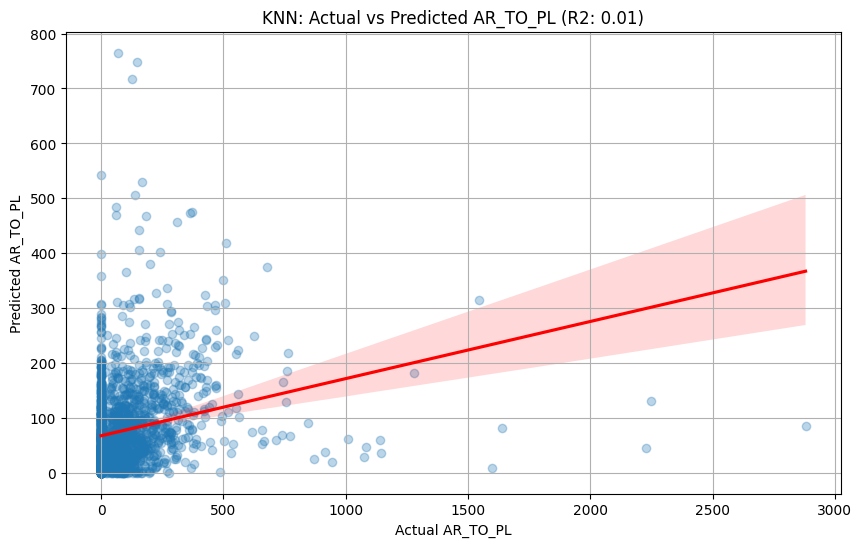

Training KNN for target: PL_TO_RL
Evaluation for PL_TO_RL (KNN):
 Mean Absolute Error (MAE): 130.87374747947345
 Mean Absolute Percentage Error (MAPE): 136.0213300726143
 Root Mean Squared Error (RMSE): 164.98303379298198
 R-squared (R2): -0.016099336590280178


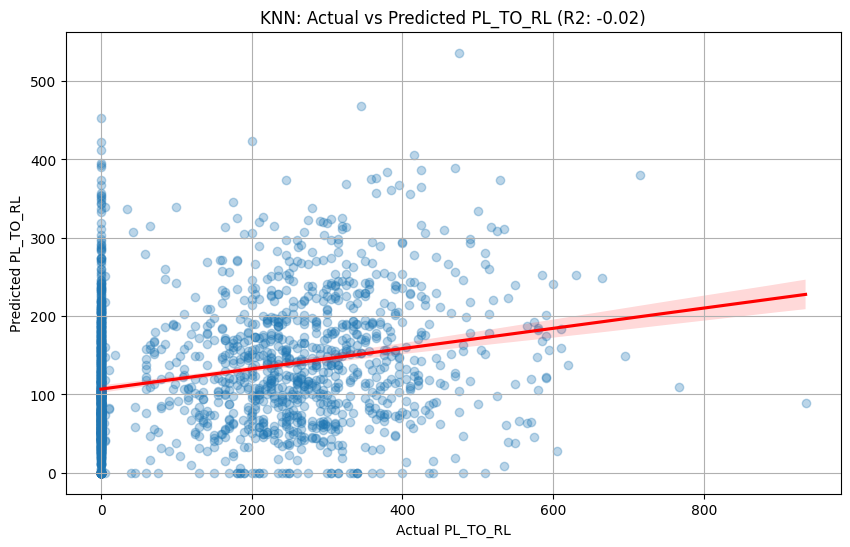

Training KNN for target: RL_TO_DP
Evaluation for RL_TO_DP (KNN):
 Mean Absolute Error (MAE): 193.6783107065312
 Mean Absolute Percentage Error (MAPE): 552.4384477055644
 Root Mean Squared Error (RMSE): 269.4691739816804
 R-squared (R2): -0.04530899243918518


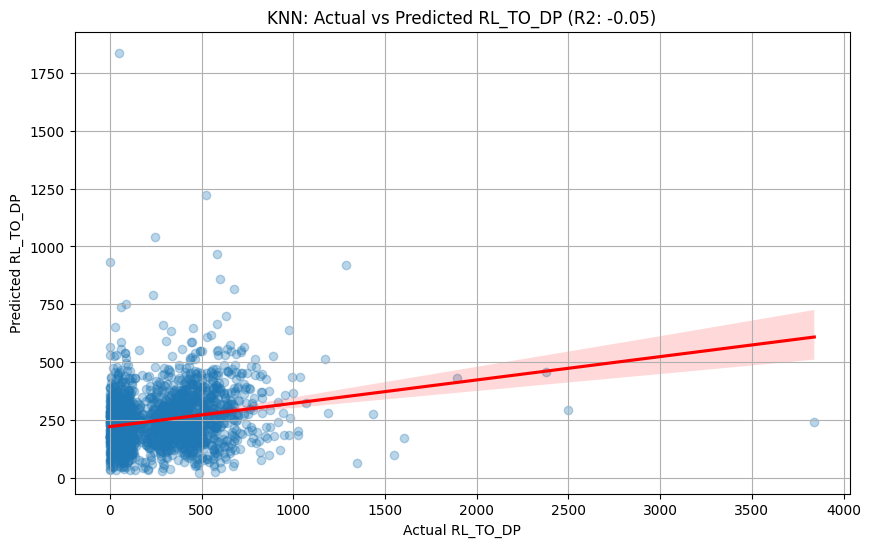

In [774]:
for target in target_cols:
    print(f"Training KNN for target: {target}")

    scaler_X = StandardScaler()
    scaler_y = StandardScaler()

    X_train_scaled = scaler_X.fit_transform(X_train)
    y_train_scaled = scaler_y.fit_transform(y_train[[target]])

    X_test_scaled = scaler_X.transform(X_test)

    knn_model = KNeighborsRegressor(n_neighbors=5, weights='distance', metric='euclidean')

    knn_model.fit(X_train_scaled, y_train_scaled.ravel())

    models[f'KNN_{target}'] = knn_model
    scalers[f'KNN_X_scaler_{target}'] = scaler_X
    scalers[f'KNN_y_scaler_{target}'] = scaler_y

    y_pred_scaled = knn_model.predict(X_test_scaled)

    y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1))

    mae = mean_absolute_error(y_test[target], y_pred)
    mape = mean_absolute_percentage_error(y_test[target], y_pred)
    rmse = root_mean_squared_error(y_test[target], y_pred)
    r2 = r2_score(y_test[target], y_pred)

    knn_metrics[target] = {'MAE': mae, 'MAPE': mape, 'RMSE': rmse, 'R2': r2}

    print(f"Evaluation for {target} (KNN):")
    print(f" Mean Absolute Error (MAE): {mae}")
    print(f" Mean Absolute Percentage Error (MAPE): {mape}")
    print(f" Root Mean Squared Error (RMSE): {rmse}")
    print(f" R-squared (R2): {r2}")

    plt.figure(figsize=(10, 6))
    sns.regplot(x=y_test[target], y=y_pred.flatten(), scatter_kws={'alpha':0.3}, line_kws={'color':'red'})
    plt.xlabel(f'Actual {target}')
    plt.ylabel(f'Predicted {target}')
    plt.title(f'KNN: Actual vs Predicted {target} (R2: {r2:.2f})')
    plt.grid(True)
    plt.show()
    

In [775]:
models

{'RFR_AR_TO_PL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_PL_TO_RL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_RL_TO_DP': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'SVR_AR_TO_PL': SVR(),
 'SVR_PL_TO_RL': SVR(),
 'SVR_RL_TO_DP': SVR(),
 'KNN_AR_TO_PL': KNeighborsRegressor(metric='euclidean', weights='distance'),
 'KNN_PL_TO_RL': KNeighborsRegressor(metric='euclidean', weights='distance'),
 'KNN_RL_TO_DP': KN

In [776]:
scalers

{'SVR_X_scaler_AR_TO_PL': StandardScaler(),
 'SVR_y_scaler_AR_TO_PL': StandardScaler(),
 'SVR_X_scaler_PL_TO_RL': StandardScaler(),
 'SVR_y_scaler_PL_TO_RL': StandardScaler(),
 'SVR_X_scaler_RL_TO_DP': StandardScaler(),
 'SVR_y_scaler_RL_TO_DP': StandardScaler(),
 'KNN_X_scaler_AR_TO_PL': StandardScaler(),
 'KNN_y_scaler_AR_TO_PL': StandardScaler(),
 'KNN_X_scaler_PL_TO_RL': StandardScaler(),
 'KNN_y_scaler_PL_TO_RL': StandardScaler(),
 'KNN_X_scaler_RL_TO_DP': StandardScaler(),
 'KNN_y_scaler_RL_TO_DP': StandardScaler()}

In [777]:
knn_metrics

{'AR_TO_PL': {'MAE': 91.1909225096844,
  'MAPE': np.float64(348.8412087468085),
  'RMSE': 179.13930228869663,
  'R2': 0.005020544433443241},
 'PL_TO_RL': {'MAE': 130.87374747947345,
  'MAPE': np.float64(136.0213300726143),
  'RMSE': 164.98303379298198,
  'R2': -0.016099336590280178},
 'RL_TO_DP': {'MAE': 193.6783107065312,
  'MAPE': np.float64(552.4384477055644),
  'RMSE': 269.4691739816804,
  'R2': -0.04530899243918518}}

## XGBoost Regressor

In [778]:
from xgboost import XGBRegressor

In [779]:
xgb_metrics = {}

Training XGBoost for target: AR_TO_PL
Evaluation for AR_TO_PL (XGBoost):
 Mean Absolute Error (MAE): 74.36227416992188
 Mean Absolute Percentage Error (MAPE): 240.99653200951906
 Root Mean Squared Error (RMSE): 155.6128387451172
 R-squared (R2): 0.24920183420181274


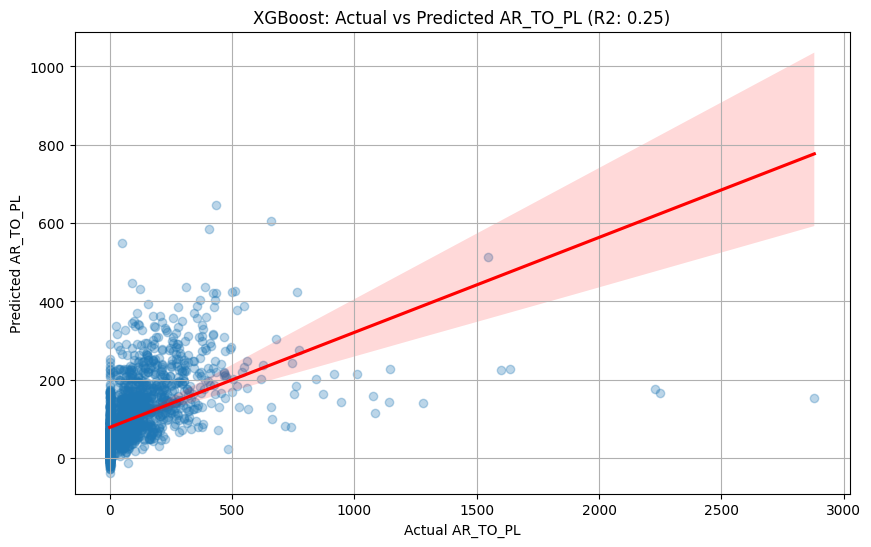

Training XGBoost for target: PL_TO_RL
Evaluation for PL_TO_RL (XGBoost):
 Mean Absolute Error (MAE): 86.3810043334961
 Mean Absolute Percentage Error (MAPE): 113.96430133172899
 Root Mean Squared Error (RMSE): 116.16143035888672
 R-squared (R2): 0.49628889560699463


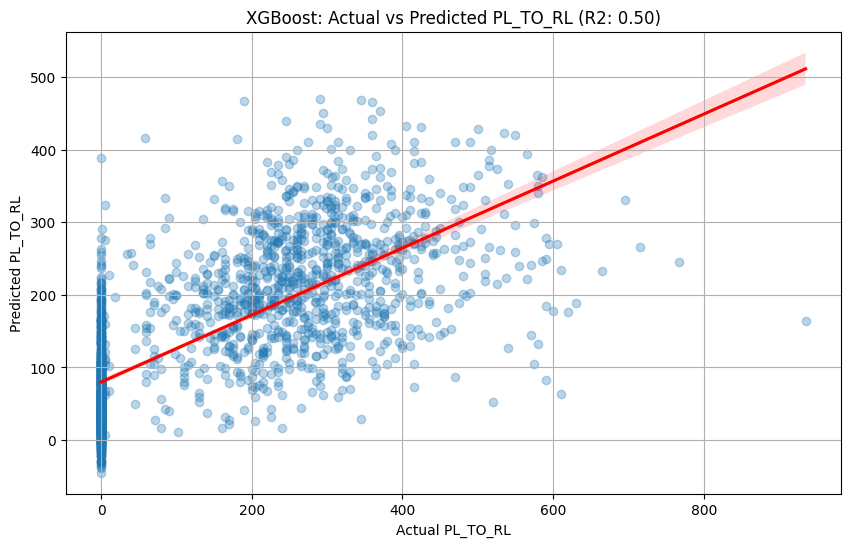

Training XGBoost for target: RL_TO_DP
Evaluation for RL_TO_DP (XGBoost):
 Mean Absolute Error (MAE): 143.08831787109375
 Mean Absolute Percentage Error (MAPE): 378.85949337611527
 Root Mean Squared Error (RMSE): 217.36642456054688
 R-squared (R2): 0.3198394775390625


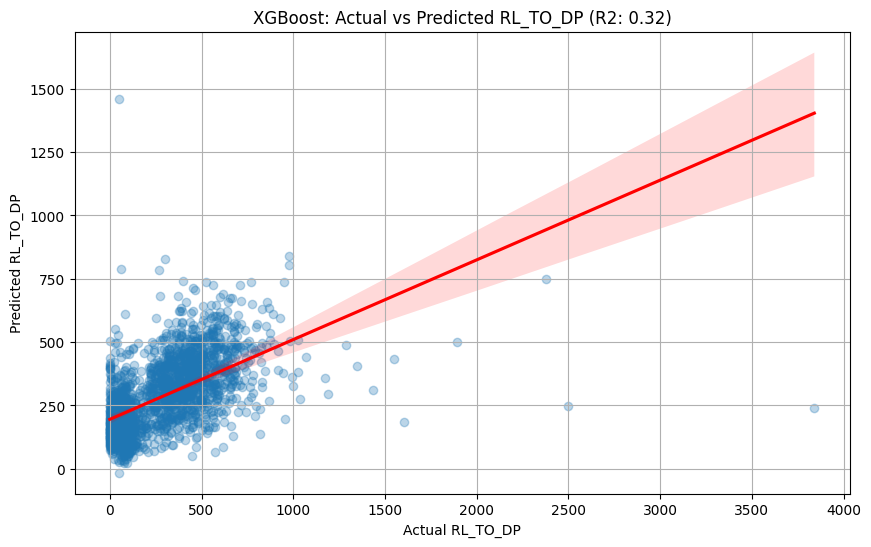

In [789]:
for target in target_cols:
    print(f"Training XGBoost for target: {target}")

    xgb_model = XGBRegressor(objective='reg:squarederror', n_estimators=250, max_depth=8, learning_rate=0.05, subsample=0.8, colsample_bytree=0.8, random_state=42, n_jobs=-1)

    xgb_model.fit(X_train, y_train[target])
    models[f'XGBoost_{target}'] = xgb_model

    y_pred = xgb_model.predict(X_test)

    mae = mean_absolute_error(y_test[target], y_pred)
    mape = mean_absolute_percentage_error(y_test[target], y_pred)
    rmse = root_mean_squared_error(y_test[target], y_pred)
    r2 = r2_score(y_test[target], y_pred)

    xgb_metrics[target] = {'MAE': mae, 'MAPE': mape, 'RMSE': rmse, 'R2': r2}

    print(f"Evaluation for {target} (XGBoost):")
    print(f" Mean Absolute Error (MAE): {mae}")
    print(f" Mean Absolute Percentage Error (MAPE): {mape}")
    print(f" Root Mean Squared Error (RMSE): {rmse}")
    print(f" R-squared (R2): {r2}")

    plt.figure(figsize=(10, 6))
    sns.regplot(x=y_test[target], y=y_pred, scatter_kws={'alpha':0.3}, line_kws={'color':'red'})
    plt.xlabel(f'Actual {target}')
    plt.ylabel(f'Predicted {target}')
    plt.title(f'XGBoost: Actual vs Predicted {target} (R2: {r2:.2f})')
    plt.grid(True)
    plt.show()


In [790]:
models

{'RFR_AR_TO_PL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_PL_TO_RL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_RL_TO_DP': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'SVR_AR_TO_PL': SVR(),
 'SVR_PL_TO_RL': SVR(),
 'SVR_RL_TO_DP': SVR(),
 'KNN_AR_TO_PL': KNeighborsRegressor(metric='euclidean', weights='distance'),
 'KNN_PL_TO_RL': KNeighborsRegressor(metric='euclidean', weights='distance'),
 'KNN_RL_TO_DP': KN

In [791]:
xgb_metrics

{'AR_TO_PL': {'MAE': 74.36227416992188,
  'MAPE': np.float64(240.99653200951906),
  'RMSE': 155.6128387451172,
  'R2': 0.24920183420181274},
 'PL_TO_RL': {'MAE': 86.3810043334961,
  'MAPE': np.float64(113.96430133172899),
  'RMSE': 116.16143035888672,
  'R2': 0.49628889560699463},
 'RL_TO_DP': {'MAE': 143.08831787109375,
  'MAPE': np.float64(378.85949337611527),
  'RMSE': 217.36642456054688,
  'R2': 0.3198394775390625}}

## LightGBM Regressor

In [783]:
from lightgbm import LGBMRegressor

In [784]:
lgbm_metrics = {}

Training LightGBM for target: AR_TO_PL
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000708 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1078
[LightGBM] [Info] Number of data points in the train set: 7571, number of used features: 22
[LightGBM] [Info] Start training from score 97.175274
Evaluation for AR_TO_PL (LightGBM):
 Mean Absolute Error (MAE): 78.58261060990517
 Mean Absolute Percentage Error (MAPE): 249.88116345028737
 Root Mean Squared Error (RMSE): 158.4121753653963
 R-squared (R2): 0.22194647892081376


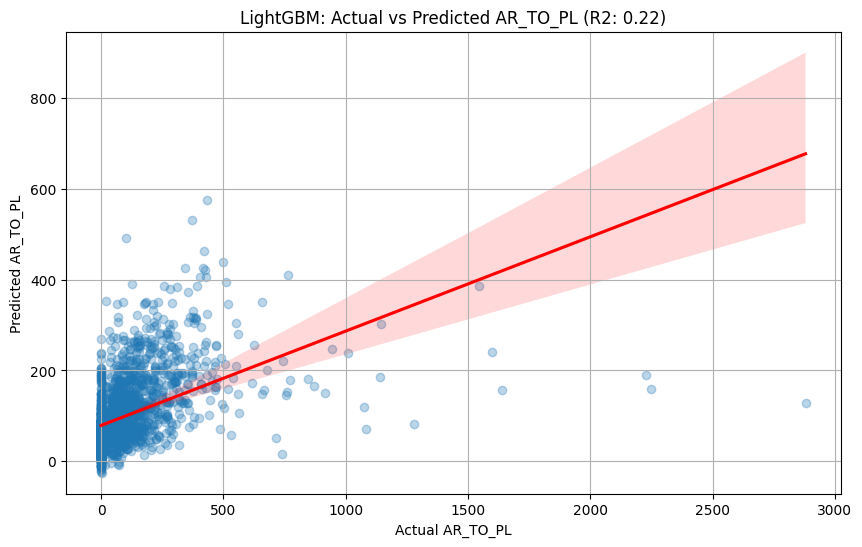

Training LightGBM for target: PL_TO_RL
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000942 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1078
[LightGBM] [Info] Number of data points in the train set: 7571, number of used features: 22
[LightGBM] [Info] Start training from score 146.948488
Evaluation for PL_TO_RL (LightGBM):
 Mean Absolute Error (MAE): 86.74424032673916
 Mean Absolute Percentage Error (MAPE): 110.12274410484876
 Root Mean Squared Error (RMSE): 116.36382187969078
 R-squared (R2): 0.49453213478374625


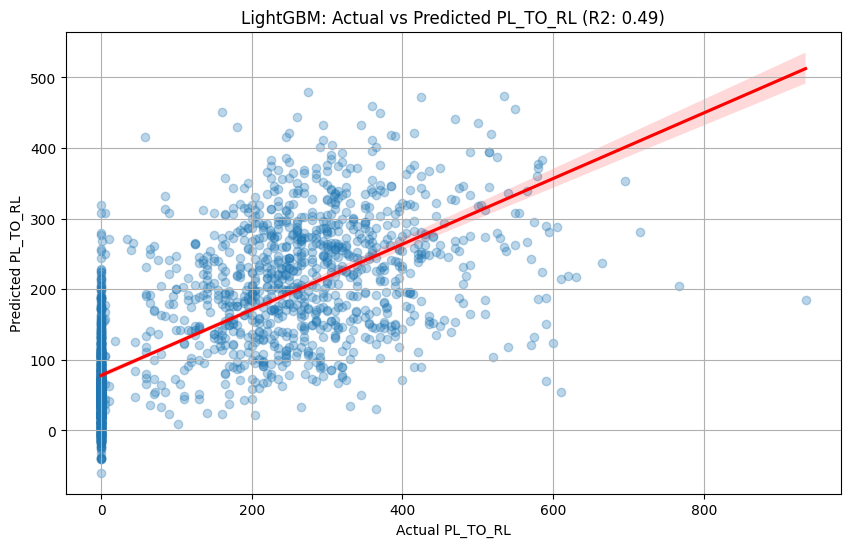

Training LightGBM for target: RL_TO_DP
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000583 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1078
[LightGBM] [Info] Number of data points in the train set: 7571, number of used features: 22
[LightGBM] [Info] Start training from score 281.242504
Evaluation for RL_TO_DP (LightGBM):
 Mean Absolute Error (MAE): 148.54807143463412
 Mean Absolute Percentage Error (MAPE): 393.0977597805833
 Root Mean Squared Error (RMSE): 220.300868110827
 R-squared (R2): 0.3013511937251341


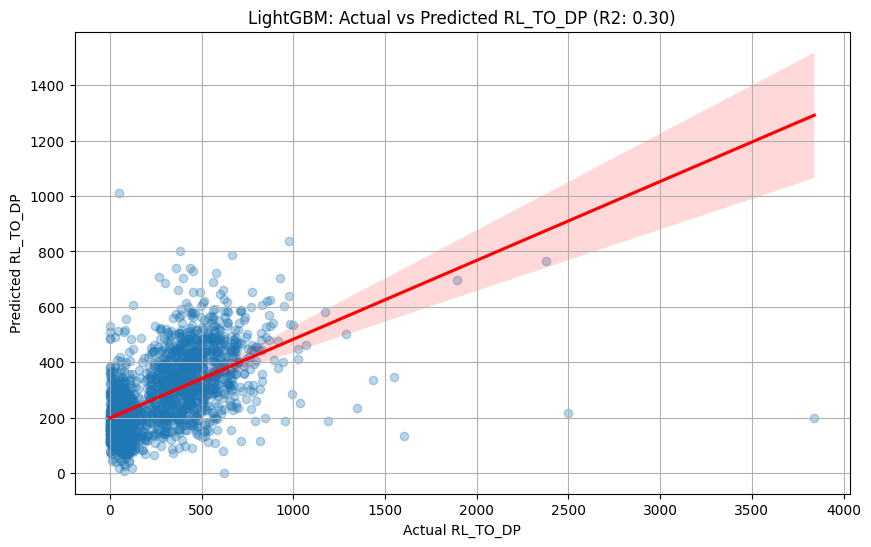

In [785]:
for target in target_cols:
    print(f"Training LightGBM for target: {target}")

    lgbm_model = LGBMRegressor(objective='regression', n_estimators=100, learning_rate=0.1, random_state=42, n_jobs=-1)

    lgbm_model.fit(X_train, y_train[target])
    models[f'LightGBM_{target}'] = lgbm_model

    y_pred = lgbm_model.predict(X_test)

    mae = mean_absolute_error(y_test[target], y_pred)
    mape = mean_absolute_percentage_error(y_test[target], y_pred)
    rmse = root_mean_squared_error(y_test[target], y_pred)
    r2 = r2_score(y_test[target], y_pred)

    lgbm_metrics[target] = {'MAE': mae, 'MAPE': mape, 'RMSE': rmse, 'R2': r2}

    print(f"Evaluation for {target} (LightGBM):")
    print(f" Mean Absolute Error (MAE): {mae}")
    print(f" Mean Absolute Percentage Error (MAPE): {mape}")
    print(f" Root Mean Squared Error (RMSE): {rmse}")
    print(f" R-squared (R2): {r2}")

    plt.figure(figsize=(10, 6))
    sns.regplot(x=y_test[target], y=y_pred, scatter_kws={'alpha':0.3}, line_kws={'color':'red'})
    plt.xlabel(f'Actual {target}')
    plt.ylabel(f'Predicted {target}')
    plt.title(f'LightGBM: Actual vs Predicted {target} (R2: {r2:.2f})')
    plt.grid(True)
    plt.show()
    

In [786]:
models

{'RFR_AR_TO_PL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_PL_TO_RL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_RL_TO_DP': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'SVR_AR_TO_PL': SVR(),
 'SVR_PL_TO_RL': SVR(),
 'SVR_RL_TO_DP': SVR(),
 'KNN_AR_TO_PL': KNeighborsRegressor(metric='euclidean', weights='distance'),
 'KNN_PL_TO_RL': KNeighborsRegressor(metric='euclidean', weights='distance'),
 'KNN_RL_TO_DP': KN

In [787]:
lgbm_metrics

{'AR_TO_PL': {'MAE': 78.58261060990517,
  'MAPE': np.float64(249.88116345028737),
  'RMSE': 158.4121753653963,
  'R2': 0.22194647892081376},
 'PL_TO_RL': {'MAE': 86.74424032673916,
  'MAPE': np.float64(110.12274410484876),
  'RMSE': 116.36382187969078,
  'R2': 0.49453213478374625},
 'RL_TO_DP': {'MAE': 148.54807143463412,
  'MAPE': np.float64(393.0977597805833),
  'RMSE': 220.300868110827,
  'R2': 0.3013511937251341}}

## Overall Performance metrics

In [792]:
metrics = {}
metrics['rfr'] = rfr_metrics
metrics['svr'] = svr_metrics
metrics['knn'] = knn_metrics
metrics['xgb'] = xgb_metrics
metrics['lgbm'] = lgbm_metrics
metrics

{'rfr': {'AR_TO_PL': {'MAE': 86.78454873285997,
   'MAPE': np.float64(276.62583011555375),
   'RMSE': 166.43277520612344,
   'R2': 0.1411643440272642},
  'PL_TO_RL': {'MAE': 104.19972908441368,
   'MAPE': np.float64(112.60937173039294),
   'RMSE': 131.5628918005193,
   'R2': 0.3538632858406886},
  'RL_TO_DP': {'MAE': 154.35802246766883,
   'MAPE': np.float64(426.1553455206641),
   'RMSE': 225.4990111049373,
   'R2': 0.2679920670134708}},
 'svr': {'AR_TO_PL': {'MAE': 72.31926664611949,
   'MAPE': np.float64(351.09750026279806),
   'RMSE': 164.0263347224147,
   'R2': 0.16582049102555596},
  'PL_TO_RL': {'MAE': 107.78794904552174,
   'MAPE': np.float64(143.2668608137555),
   'RMSE': 144.85033291548075,
   'R2': 0.21675687326557624},
  'RL_TO_DP': {'MAE': 169.91862385028483,
   'MAPE': np.float64(535.2291456833337),
   'RMSE': 246.20431998020146,
   'R2': 0.12739470862479196}},
 'knn': {'AR_TO_PL': {'MAE': 91.1909225096844,
   'MAPE': np.float64(348.8412087468085),
   'RMSE': 179.139302288

## Feature Importance

In [793]:
import shap

##### Key SHAP Plots and Their Interpretation:

SHAP Summary Plot (Beeswarm Plot):

Purpose: Provides a global overview of feature importance and the direction of their impact across many predictions.

Interpretation:
Features are ordered by overall importance (top is most important).
Points to the right (positive SHAP value) push the prediction higher.
Points to the left (negative SHAP value) push the prediction lower.
Color (red for high feature value, blue for low) shows if high/low values of a feature contribute to higher/lower predictions.


SHAP Force Plot (Individual Prediction Explanation):

Purpose: Explains one specific prediction in detail.

Interpretation:
Starts from the base_value (average prediction).
Red features push the prediction higher.
Blue features push the prediction lower.
The length of the bar indicates the magnitude of the impact.
The final predicted value is shown at the end.


SHAP Dependence Plot:

Purpose: Visualizes the relationship between a single feature's value and its impact (SHAP value) on the model's prediction. Can also show interaction effects.

Interpretation:
See if the relationship is linear, curved, or has thresholds.
Points are colored by another interacting feature (if specified, or SHAP finds the best one). This helps you understand if the effect of the primary feature changes depending on the value of the interacting feature.

In [794]:
target_to_explain = ['LightGBM_AR_TO_PL','LightGBM_PL_TO_RL','LightGBM_RL_TO_DP']


Explaining predictions for LightGBM_AR_TO_PL for 200 samples from X_test.
Displaying SHAP Summary Plot for LightGBM_AR_TO_PL:


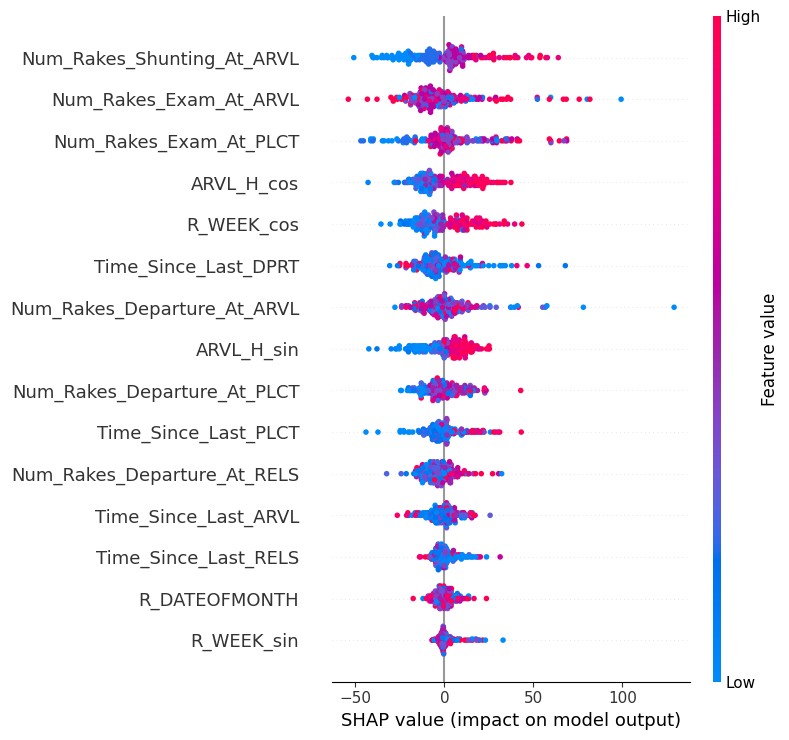

Displaying SHAP Force Plot for instance 0 for LightGBM_AR_TO_PL:


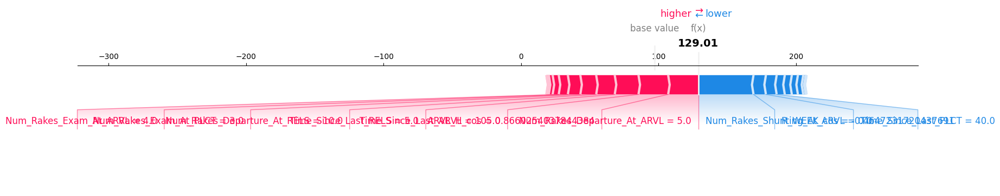


Actual prediction for instance 0: 129.01
Base (Expected) value for LightGBM_AR_TO_PL: 97.18
Interpretation: Red features push the prediction higher, blue features push it lower.

Displaying SHAP Dependence Plot for 'ARVL_H_sin' vs LightGBM_AR_TO_PL:


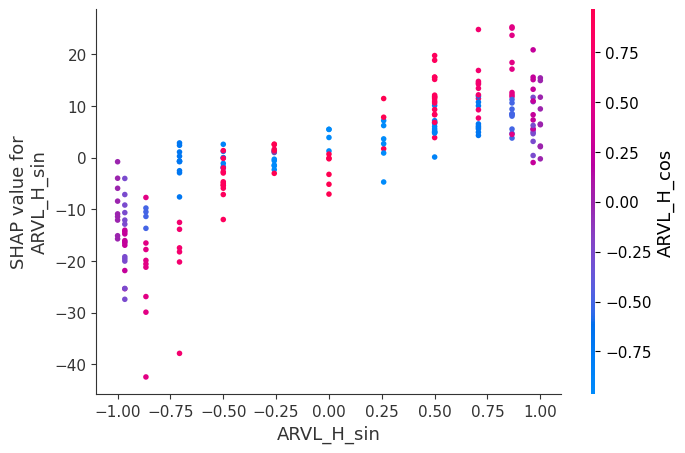

In [796]:
model_to_explain = models[target_to_explain[0]]

explainer1 = shap.TreeExplainer(model_to_explain)

num_samples_to_explain = min(200, X_test.shape[0])
shap_values = explainer1.shap_values(X_test.iloc[:num_samples_to_explain])

print(f"Explaining predictions for {target_to_explain[0]} for {num_samples_to_explain} samples from X_test.")

#Global SHAP Summary Plot (Beeswarm Plot)
print(f"Displaying SHAP Summary Plot for {target_to_explain[0]}:")
shap.summary_plot(shap_values, X_test.iloc[:num_samples_to_explain], plot_type="dot", max_display=15)
#plt.title(f'SHAP Summary for {target_to_explain[0]} (without TOTAL_TIME)')
plt.show()

# Local SHAP Force Plot (for a single prediction)
# Pick a specific instance to explain (e.g., the first one from your test set)
instance_index = 0
if num_samples_to_explain > instance_index:
    print(f"Displaying SHAP Force Plot for instance {instance_index} for {target_to_explain[0]}:")
    base_value = explainer1.expected_value
    shap.force_plot(base_value, shap_values[instance_index], X_test.iloc[instance_index], matplotlib=True)
    #plt.title(f'SHAP Force Plot for Instance {instance_index} ({target_to_explain[0]})')
    plt.show()

    actual_prediction = model_to_explain.predict(X_test.iloc[[instance_index]])[0]
    print(f"\nActual prediction for instance {instance_index}: {actual_prediction:.2f}")
    print(f"Base (Expected) value for {target_to_explain[0]}: {base_value:.2f}")
    print("Interpretation: Red features push the prediction higher, blue features push it lower.")
else:
    print(f"\nNot enough samples ({num_samples_to_explain}) to show force plot for instance {instance_index}. Need at least {instance_index + 1} samples.")

# SHAP Dependence Plot (Feature relationship)
# Example: How 'PLCT_H_sin' (placement hour) affects 'PL_TO_RL' duration.
# You can change 'feature_to_plot' to any other feature you're interested in.
feature_to_plot = 'ARVL_H_sin' # Try other features

if feature_to_plot in X_test.columns and num_samples_to_explain > 0:
    print(f"\nDisplaying SHAP Dependence Plot for '{feature_to_plot}' vs {target_to_explain[0]}:")
    shap.dependence_plot(feature_to_plot, shap_values, X_test.iloc[:num_samples_to_explain])
    #plt.title(f'SHAP Dependence Plot: {feature_to_plot} vs {target_to_explain[0]} (without TOTAL_TIME)')
    plt.show()
else:
    print(f"\nCannot create Dependence Plot: '{feature_to_plot}' not found in features or no samples to explain.")

Explaining predictions for LightGBM_PL_TO_RL for 200 samples from X_test.
Displaying SHAP Summary Plot for LightGBM_PL_TO_RL:


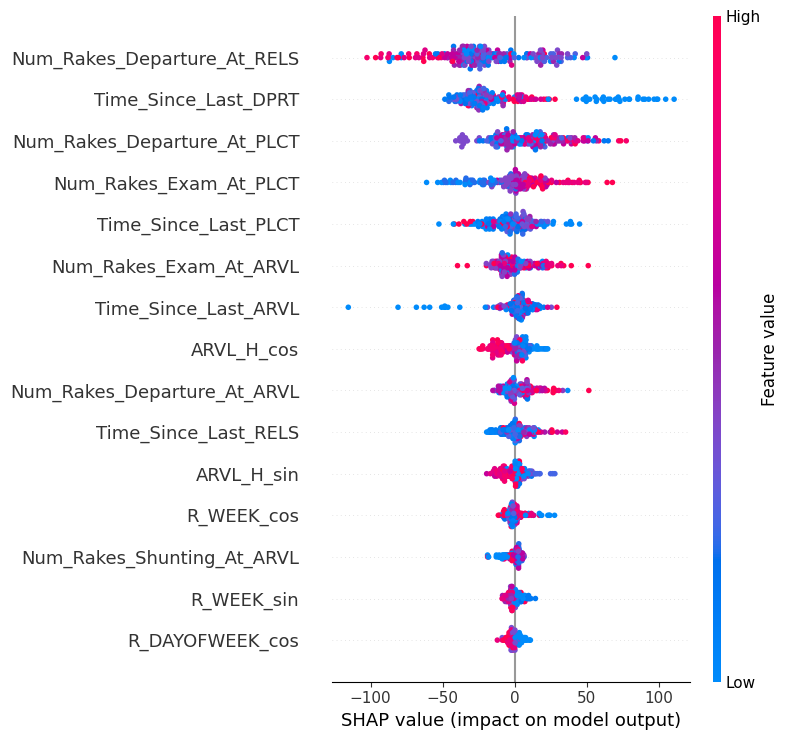

Displaying SHAP Force Plot for instance 0 for LightGBM_PL_TO_RL:


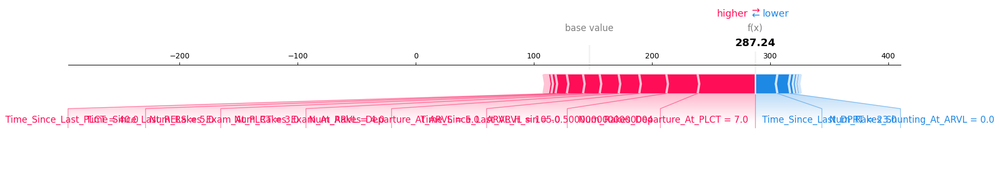


Actual prediction for instance 0: 287.24
Base (Expected) value for LightGBM_PL_TO_RL: 146.95
Interpretation: Red features push the prediction higher, blue features push it lower.

Displaying SHAP Dependence Plot for 'R_DATEOFMONTH' vs LightGBM_PL_TO_RL:


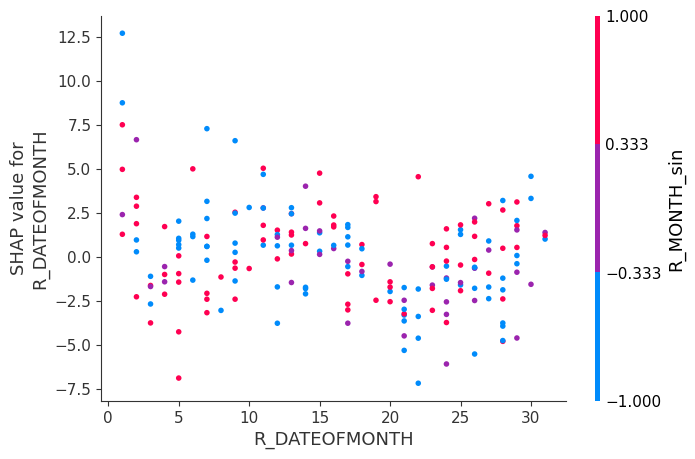

In [797]:
model_to_explain = models[target_to_explain[1]]

explainer1 = shap.TreeExplainer(model_to_explain)

num_samples_to_explain = min(200, X_test.shape[0])
shap_values = explainer1.shap_values(X_test.iloc[:num_samples_to_explain])

print(f"Explaining predictions for {target_to_explain[1]} for {num_samples_to_explain} samples from X_test.")

#Global SHAP Summary Plot (Beeswarm Plot)
print(f"Displaying SHAP Summary Plot for {target_to_explain[1]}:")
shap.summary_plot(shap_values, X_test.iloc[:num_samples_to_explain], plot_type="dot", max_display=15)
#plt.title(f'SHAP Summary for {target_to_explain[1]}')
plt.show()

# Local SHAP Force Plot (for a single prediction)
# Pick a specific instance to explain (e.g., the first one from your test set)
instance_index = 0
if num_samples_to_explain > instance_index:
    print(f"Displaying SHAP Force Plot for instance {instance_index} for {target_to_explain[1]}:")
    base_value = explainer1.expected_value
    shap.force_plot(base_value, shap_values[instance_index], X_test.iloc[instance_index], matplotlib=True)
    #plt.title(f'SHAP Force Plot for Instance {instance_index} ({target_to_explain[1]})')
    plt.show()

    actual_prediction = model_to_explain.predict(X_test.iloc[[instance_index]])[0]
    print(f"\nActual prediction for instance {instance_index}: {actual_prediction:.2f}")
    print(f"Base (Expected) value for {target_to_explain[1]}: {base_value:.2f}")
    print("Interpretation: Red features push the prediction higher, blue features push it lower.")
else:
    print(f"\nNot enough samples ({num_samples_to_explain}) to show force plot for instance {instance_index}. Need at least {instance_index + 1} samples.")

# SHAP Dependence Plot (Feature relationship)
# Example: How 'ARVL_H_sin' (placement hour) affects 'AR_TO_PL' duration.
# You can change 'feature_to_plot' to any other feature you're interested in.
feature_to_plot = 'R_DATEOFMONTH' # Try other features

if feature_to_plot in X_test.columns and num_samples_to_explain > 0:
    print(f"\nDisplaying SHAP Dependence Plot for '{feature_to_plot}' vs {target_to_explain[1]}:")
    shap.dependence_plot(feature_to_plot, shap_values, X_test.iloc[:num_samples_to_explain])
    #plt.title(f'SHAP Dependence Plot: {feature_to_plot} vs {target_to_explain[1]} (without TOTAL_TIME)')
    plt.show()
else:
    print(f"\nCannot create Dependence Plot: '{feature_to_plot}' not found in features or no samples to explain.")

Explaining predictions for LightGBM_RL_TO_DP for 200 samples from X_test.
Displaying SHAP Summary Plot for LightGBM_RL_TO_DP:


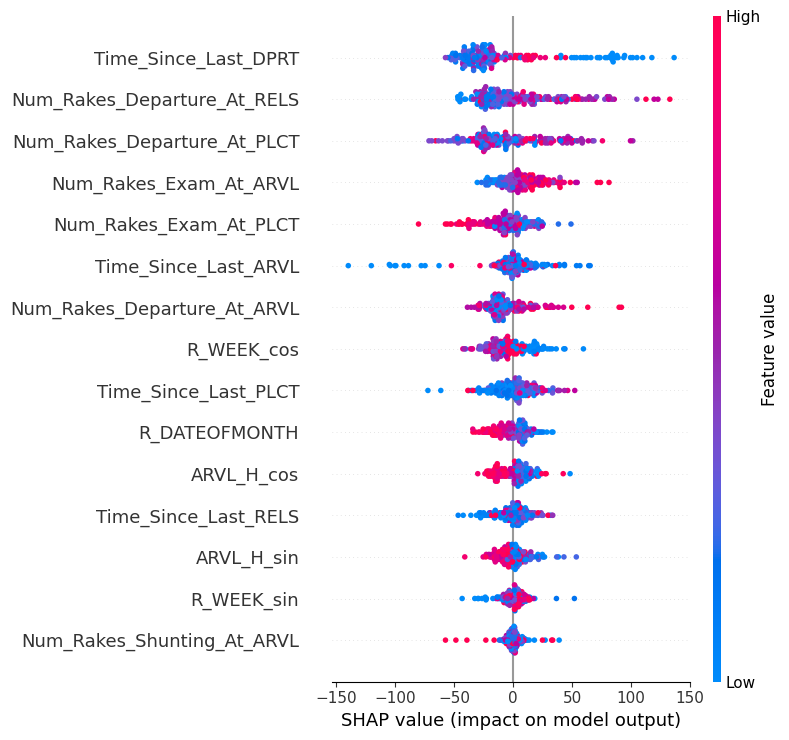

Displaying SHAP Force Plot for instance 0 for LightGBM_RL_TO_DP:


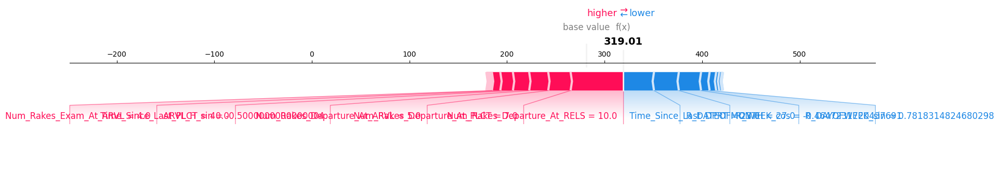


Actual prediction for instance 0: 319.01
Base (Expected) value for LightGBM_RL_TO_DP: 281.24
Interpretation: Red features push the prediction higher, blue features push it lower.

Displaying SHAP Dependence Plot for 'R_DATEOFMONTH' vs LightGBM_RL_TO_DP:


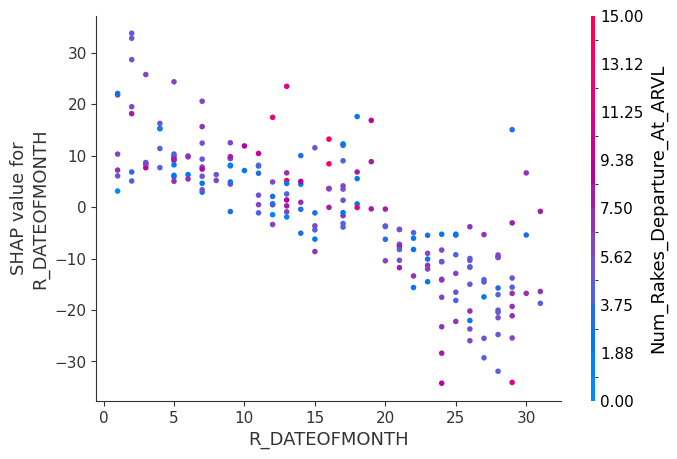

In [798]:
model_to_explain = models[target_to_explain[2]]

explainer1 = shap.TreeExplainer(model_to_explain)

num_samples_to_explain = min(200, X_test.shape[0])
shap_values = explainer1.shap_values(X_test.iloc[:num_samples_to_explain])

print(f"Explaining predictions for {target_to_explain[2]} for {num_samples_to_explain} samples from X_test.")

#Global SHAP Summary Plot (Beeswarm Plot)
print(f"Displaying SHAP Summary Plot for {target_to_explain[2]}:")
shap.summary_plot(shap_values, X_test.iloc[:num_samples_to_explain], plot_type="dot", max_display=15)
#plt.title(f'SHAP Summary for {target_to_explain[2]}')
plt.show()

# Local SHAP Force Plot (for a single prediction)
# Pick a specific instance to explain (e.g., the first one from your test set)
instance_index = 0
if num_samples_to_explain > instance_index:
    print(f"Displaying SHAP Force Plot for instance {instance_index} for {target_to_explain[2]}:")
    base_value = explainer1.expected_value
    shap.force_plot(base_value, shap_values[instance_index], X_test.iloc[instance_index], matplotlib=True)
    #plt.title(f'SHAP Force Plot for Instance {instance_index} ({target_to_explain[2]})')
    plt.show()

    actual_prediction = model_to_explain.predict(X_test.iloc[[instance_index]])[0]
    print(f"\nActual prediction for instance {instance_index}: {actual_prediction:.2f}")
    print(f"Base (Expected) value for {target_to_explain[2]}: {base_value:.2f}")
    print("Interpretation: Red features push the prediction higher, blue features push it lower.")
else:
    print(f"\nNot enough samples ({num_samples_to_explain}) to show force plot for instance {instance_index}. Need at least {instance_index + 1} samples.")

# SHAP Dependence Plot (Feature relationship)
# Example: How 'ARVL_H_sin' (placement hour) affects 'AR_TO_PL' duration.
# You can change 'feature_to_plot' to any other feature you're interested in.
feature_to_plot = 'R_DATEOFMONTH' # Try other features

if feature_to_plot in X_test.columns and num_samples_to_explain > 0:
    print(f"\nDisplaying SHAP Dependence Plot for '{feature_to_plot}' vs {target_to_explain[2]}:")
    shap.dependence_plot(feature_to_plot, shap_values, X_test.iloc[:num_samples_to_explain])
    #plt.title(f'SHAP Dependence Plot: {feature_to_plot} vs {target_to_explain[2]} (without TOTAL_TIME)')
    plt.show()
else:
    print(f"\nCannot create Dependence Plot: '{feature_to_plot}' not found in features or no samples to explain.")